<a href="https://colab.research.google.com/github/Yasir-Arafah/Data-Analytics-Project-with-NYC-Taxi-Data/blob/main/DA_Project_NYC_Taxi_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!apt-get install openjdk-8-jdk-headless -qq > /dev/null

# Install Spark (change the version number if needed)
!wget -q https://archive.apache.org/dist/spark/spark-3.0.3/spark-3.0.3-bin-hadoop3.2.tgz

# Unzip the Spark file to the current folder
!tar xf spark-3.0.3-bin-hadoop3.2.tgz

# Install findspark
!pip install -q findspark

# Set environment variables
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-3.0.3-bin-hadoop3.2"

# Start a SparkSession
import findspark
findspark.init()

# Import SparkSession
from pyspark.sql import SparkSession

# Initialize SparkSession
spark = SparkSession.builder.master("local[*]").getOrCreate()


In [ ]:
# Import necessary libraries
from pyspark.sql.types import FloatType
import matplotlib.pyplot as plt
from pyspark.sql import functions as F
import matplotlib.pyplot as plt
from pyspark.sql.functions import col

In [ ]:
# Load the trip and fare datasets
trip_df = spark.read.csv('/content/drive/MyDrive/DA Lab/trip_data_12.csv', header=True, inferSchema=True)
fare_df = spark.read.csv('/content/drive/MyDrive/DA Lab/trip_fare_12.csv', header=True, inferSchema=True)

# Show the first few rows of each dataframe
trip_df.show(5)
fare_df.show(5)

+--------------------+--------------------+----------+----------+-------------------+-------------------+-------------------+----------------+------------------+--------------+-----------------+----------------+------------------+-----------------+
|           medallion|        hack_license| vendor_id| rate_code| store_and_fwd_flag|    pickup_datetime|   dropoff_datetime| passenger_count| trip_time_in_secs| trip_distance| pickup_longitude| pickup_latitude| dropoff_longitude| dropoff_latitude|
+--------------------+--------------------+----------+----------+-------------------+-------------------+-------------------+----------------+------------------+--------------+-----------------+----------------+------------------+-----------------+
|D7D598CD99978BD01...|82F90D5EFE52FDFD2...|       VTS|         1|               null|2013-12-01 00:13:00|2013-12-01 00:31:00|               1|              1080|           3.9|        -73.97934|       40.776653|        -73.981865|         40.73428|
|545

In [ ]:
# Print schema to verify data types
trip_df.printSchema()
fare_df.printSchema()

root
 |-- medallion: string (nullable = true)
 |--  hack_license: string (nullable = true)
 |--  vendor_id: string (nullable = true)
 |--  rate_code: integer (nullable = true)
 |--  store_and_fwd_flag: string (nullable = true)
 |--  pickup_datetime: string (nullable = true)
 |--  dropoff_datetime: string (nullable = true)
 |--  passenger_count: integer (nullable = true)
 |--  trip_time_in_secs: integer (nullable = true)
 |--  trip_distance: double (nullable = true)
 |--  pickup_longitude: double (nullable = true)
 |--  pickup_latitude: double (nullable = true)
 |--  dropoff_longitude: double (nullable = true)
 |--  dropoff_latitude: double (nullable = true)

root
 |-- medallion: string (nullable = true)
 |--  hack_license: string (nullable = true)
 |--  vendor_id: string (nullable = true)
 |--  pickup_datetime: string (nullable = true)
 |--  payment_type: string (nullable = true)
 |--  fare_amount: double (nullable = true)
 |--  surcharge: double (nullable = true)
 |--  mta_tax: double

In [ ]:
# Print columns of trip_df
print("Trip DataFrame Columns:")
print(trip_df.columns)

# Print columns of fare_df
print("Fare DataFrame Columns:")
print(fare_df.columns)

Trip DataFrame Columns:
['medallion', ' hack_license', ' vendor_id', ' rate_code', ' store_and_fwd_flag', ' pickup_datetime', ' dropoff_datetime', ' passenger_count', ' trip_time_in_secs', ' trip_distance', ' pickup_longitude', ' pickup_latitude', ' dropoff_longitude', ' dropoff_latitude']
Fare DataFrame Columns:
['medallion', ' hack_license', ' vendor_id', ' pickup_datetime', ' payment_type', ' fare_amount', ' surcharge', ' mta_tax', ' tip_amount', ' tolls_amount', ' total_amount']


In [ ]:
# Trim column names for trip_df
trip_df = trip_df.select([F.col(col).alias(col.strip()) for col in trip_df.columns])

# Trim column names for fare_df
fare_df = fare_df.select([F.col(col).alias(col.strip()) for col in fare_df.columns])

# Verify the columns again
print("Trimmed Trip DataFrame Columns:")
print(trip_df.columns)

print("Trimmed Fare DataFrame Columns:")
print(fare_df.columns)

# Join datasets on medallion, hack_license, vendor_id, and pickup_datetime
combined_df = trip_df.join(fare_df, on=['medallion', 'hack_license', 'vendor_id', 'pickup_datetime'], how='inner')

# Show the combined dataframe
combined_df.show(5)

Trimmed Trip DataFrame Columns:
['medallion', 'hack_license', 'vendor_id', 'rate_code', 'store_and_fwd_flag', 'pickup_datetime', 'dropoff_datetime', 'passenger_count', 'trip_time_in_secs', 'trip_distance', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude']
Trimmed Fare DataFrame Columns:
['medallion', 'hack_license', 'vendor_id', 'pickup_datetime', 'payment_type', 'fare_amount', 'surcharge', 'mta_tax', 'tip_amount', 'tolls_amount', 'total_amount']
+--------------------+--------------------+---------+-------------------+---------+------------------+-------------------+---------------+-----------------+-------------+----------------+---------------+-----------------+----------------+------------+-----------+---------+-------+----------+------------+------------+
|           medallion|        hack_license|vendor_id|    pickup_datetime|rate_code|store_and_fwd_flag|   dropoff_datetime|passenger_count|trip_time_in_secs|trip_distance|pickup_longitude|pickup_latitu

In [ ]:
# Get the number of rows
num_rows = combined_df.count()

# Get the number of columns
num_columns = len(combined_df.columns)

# Print the dimensions
print(f"Number of rows: {num_rows}")
print(f"Number of columns: {num_columns}")

Number of rows: 13971118
Number of columns: 21


In [ ]:
# Take the first 100,000 rows
combined_df = combined_df.limit(100000)

In [ ]:
# Get the number of rows
num_rows = combined_df.count()

# Get the number of columns
num_columns = len(combined_df.columns)

# Print the dimensions
print(f"Number of rows: {num_rows}")
print(f"Number of columns: {num_columns}")

Number of rows: 100000
Number of columns: 21


In [ ]:
# List of columns in the combined dataframe
columns = combined_df.columns

# Calculate the count of null values for each column
null_counts_df = combined_df.select([F.count(F.when(F.col(c).isNull(), c)).alias(c) for c in columns])

# Collect the result and convert to a dictionary
null_counts = null_counts_df.collect()[0].asDict()

# Display the count of null values for each column
for column, count in null_counts.items():
    print(f"Column: {column}, Null Values Count: {count}")

Column: medallion, Null Values Count: 0
Column: hack_license, Null Values Count: 0
Column: vendor_id, Null Values Count: 0
Column: pickup_datetime, Null Values Count: 0
Column: rate_code, Null Values Count: 0
Column: store_and_fwd_flag, Null Values Count: 50573
Column: dropoff_datetime, Null Values Count: 0
Column: passenger_count, Null Values Count: 0
Column: trip_time_in_secs, Null Values Count: 0
Column: trip_distance, Null Values Count: 0
Column: pickup_longitude, Null Values Count: 0
Column: pickup_latitude, Null Values Count: 0
Column: dropoff_longitude, Null Values Count: 1
Column: dropoff_latitude, Null Values Count: 1
Column: payment_type, Null Values Count: 0
Column: fare_amount, Null Values Count: 0
Column: surcharge, Null Values Count: 0
Column: mta_tax, Null Values Count: 0
Column: tip_amount, Null Values Count: 0
Column: tolls_amount, Null Values Count: 0
Column: total_amount, Null Values Count: 0


In [ ]:
# Drop rows where dropoff_longitude and dropoff_latitude have null values
combined_df = combined_df.dropna(subset=['dropoff_longitude', 'dropoff_latitude'])

# Show the number of rows after dropping
num_rows_after_drop = combined_df.count()
print(f"Number of rows after dropping null values: {num_rows_after_drop}")

Number of rows after dropping null values: 99999


In [ ]:
# List of columns in the combined dataframe
columns = combined_df.columns

# Calculate the count of null values for each column
null_counts_df = combined_df.select([F.count(F.when(F.col(c).isNull(), c)).alias(c) for c in columns])

# Collect the result and convert to a dictionary
null_counts = null_counts_df.collect()[0].asDict()

# Display the count of null values for each column
for column, count in null_counts.items():
    print(f"Column: {column}, Null Values Count: {count}")

Column: medallion, Null Values Count: 0
Column: hack_license, Null Values Count: 0
Column: vendor_id, Null Values Count: 0
Column: pickup_datetime, Null Values Count: 0
Column: rate_code, Null Values Count: 0
Column: store_and_fwd_flag, Null Values Count: 50572
Column: dropoff_datetime, Null Values Count: 0
Column: passenger_count, Null Values Count: 0
Column: trip_time_in_secs, Null Values Count: 0
Column: trip_distance, Null Values Count: 0
Column: pickup_longitude, Null Values Count: 0
Column: pickup_latitude, Null Values Count: 0
Column: dropoff_longitude, Null Values Count: 0
Column: dropoff_latitude, Null Values Count: 0
Column: payment_type, Null Values Count: 0
Column: fare_amount, Null Values Count: 0
Column: surcharge, Null Values Count: 0
Column: mta_tax, Null Values Count: 0
Column: tip_amount, Null Values Count: 0
Column: tolls_amount, Null Values Count: 0
Column: total_amount, Null Values Count: 0


# Geospatial Analysis

 Distribution of Pickups and Dropoffs

In [ ]:
# Analyze pickup locations
pickup_locations = combined_df.groupBy('pickup_longitude', 'pickup_latitude').count().orderBy(F.desc('count'))
pickup_locations.show(10)

# Analyze dropoff locations
dropoff_locations = combined_df.groupBy('dropoff_longitude', 'dropoff_latitude').count().orderBy(F.desc('count'))
dropoff_locations.show(10)

+----------------+---------------+-----+
|pickup_longitude|pickup_latitude|count|
+----------------+---------------+-----+
|             0.0|            0.0| 1555|
|       -73.96167|      40.774151|   13|
|       -73.83461|      40.765968|   13|
|      -73.948723|      40.744843|    8|
|      -73.793983|      40.656971|    7|
|      -73.974815|      40.618103|    4|
|       -73.77668|      40.645309|    3|
|      -74.004021|      40.747768|    3|
|      -73.789169|      40.641808|    3|
|      -73.964592|      40.760124|    3|
+----------------+---------------+-----+
only showing top 10 rows

+-----------------+----------------+-----+
|dropoff_longitude|dropoff_latitude|count|
+-----------------+----------------+-----+
|              0.0|             0.0| 1605|
|        -73.96167|       40.774151|   13|
|        -73.83461|       40.765968|   13|
|       -73.948723|       40.744843|    8|
|       -73.793983|       40.656971|    7|
|       -73.974815|       40.618103|    4|
|        -73.

In [ ]:
# Remove rows with outliers
test = combined_df.filter((combined_df.pickup_longitude != 0.0) &
                                (combined_df.pickup_latitude != 0.0) &
                                (combined_df.dropoff_longitude != 0.0) &
                                (combined_df.dropoff_latitude != 0.0))

# Show the number of rows after filtering
num_rows_after_filter = test.count()
print(f"Number of rows after filtering: {num_rows_after_filter}")

# Show some rows to verify
print("Data after removing outliers:")
test.show(10)

Number of rows after filtering: 98325
Data after removing outliers:
+--------------------+--------------------+---------+-------------------+---------+------------------+-------------------+---------------+-----------------+-------------+----------------+---------------+-----------------+----------------+------------+-----------+---------+-------+----------+------------+------------+
|           medallion|        hack_license|vendor_id|    pickup_datetime|rate_code|store_and_fwd_flag|   dropoff_datetime|passenger_count|trip_time_in_secs|trip_distance|pickup_longitude|pickup_latitude|dropoff_longitude|dropoff_latitude|payment_type|fare_amount|surcharge|mta_tax|tip_amount|tolls_amount|total_amount|
+--------------------+--------------------+---------+-------------------+---------+------------------+-------------------+---------------+-----------------+-------------+----------------+---------------+-----------------+----------------+------------+-----------+---------+-------+----------+--

In [ ]:
combined_df = test

**Restart from here**

In [ ]:
# Path to your CSV file
csv_file_path = "/content/drive/MyDrive/DA Lab/combined_df.csv"

# Read the CSV file into a Spark DataFrame
combined_df = spark.read.csv(csv_file_path, header=True, inferSchema=True)

In [ ]:
# Analyze pickup locations AGAIN
pickup_locations = combined_df.groupBy('pickup_longitude', 'pickup_latitude').count().orderBy(F.desc('count'))
pickup_locations.show(10)

# Analyze dropoff locations AGAIN
dropoff_locations = combined_df.groupBy('dropoff_longitude', 'dropoff_latitude').count().orderBy(F.desc('count'))
dropoff_locations.show(10)

+----------------+---------------+-----+
|pickup_longitude|pickup_latitude|count|
+----------------+---------------+-----+
|       -73.83461|      40.765968|   13|
|       -73.96167|      40.774151|   13|
|      -73.948723|      40.744843|    8|
|      -73.793983|      40.656971|    7|
|      -73.974815|      40.618103|    4|
|       -73.77668|      40.645309|    3|
|      -74.004021|      40.747768|    3|
|      -73.964592|      40.760124|    3|
|      -73.789169|      40.641808|    3|
|      -73.776733|      40.645435|    3|
+----------------+---------------+-----+
only showing top 10 rows

+-----------------+----------------+-----+
|dropoff_longitude|dropoff_latitude|count|
+-----------------+----------------+-----+
|        -73.83461|       40.765968|   13|
|        -73.96167|       40.774151|   13|
|       -73.948723|       40.744843|    8|
|       -73.793983|       40.656971|    7|
|       -73.974815|       40.618103|    4|
|        -73.99131|       40.750198|    3|
|       -73.9

In [ ]:
# Get the number of rows
num_rows = combined_df.count()

# Get the number of columns
num_columns = len(combined_df.columns)

# Print the dimensions
print(f"Number of rows: {num_rows}")
print(f"Number of columns: {num_columns}")

Number of rows: 98325
Number of columns: 21


1.What are the most common pickup locations?

+----------------+---------------+-----+
|pickup_longitude|pickup_latitude|count|
+----------------+---------------+-----+
|       -73.83461|      40.765968|   13|
|       -73.96167|      40.774151|   13|
|      -73.948723|      40.744843|    8|
|      -73.793983|      40.656971|    7|
|      -73.974815|      40.618103|    4|
|       -73.77668|      40.645309|    3|
|      -73.776733|      40.645435|    3|
|      -74.004021|      40.747768|    3|
|      -73.964592|      40.760124|    3|
|      -73.789169|      40.641808|    3|
|      -73.989075|      40.726871|    2|
|      -73.974113|      40.756546|    2|
|      -74.002853|       40.76049|    2|
|      -73.991585|      40.750061|    2|
|      -73.985535|      40.738304|    2|
|      -73.990211|      40.746445|    2|
|      -73.874428|      40.773975|    2|
|       -74.00251|      40.750156|    2|
|      -73.985756|      40.759369|    2|
|      -73.989578|      40.729942|    2|
+----------------+---------------+-----+
only showing top

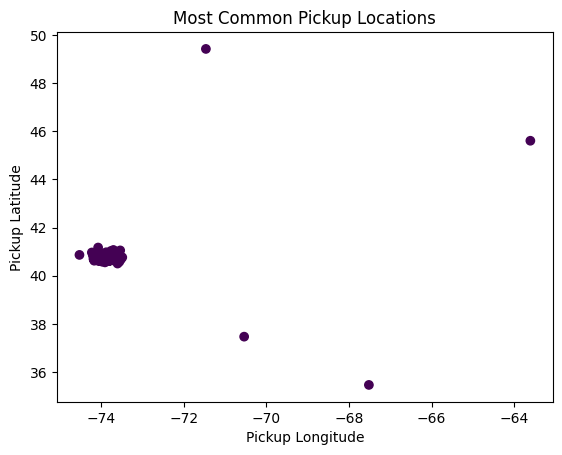

In [ ]:
pickup_locations = combined_df.groupBy('pickup_longitude', 'pickup_latitude').count().orderBy(F.desc('count'))
pickup_locations.show()

# Visualization
pickup_locations_pd = pickup_locations.toPandas()
plt.scatter(pickup_locations_pd['pickup_longitude'], pickup_locations_pd['pickup_latitude'], c=pickup_locations_pd['count'], cmap='viridis')
plt.xlabel('Pickup Longitude')
plt.ylabel('Pickup Latitude')
plt.title('Most Common Pickup Locations')
plt.show()

2.What are the most common dropoff locations?

+-----------------+----------------+-----+
|dropoff_longitude|dropoff_latitude|count|
+-----------------+----------------+-----+
|        -73.83461|       40.765968|   13|
|        -73.96167|       40.774151|   13|
|       -73.948723|       40.744843|    8|
|       -73.793983|       40.656971|    7|
|       -73.974815|       40.618103|    4|
|        -73.99131|       40.750198|    3|
|       -73.964592|       40.760124|    3|
|       -74.011726|       40.707989|    2|
|       -74.004456|       40.742397|    2|
|       -73.971642|       40.763931|    2|
+-----------------+----------------+-----+
only showing top 10 rows



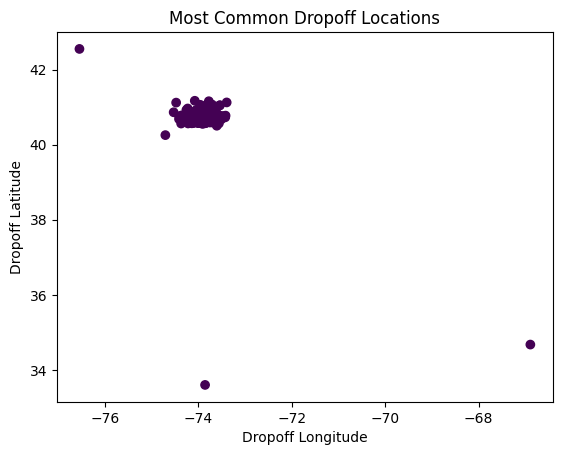

In [ ]:
dropoff_locations = combined_df.groupBy('dropoff_longitude', 'dropoff_latitude').count().orderBy(F.desc('count'))
dropoff_locations.show(10)

# Visualization
dropoff_locations_pd = dropoff_locations.toPandas()
plt.scatter(dropoff_locations_pd['dropoff_longitude'], dropoff_locations_pd['dropoff_latitude'], c=dropoff_locations_pd['count'], cmap='viridis')
plt.xlabel('Dropoff Longitude')
plt.ylabel('Dropoff Latitude')
plt.title('Most Common Dropoff Locations')
plt.show()

3.What is the distribution of trip distances?

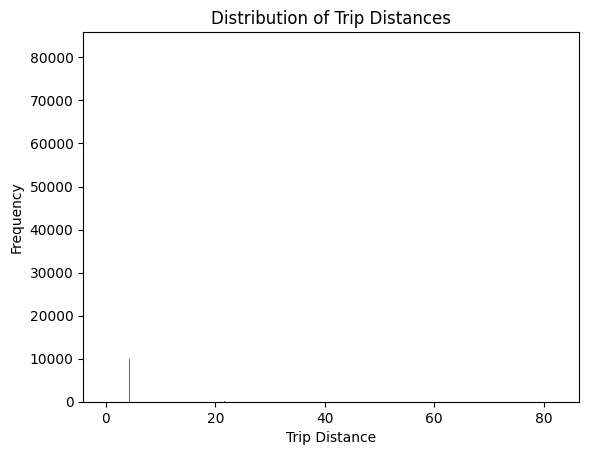

In [ ]:
trip_distance_hist = combined_df.select('trip_distance').rdd.flatMap(lambda x: x).histogram(20)

# Visualization
plt.bar(trip_distance_hist[0][:-1], trip_distance_hist[1], width=0.05, color='blue', alpha=0.7)
plt.xlabel('Trip Distance')
plt.ylabel('Frequency')
plt.title('Distribution of Trip Distances')
plt.show()

4.What is the average fare amount for each pickup location?

+----------------+---------------+--------+
|pickup_longitude|pickup_latitude|avg_fare|
+----------------+---------------+--------+
|      -73.981934|      40.775616|     9.5|
|      -73.973137|      40.787716|    20.5|
|      -73.954247|      40.772976|     6.5|
|      -73.993698|      40.751553|     4.5|
|      -73.984329|      40.746529|    10.5|
|      -73.965523|      40.791008|     5.5|
|      -73.975739|      40.782009|    11.0|
|      -73.986763|      40.777084|    71.0|
|      -73.983505|      40.771416|     6.5|
|      -73.978462|      40.773113|    10.0|
+----------------+---------------+--------+
only showing top 10 rows



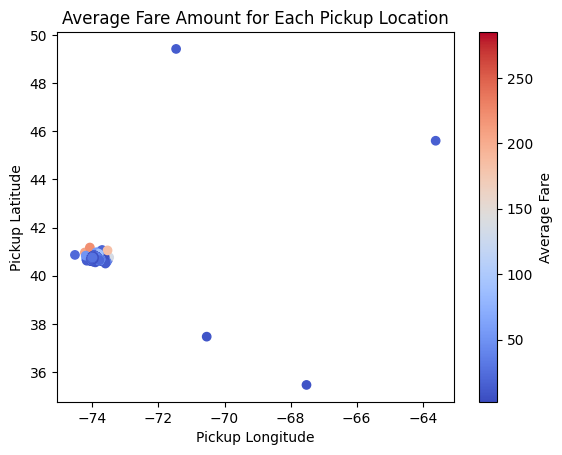

In [ ]:
avg_fare_pickup = combined_df.groupBy('pickup_longitude', 'pickup_latitude').agg(F.avg('fare_amount').alias('avg_fare'))
avg_fare_pickup.show(10)

# Visualization
avg_fare_pickup_pd = avg_fare_pickup.toPandas()
plt.scatter(avg_fare_pickup_pd['pickup_longitude'], avg_fare_pickup_pd['pickup_latitude'], c=avg_fare_pickup_pd['avg_fare'], cmap='coolwarm')
plt.colorbar(label='Average Fare')
plt.xlabel('Pickup Longitude')
plt.ylabel('Pickup Latitude')
plt.title('Average Fare Amount for Each Pickup Location')
plt.show()

In [ ]:
# Save combined_df as CSV
combined_df.write.option("header", "true").csv("/content/drive/MyDrive/DA Lab/combined_df.csv")

In [ ]:
# Specify the folder path
folder_path = "/content/drive/MyDrive/DA Lab/combined_df.csv"

# Read the CSV files in the folder into a single DataFrame
combined_df = spark.read.option("header", "true").csv(folder_path)

# Show the DataFrame
combined_df.show(5)

+--------------------+--------------------+---------+-------------------+---------+------------------+-------------------+---------------+-----------------+-------------+----------------+---------------+-----------------+----------------+------------+-----------+---------+-------+----------+------------+------------+
|           medallion|        hack_license|vendor_id|    pickup_datetime|rate_code|store_and_fwd_flag|   dropoff_datetime|passenger_count|trip_time_in_secs|trip_distance|pickup_longitude|pickup_latitude|dropoff_longitude|dropoff_latitude|payment_type|fare_amount|surcharge|mta_tax|tip_amount|tolls_amount|total_amount|
+--------------------+--------------------+---------+-------------------+---------+------------------+-------------------+---------------+-----------------+-------------+----------------+---------------+-----------------+----------------+------------+-----------+---------+-------+----------+------------+------------+
|00005007A9F30E289...|24C122A944FB8EE21...|

5.What are the most common pickup and dropoff location pairs?

In [ ]:
location_pairs = combined_df.groupBy('pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude').count().orderBy(F.desc('count'))
location_pairs.show(10)

+----------------+---------------+-----------------+----------------+-----+
|pickup_longitude|pickup_latitude|dropoff_longitude|dropoff_latitude|count|
+----------------+---------------+-----------------+----------------+-----+
|       -73.96167|      40.774151|        -73.96167|       40.774151|   13|
|       -73.83461|      40.765968|        -73.83461|       40.765968|   13|
|      -73.948723|      40.744843|       -73.948723|       40.744843|    8|
|      -73.793983|      40.656971|       -73.793983|       40.656971|    7|
|      -73.974815|      40.618103|       -73.974815|       40.618103|    4|
|      -73.964592|      40.760124|       -73.964592|       40.760124|    3|
|       -73.93409|      40.752357|        -73.93409|       40.752357|    2|
|      -73.966042|      40.762218|       -73.966042|       40.762218|    2|
|      -73.967308|      40.769211|       -73.967308|       40.769211|    2|
|      -73.866943|      40.770805|       -73.866943|       40.770805|    2|
+-----------

6.What is the distribution of trip distances for each pickup location?

+----------------+---------------+---------+
|pickup_longitude|pickup_latitude|distances|
+----------------+---------------+---------+
|      -73.776733|      40.645123|   [17.5]|
|      -73.788078|      40.641541|  [19.67]|
|      -73.789314|      40.647285|  [11.75]|
|       -73.78936|      40.647072|  [18.48]|
|      -73.789551|      40.646744|   [14.2]|
|      -73.789803|      40.643806|   [7.37]|
|      -73.789909|      40.646629|  [17.56]|
|      -73.790771|      40.643852|   [18.1]|
|      -73.862747|      40.768753|   [7.58]|
|      -73.862747|      40.769035|  [10.11]|
+----------------+---------------+---------+
only showing top 10 rows



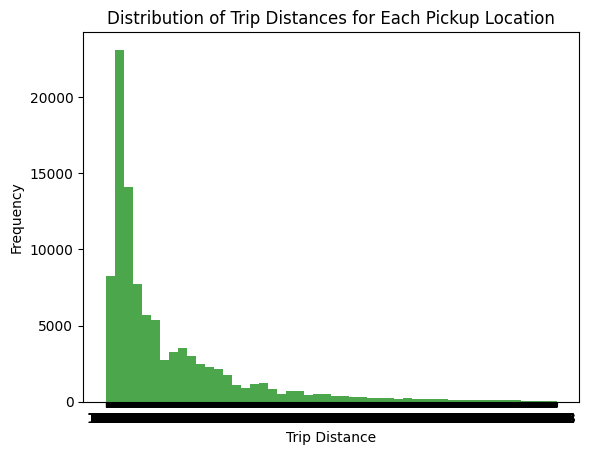

In [ ]:
trip_distance_pickup = combined_df.groupBy('pickup_longitude', 'pickup_latitude').agg(F.collect_list('trip_distance').alias('distances'))
trip_distance_pickup.show(10)

# Visualization
trip_distance_pickup_pd = trip_distance_pickup.toPandas()
plt.hist(trip_distance_pickup_pd['distances'].explode(), bins=50, color='green', alpha=0.7)
plt.xlabel('Trip Distance')
plt.ylabel('Frequency')
plt.title('Distribution of Trip Distances for Each Pickup Location')
plt.show()

7.What is the distribution of trip distances for each dropoff location?

+-----------------+----------------+---------+
|dropoff_longitude|dropoff_latitude|distances|
+-----------------+----------------+---------+
|       -73.648613|       40.657639|   [10.4]|
|       -73.732758|       40.672108|   [5.63]|
|       -73.776299|       40.645611|   [17.5]|
|       -73.776299|       40.645641|  [15.66]|
|       -73.779778|       40.645363|  [17.35]|
|       -73.786179|       40.644077|   [17.1]|
|       -73.787712|       40.848469|   [19.5]|
|       -73.790337|       40.643799|  [19.01]|
|       -73.802437|        40.66444|  [15.61]|
|       -73.823235|       40.703773|    [6.0]|
+-----------------+----------------+---------+
only showing top 10 rows



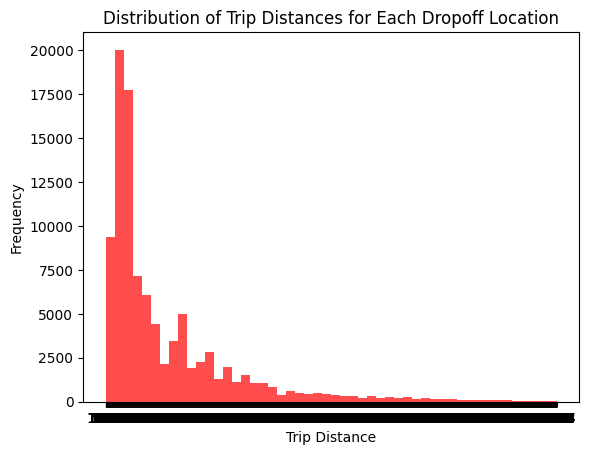

In [ ]:
trip_distance_dropoff = combined_df.groupBy('dropoff_longitude', 'dropoff_latitude').agg(F.collect_list('trip_distance').alias('distances'))
trip_distance_dropoff.show(10)

# Visualization
trip_distance_dropoff_pd = trip_distance_dropoff.toPandas()
plt.hist(trip_distance_dropoff_pd['distances'].explode(), bins=50, color='red', alpha=0.7)
plt.xlabel('Trip Distance')
plt.ylabel('Frequency')
plt.title('Distribution of Trip Distances for Each Dropoff Location')
plt.show()

8.What are the top 10 longest trips by distance?

In [ ]:
longest_trips = combined_df.orderBy(F.desc('trip_distance')).select('medallion', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'trip_distance')
longest_trips.show(10)

+--------------------+----------------+---------------+-----------------+----------------+-------------+
|           medallion|pickup_longitude|pickup_latitude|dropoff_longitude|dropoff_latitude|trip_distance|
+--------------------+----------------+---------------+-----------------+----------------+-------------+
|01F9F5C3B207C3D05...|        -73.9823|      40.731808|        -73.93824|       40.839661|         9.99|
|895FDE7E0FD38AE85...|      -73.998001|      40.691341|       -73.893822|       40.631126|         9.99|
|5240FDF598BDDB07F...|      -73.974564|      40.756351|       -73.865448|       40.770832|         9.99|
|A0178FFB6444CB042...|      -73.981155|      40.732586|       -73.861343|       40.768074|         9.99|
|615AC6711C6F889D9...|      -74.005669|      40.726513|       -73.936539|       40.840343|         9.99|
|7A0FD35211C6CE1BB...|      -74.004021|      40.732777|       -74.014824|       40.709465|         9.98|
|31170AD1B6FC27057...|      -73.776749|      40.645443|

9.What are the top 10 shortest trips by distance?

In [ ]:
shortest_trips = combined_df.orderBy('trip_distance').select('medallion', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'trip_distance')
shortest_trips.show(10)

+--------------------+----------------+---------------+-----------------+----------------+-------------+
|           medallion|pickup_longitude|pickup_latitude|dropoff_longitude|dropoff_latitude|trip_distance|
+--------------------+----------------+---------------+-----------------+----------------+-------------+
|E772FEDFB061CE37B...|      -74.033005|      40.739971|       -74.033005|       40.739971|          0.0|
|ECB99E39D0FEBA193...|      -73.989944|      40.691204|        -73.98996|       40.691181|          0.0|
|E8AD74E6FA650D100...|      -73.862251|      40.768692|       -73.862244|       40.768719|          0.0|
|E6FBF80668FE0611A...|      -73.993774|      40.754089|       -73.993324|       40.753902|          0.0|
|E90322F818053DC31...|      -73.970352|      40.759235|       -73.967377|       40.733013|          0.0|
|E710838D39BF82BE6...|       -74.07843|      40.702869|       -74.078438|       40.702866|          0.0|
|E9FD29C830D1C3D9C...|      -73.901894|      40.764118|

10.What are the top 10 highest fare trips?

---



In [ ]:
highest_fare_trips = combined_df.orderBy(F.desc('fare_amount')).select('medallion', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'fare_amount')
highest_fare_trips.show(10)

+--------------------+----------------+---------------+-----------------+----------------+-----------+
|           medallion|pickup_longitude|pickup_latitude|dropoff_longitude|dropoff_latitude|fare_amount|
+--------------------+----------------+---------------+-----------------+----------------+-----------+
|CEA2992D79D935F5A...|      -73.874641|      40.774143|       -74.006294|       40.873585|      96.75|
|3905B2EAD1DAE00DC...|      -73.894485|      40.765858|       -74.035835|       40.714508|       96.0|
|79B2FA48F34025FAD...|      -73.776749|      40.645199|       -73.776268|       40.645412|       95.5|
|1AABA72EE93B8066C...|      -74.176994|      40.694912|       -74.176994|       40.694912|       95.0|
|024BE2DFD1B98AF1E...|      -73.783798|      40.648636|       -73.591232|       40.742233|       92.0|
|BA785A820F2E4EFFA...|      -73.972183|      40.749737|       -74.174782|       40.734188|       92.0|
|8FA70F4D885EDC95A...|       -73.78186|       40.64481|       -73.863319|

11.What are the top 10 lowest fare trips?

In [ ]:
lowest_fare_trips = combined_df.orderBy('fare_amount').select('medallion', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'fare_amount')
lowest_fare_trips.show(10)

+--------------------+----------------+---------------+-----------------+----------------+-----------+
|           medallion|pickup_longitude|pickup_latitude|dropoff_longitude|dropoff_latitude|fare_amount|
+--------------------+----------------+---------------+-----------------+----------------+-----------+
|E08257C19B97E7B6B...|      -73.982063|      40.744164|       -73.961838|       40.771984|       10.0|
|E12B223C548E0B934...|      -73.991356|      40.744743|       -73.982635|       40.770622|       10.0|
|E091D4271ECE28C8F...|      -73.998978|      40.717453|       -73.984024|       40.737484|       10.0|
|E08257C19B97E7B6B...|      -73.997948|      40.722073|       -73.979927|       40.735104|       10.0|
|E0B0E791526336BE7...|      -73.952232|      40.777172|       -73.972298|        40.75927|       10.0|
|DFACA41136968CD70...|      -73.982162|      40.775742|       -73.964172|       40.809399|       10.0|
|E0BC66DD4EACB5C27...|      -73.979767|      40.743553|       -73.987625|

12.What is the average fare amount for trips with different payment types?

+------------+------------------+
|payment_type|          avg_fare|
+------------+------------------+
|         CSH|11.512046058458813|
|         DIS| 11.17142857142857|
|         CRD|13.434113468423858|
|         UNK|13.013812154696133|
|         NOC|12.602222222222222|
+------------+------------------+



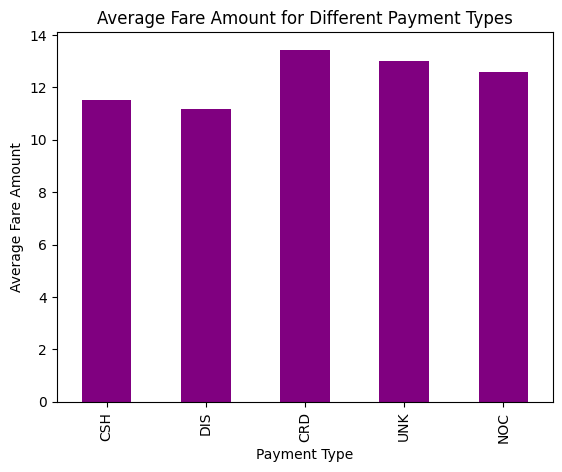

In [ ]:
avg_fare_payment_type = combined_df.groupBy('payment_type').agg(F.avg('fare_amount').alias('avg_fare'))
avg_fare_payment_type.show()

# Visualization
avg_fare_payment_type_pd = avg_fare_payment_type.toPandas()
avg_fare_payment_type_pd.plot(kind='bar', x='payment_type', y='avg_fare', legend=None, color='purple')
plt.xlabel('Payment Type')
plt.ylabel('Average Fare Amount')
plt.title('Average Fare Amount for Different Payment Types')
plt.show()

13. What is the distribution of payment types?

+------------+-----+
|payment_type|count|
+------------+-----+
|         CRD|52508|
|         CSH|45160|
|         UNK|  362|
|         NOC|  225|
|         DIS|   70|
+------------+-----+



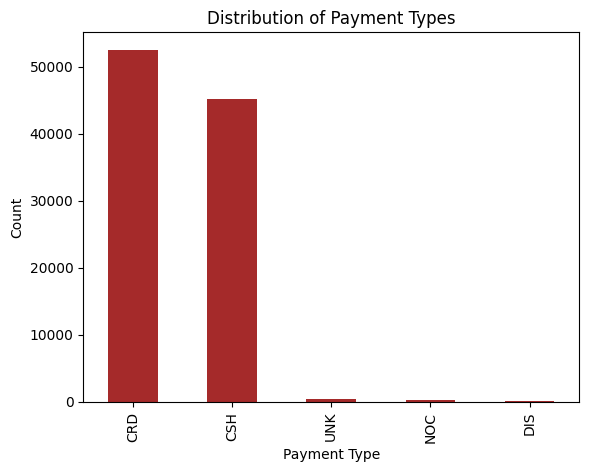

In [ ]:
payment_type_dist = combined_df.groupBy('payment_type').count().orderBy(F.desc('count'))
payment_type_dist.show()

# Visualization
payment_type_dist_pd = payment_type_dist.toPandas()
payment_type_dist_pd.plot(kind='bar', x='payment_type', y='count', legend=None, color='brown')
plt.xlabel('Payment Type')
plt.ylabel('Count')
plt.title('Distribution of Payment Types')
plt.show()

14. What is the average tip amount for trips with different payment types?

+------------+------------------+
|payment_type|           avg_tip|
+------------+------------------+
|         CSH|               0.0|
|         DIS|               0.0|
|         CRD|2.6199853355679337|
|         UNK|2.2714917127071814|
|         NOC|               0.0|
+------------+------------------+



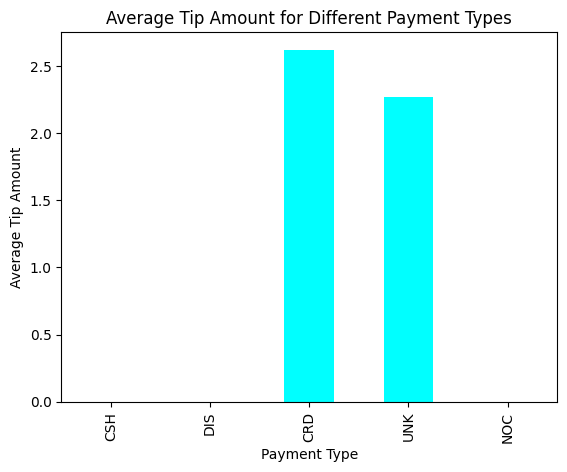

In [ ]:
avg_tip_payment_type = combined_df.groupBy('payment_type').agg(F.avg('tip_amount').alias('avg_tip'))
avg_tip_payment_type.show()

# Visualization
avg_tip_payment_type_pd = avg_tip_payment_type.toPandas()
avg_tip_payment_type_pd.plot(kind='bar', x='payment_type', y='avg_tip', legend=None, color='cyan')
plt.xlabel('Payment Type')
plt.ylabel('Average Tip Amount')
plt.title('Average Tip Amount for Different Payment Types')
plt.show()

15. What is the average trip distance for different payment types?

+------------+------------------+
|payment_type|      avg_distance|
+------------+------------------+
|         CSH|2.5926419397697127|
|         DIS| 2.265714285714285|
|         CRD|3.1919726517863745|
|         UNK|3.1423204419889497|
|         NOC| 2.187999999999999|
+------------+------------------+



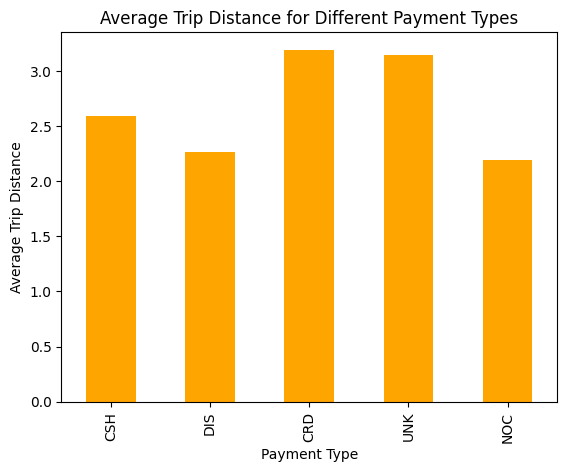

In [ ]:
avg_distance_payment_type = combined_df.groupBy('payment_type').agg(F.avg('trip_distance').alias('avg_distance'))
avg_distance_payment_type.show()

# Visualization
avg_distance_payment_type_pd = avg_distance_payment_type.toPandas()
avg_distance_payment_type_pd.plot(kind='bar', x='payment_type', y='avg_distance', legend=None, color='orange')
plt.xlabel('Payment Type')
plt.ylabel('Average Trip Distance')
plt.title('Average Trip Distance for Different Payment Types')
plt.show()

16. What is the total fare amount collected for different payment types?

+------------+-----------------+
|payment_type|       total_fare|
+------------+-----------------+
|         CSH|         519884.0|
|         DIS|            782.0|
|         CRD|705398.4299999999|
|         UNK|           4711.0|
|         NOC|           2835.5|
+------------+-----------------+



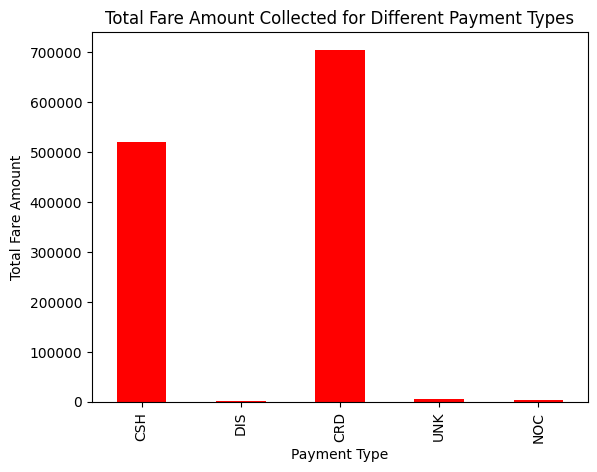

In [ ]:
total_fare_payment_type = combined_df.groupBy('payment_type').agg(F.sum('fare_amount').alias('total_fare'))
total_fare_payment_type.show()

# Visualization
total_fare_payment_type_pd = total_fare_payment_type.toPandas()
total_fare_payment_type_pd.plot(kind='bar', x='payment_type', y='total_fare', legend=None, color='red')
plt.xlabel('Payment Type')
plt.ylabel('Total Fare Amount')
plt.title('Total Fare Amount Collected for Different Payment Types')
plt.show()

17. What are the top 10 most expensive trips by total amount?

In [ ]:
most_expensive_trips = combined_df.orderBy(F.desc('total_amount')).select('medallion', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'total_amount')
most_expensive_trips.show(10)

+--------------------+----------------+---------------+-----------------+----------------+------------+
|           medallion|pickup_longitude|pickup_latitude|dropoff_longitude|dropoff_latitude|total_amount|
+--------------------+----------------+---------------+-----------------+----------------+------------+
|2BCE72DAD8994FC64...|      -73.869583|      40.771721|       -74.043419|       40.788212|        99.6|
|86B59602C6E33C464...|      -73.981888|      40.752243|       -74.177773|       40.690224|        99.6|
|0D69FB9685364A087...|      -73.980843|      40.774616|       -73.926224|       40.866501|        99.5|
|0AE605C79E9EBC1FE...|      -73.985695|      40.760853|        -74.17691|       40.694687|        99.5|
|3246AA03B71806230...|      -74.006721|      40.744102|       -74.006706|       40.744125|        99.5|
|FAAAFA3F332009DC2...|      -73.973656|      40.763966|       -74.177467|       40.695251|        99.0|
|240E92D67E4EA502E...|      -73.980568|      40.763847|       -7

18. What is the distribution of trip durations for different pickup locations?

+----------------+---------------+---------+
|pickup_longitude|pickup_latitude|durations|
+----------------+---------------+---------+
|      -73.776733|      40.645123|   [5069]|
|      -73.788078|      40.641541|   [4080]|
|      -73.789314|      40.647285|   [2220]|
|       -73.78936|      40.647072|   [1500]|
|      -73.789551|      40.646744|   [3743]|
|      -73.789803|      40.643806|    [960]|
|      -73.789909|      40.646629|   [5220]|
|      -73.790771|      40.643852|   [2802]|
|      -73.862747|      40.768753|   [1080]|
|      -73.862747|      40.769035|   [1320]|
+----------------+---------------+---------+
only showing top 10 rows



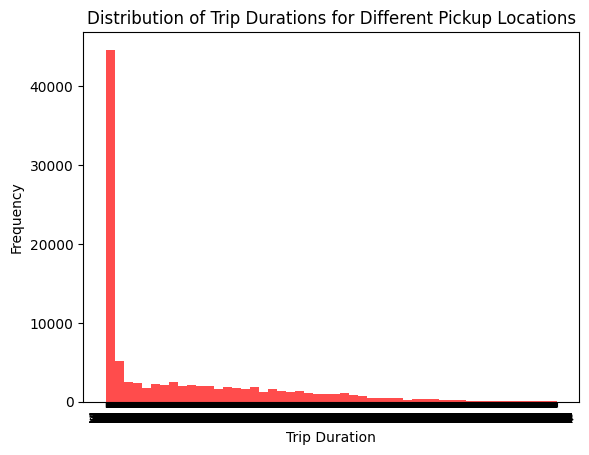

In [ ]:
duration_pickup_dist = combined_df.groupBy('pickup_longitude', 'pickup_latitude').agg(F.collect_list('trip_time_in_secs').alias('durations'))
duration_pickup_dist.show(10)

# Visualization
duration_pickup_dist_pd = duration_pickup_dist.toPandas()
plt.hist(duration_pickup_dist_pd['durations'].explode(), bins=50, color='red', alpha=0.7)
plt.xlabel('Trip Duration')
plt.ylabel('Frequency')
plt.title('Distribution of Trip Durations for Different Pickup Locations')
plt.show()

19. What is the distribution of trip durations for different dropoff locations?

+-----------------+----------------+---------+
|dropoff_longitude|dropoff_latitude|durations|
+-----------------+----------------+---------+
|       -73.648613|       40.657639|   [1581]|
|       -73.732758|       40.672108|    [720]|
|       -73.776299|       40.645611|   [3438]|
|       -73.776299|       40.645641|   [2700]|
|       -73.779778|       40.645363|   [2460]|
|       -73.786179|       40.644077|   [4146]|
|       -73.787712|       40.848469|   [1584]|
|       -73.790337|       40.643799|   [1500]|
|       -73.802437|        40.66444|   [1140]|
|       -73.823235|       40.703773|    [713]|
+-----------------+----------------+---------+
only showing top 10 rows



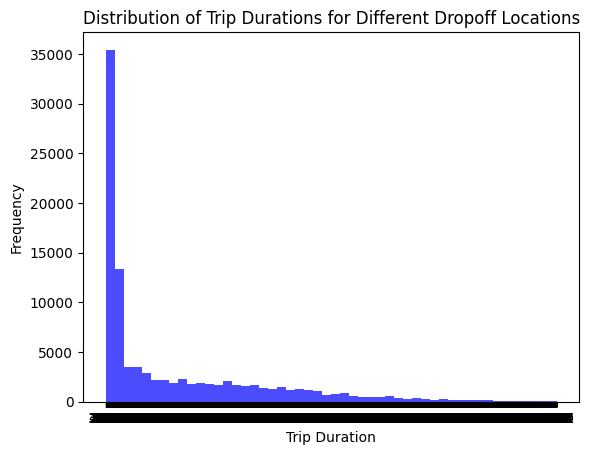

In [ ]:
duration_dropoff_dist = combined_df.groupBy('dropoff_longitude', 'dropoff_latitude').agg(F.collect_list('trip_time_in_secs').alias('durations'))
duration_dropoff_dist.show(10)

# Visualization
duration_dropoff_dist_pd = duration_dropoff_dist.toPandas()
plt.hist(duration_dropoff_dist_pd['durations'].explode(), bins=50, color='blue', alpha=0.7)
plt.xlabel('Trip Duration')
plt.ylabel('Frequency')
plt.title('Distribution of Trip Durations for Different Dropoff Locations')
plt.show()

20. What is the total tip amount collected for different payment types?

+------------+------------------+
|payment_type|         total_tip|
+------------+------------------+
|         CSH|               0.0|
|         DIS|               0.0|
|         CRD|137570.19000000105|
|         UNK| 822.2799999999997|
|         NOC|               0.0|
+------------+------------------+



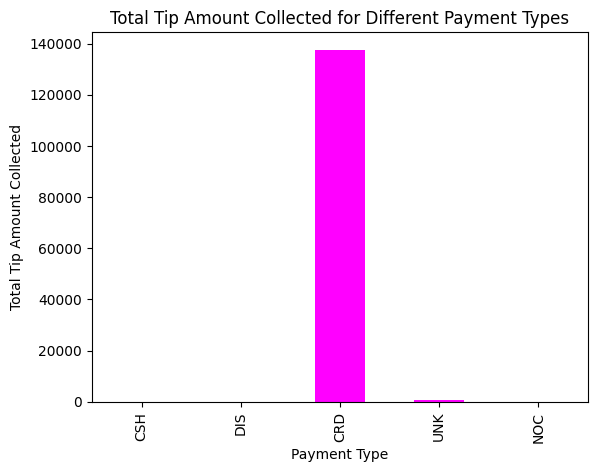

In [ ]:
total_tip_payment_type = combined_df.groupBy('payment_type').agg(F.sum('tip_amount').alias('total_tip'))
total_tip_payment_type.show()

# Visualization
total_tip_payment_type_pd = total_tip_payment_type.toPandas()
total_tip_payment_type_pd.plot(kind='bar', x='payment_type', y='total_tip', legend=None, color='magenta')
plt.xlabel('Payment Type')
plt.ylabel('Total Tip Amount Collected')
plt.title('Total Tip Amount Collected for Different Payment Types')
plt.show()

21. What are the top 10 longest trips by fare amount?

In [ ]:
longest_fare_trips = combined_df.orderBy(F.desc('fare_amount')).select('medallion', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'fare_amount')
longest_fare_trips.show(10)

+--------------------+----------------+---------------+-----------------+----------------+-----------+
|           medallion|pickup_longitude|pickup_latitude|dropoff_longitude|dropoff_latitude|fare_amount|
+--------------------+----------------+---------------+-----------------+----------------+-----------+
|131F6A1E6ECC401E4...|      -73.992332|      40.749504|       -74.703217|       40.255161|      285.0|
|C9B9DE131006EFD39...|      -74.073784|      41.170086|       -74.073784|       41.170086|      221.0|
|5DFC47774F15DC7BB...|      -74.225197|      40.964535|       -74.225204|       40.964539|      206.0|
|45EC5B45E2F1695BF...|      -73.787338|      40.664513|       -73.790276|        40.64373|      204.5|
|B37025B6B18194320...|      -73.987579|      40.718071|       -73.987206|       40.718788|      200.0|
|9ACB267589536F2BC...|       -73.53933|      41.050735|       -73.535316|       41.051231|      184.0|
|B615508ED8B9194EE...|      -73.999931|      40.728607|       -73.999931|

22. What are the top 10 longest trips by total amount?

In [ ]:
longest_total_trips = combined_df.orderBy(F.desc('total_amount')).select('medallion', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'total_amount')
longest_total_trips.show(10)

+--------------------+----------------+---------------+-----------------+----------------+------------+
|           medallion|pickup_longitude|pickup_latitude|dropoff_longitude|dropoff_latitude|total_amount|
+--------------------+----------------+---------------+-----------------+----------------+------------+
|2BCE72DAD8994FC64...|      -73.869583|      40.771721|       -74.043419|       40.788212|        99.6|
|86B59602C6E33C464...|      -73.981888|      40.752243|       -74.177773|       40.690224|        99.6|
|0D69FB9685364A087...|      -73.980843|      40.774616|       -73.926224|       40.866501|        99.5|
|0AE605C79E9EBC1FE...|      -73.985695|      40.760853|        -74.17691|       40.694687|        99.5|
|3246AA03B71806230...|      -74.006721|      40.744102|       -74.006706|       40.744125|        99.5|
|FAAAFA3F332009DC2...|      -73.973656|      40.763966|       -74.177467|       40.695251|        99.0|
|240E92D67E4EA502E...|      -73.980568|      40.763847|       -7

23. What are the top 10 shortest trips by fare amount?

In [ ]:
shortest_fare_trips = combined_df.orderBy('fare_amount').select('medallion', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'fare_amount')
shortest_fare_trips.show(10)

+--------------------+----------------+---------------+-----------------+----------------+-----------+
|           medallion|pickup_longitude|pickup_latitude|dropoff_longitude|dropoff_latitude|fare_amount|
+--------------------+----------------+---------------+-----------------+----------------+-----------+
|E9FD29C830D1C3D9C...|      -73.901894|      40.764118|       -73.901894|       40.764118|        2.5|
|F8884C82531B36117...|      -73.782913|      40.644829|        -73.78125|       40.645042|        2.5|
|EA00A64CBDB68C77D...|      -73.793526|      40.657093|       -73.793526|       40.657093|        2.5|
|E3A7C43E6165C3553...|      -73.900734|      40.744011|       -73.901604|       40.744312|        2.5|
|EB41E4A0AF71221FD...|      -73.979668|      40.762123|       -73.979439|       40.762177|        2.5|
|E4525F792FCA4B774...|      -73.980179|      40.783802|       -73.981178|       40.781273|        2.5|
|EEBCDC24D26873613...|      -73.973824|      40.762783|       -74.000931|

24. What are the top 10 shortest trips by total amount?

In [ ]:
shortest_total_trips = combined_df.orderBy('total_amount').select('medallion', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'total_amount')
shortest_total_trips.show(10)

+--------------------+----------------+---------------+-----------------+----------------+------------+
|           medallion|pickup_longitude|pickup_latitude|dropoff_longitude|dropoff_latitude|total_amount|
+--------------------+----------------+---------------+-----------------+----------------+------------+
|E2592DA19DD99FEB2...|      -73.963791|      40.770924|       -73.987442|       40.753555|        10.0|
|E3ADD882D2B3BD1B1...|       -73.99765|      40.721733|       -74.008636|       40.707275|        10.0|
|E2592DA19DD99FEB2...|      -73.975037|      40.765129|       -73.978142|       40.778286|        10.0|
|DFD77FAD2F98FC845...|      -73.993256|      40.724617|       -73.999863|       40.720387|        10.0|
|E26AAFA439ED778F3...|      -73.959496|      40.763077|       -73.933167|       40.795387|        10.0|
|E0AA965A6EF756AD2...|       -73.98703|      40.740211|       -74.007248|       40.727276|        10.0|
|E2CAD163D52B187C0...|      -73.952568|      40.777359|       -7

25. What is the average total amount for different payment types?

+------------+------------------+
|payment_type|         avg_total|
+------------+------------------+
|         CSH|12.513435119574773|
|         DIS|12.180142857142856|
|         CRD| 17.20733716766958|
|         UNK|16.482265193370164|
|         NOC| 13.65071111111111|
+------------+------------------+



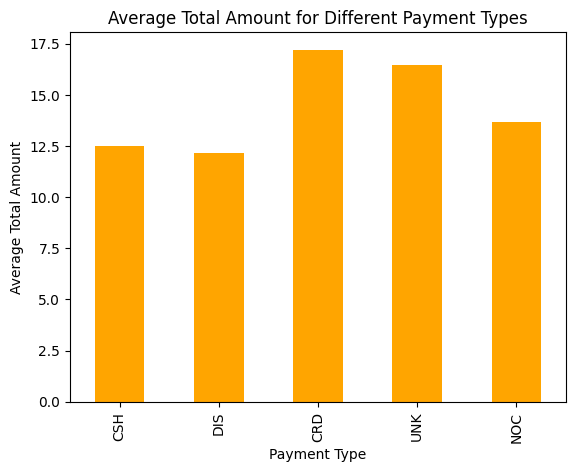

In [ ]:
avg_total_payment_type = combined_df.groupBy('payment_type').agg(F.avg('total_amount').alias('avg_total'))
avg_total_payment_type.show()

# Visualization
avg_total_payment_type_pd = avg_total_payment_type.toPandas()
avg_total_payment_type_pd.plot(kind='bar', x='payment_type', y='avg_total', legend=None, color='orange')
plt.xlabel('Payment Type')
plt.ylabel('Average Total Amount')
plt.title('Average Total Amount for Different Payment Types')
plt.show()

26. What is the average fare amount for different vendors?

+---------+------------------+
|vendor_id|          avg_fare|
+---------+------------------+
|      CMT|12.433144384032714|
|      VTS|12.657062411937096|
+---------+------------------+



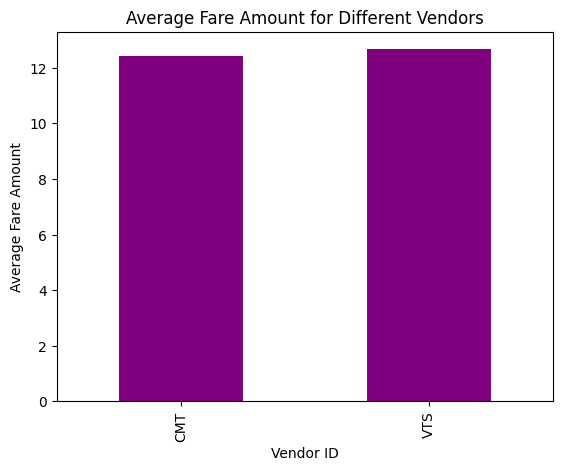

In [ ]:
avg_fare_vendor = combined_df.groupBy('vendor_id').agg(F.avg('fare_amount').alias('avg_fare'))
avg_fare_vendor.show()

# Visualization
avg_fare_vendor_pd = avg_fare_vendor.toPandas()
avg_fare_vendor_pd.plot(kind='bar', x='vendor_id', y='avg_fare', legend=None, color='purple')
plt.xlabel('Vendor ID')
plt.ylabel('Average Fare Amount')
plt.title('Average Fare Amount for Different Vendors')
plt.show()


27. What is the average trip distance for different vendors?

+---------+------------------+
|vendor_id|      avg_distance|
+---------+------------------+
|      CMT|2.8585736311032686|
|      VTS| 2.967431647881666|
+---------+------------------+



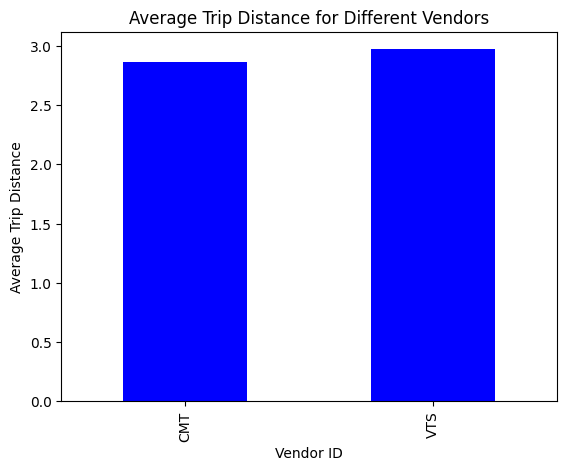

In [ ]:
avg_distance_vendor = combined_df.groupBy('vendor_id').agg(F.avg('trip_distance').alias('avg_distance'))
avg_distance_vendor.show()

# Visualization
avg_distance_vendor_pd = avg_distance_vendor.toPandas()
avg_distance_vendor_pd.plot(kind='bar', x='vendor_id', y='avg_distance', legend=None, color='blue')
plt.xlabel('Vendor ID')
plt.ylabel('Average Trip Distance')
plt.title('Average Trip Distance for Different Vendors')
plt.show()

28. What is the average trip time for different vendors?

+---------+-----------------+
|vendor_id|    avg_trip_time|
+---------+-----------------+
|      CMT|779.2943582365635|
|      VTS|798.2391785786189|
+---------+-----------------+



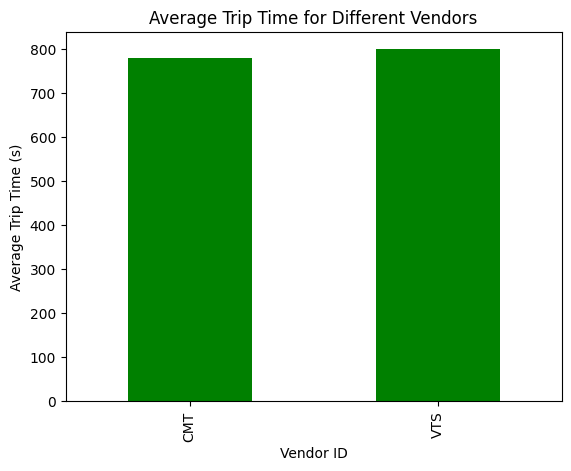

In [ ]:
avg_time_vendor = combined_df.groupBy('vendor_id').agg(F.avg('trip_time_in_secs').alias('avg_trip_time'))
avg_time_vendor.show()

# Visualization
avg_time_vendor_pd = avg_time_vendor.toPandas()
avg_time_vendor_pd.plot(kind='bar', x='vendor_id', y='avg_trip_time', legend=None, color='green')
plt.xlabel('Vendor ID')
plt.ylabel('Average Trip Time (s)')
plt.title('Average Trip Time for Different Vendors')
plt.show()


29. What is the total fare amount collected by different vendors?

+---------+-----------------+
|vendor_id|       total_fare|
+---------+-----------------+
|      CMT|604934.6400051117|
|      VTS|628676.2900009155|
+---------+-----------------+



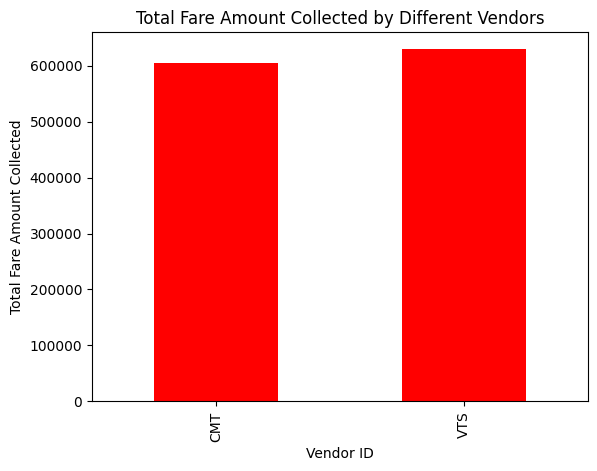

In [ ]:
total_fare_vendor = combined_df.groupBy('vendor_id').agg(F.sum('fare_amount').alias('total_fare'))
total_fare_vendor.show()

# Visualization
total_fare_vendor_pd = total_fare_vendor.toPandas()
total_fare_vendor_pd.plot(kind='bar', x='vendor_id', y='total_fare', legend=None, color='red')
plt.xlabel('Vendor ID')
plt.ylabel('Total Fare Amount Collected')
plt.title('Total Fare Amount Collected by Different Vendors')
plt.show()

30. What is the total tip amount collected by different vendors?

+---------+-----------------+
|vendor_id|        total_tip|
+---------+-----------------+
|      CMT|67968.37999999982|
|      VTS|70424.09000000011|
+---------+-----------------+



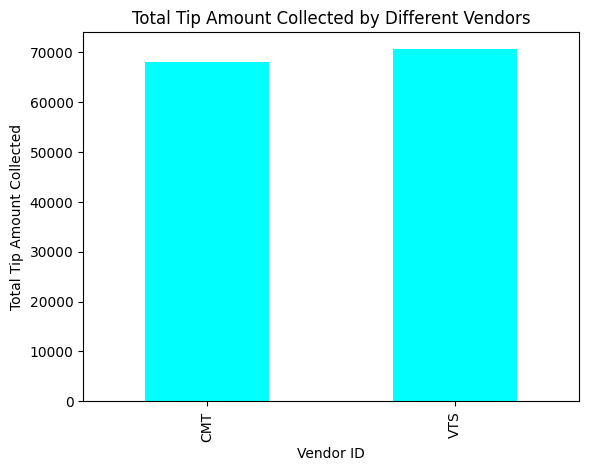

In [ ]:
total_tip_vendor = combined_df.groupBy('vendor_id').agg(F.sum('tip_amount').alias('total_tip'))
total_tip_vendor.show()

# Visualization
total_tip_vendor_pd = total_tip_vendor.toPandas()
total_tip_vendor_pd.plot(kind='bar', x='vendor_id', y='total_tip', legend=None, color='cyan')
plt.xlabel('Vendor ID')
plt.ylabel('Total Tip Amount Collected')
plt.title('Total Tip Amount Collected by Different Vendors')
plt.show()


31. What is the average fare amount for different rate codes?

+---------+------------------+
|rate_code|          avg_fare|
+---------+------------------+
|        3| 63.23548387096774|
|        0|             15.68|
|        5| 66.10276318432992|
|        6|               5.5|
|        1|11.596715119606273|
|        4|49.983870967741936|
|        2|51.892857142857146|
+---------+------------------+



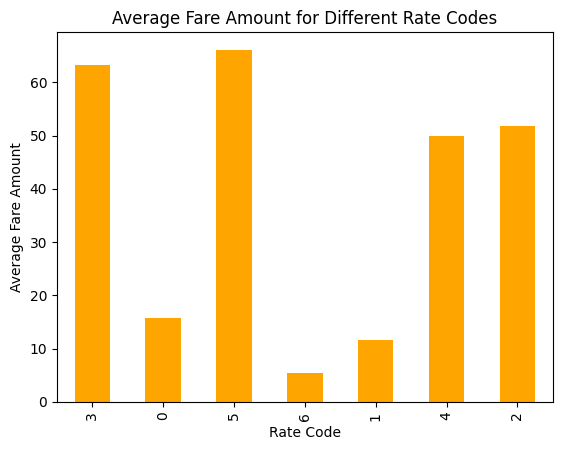

In [ ]:
avg_fare_rate_code = combined_df.groupBy('rate_code').agg(F.avg('fare_amount').alias('avg_fare'))
avg_fare_rate_code.show()

# Visualization
avg_fare_rate_code_pd = avg_fare_rate_code.toPandas()
avg_fare_rate_code_pd.plot(kind='bar', x='rate_code', y='avg_fare', legend=None, color='orange')
plt.xlabel('Rate Code')
plt.ylabel('Average Fare Amount')
plt.title('Average Fare Amount for Different Rate Codes')
plt.show()

32. What is the average trip distance for different rate codes?

+---------+------------------+
|rate_code|      avg_distance|
+---------+------------------+
|        3|15.908516075690427|
|        0| 4.028000004291535|
|        5| 7.547806994597378|
|        6|               0.0|
|        1|2.6118692707121967|
|        4| 13.49258064514687|
|        2|17.295624288339567|
+---------+------------------+



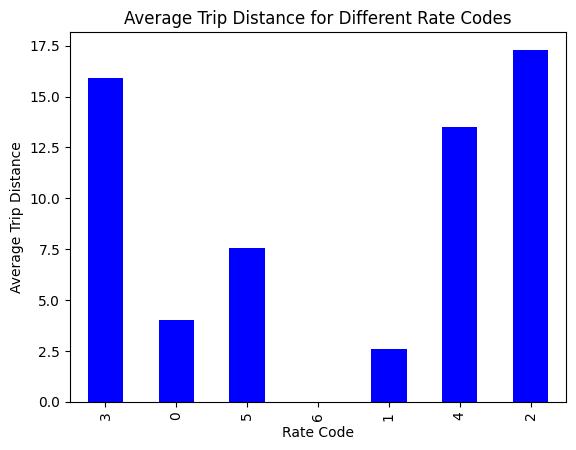

In [ ]:
avg_distance_rate_code = combined_df.groupBy('rate_code').agg(F.avg('trip_distance').alias('avg_distance'))
avg_distance_rate_code.show()

# Visualization
avg_distance_rate_code_pd = avg_distance_rate_code.toPandas()
avg_distance_rate_code_pd.plot(kind='bar', x='rate_code', y='avg_distance', legend=None, color='blue')
plt.xlabel('Rate Code')
plt.ylabel('Average Trip Distance')
plt.title('Average Trip Distance for Different Rate Codes')
plt.show()

33. What is the average trip time for different rate codes?

+---------+------------------+
|rate_code|     avg_trip_time|
+---------+------------------+
|        3| 2062.716129032258|
|        0|            996.96|
|        5| 1182.061403508772|
|        6|               3.0|
|        1| 753.3412030341182|
|        4|1631.9032258064517|
|        2| 2530.369516310461|
+---------+------------------+



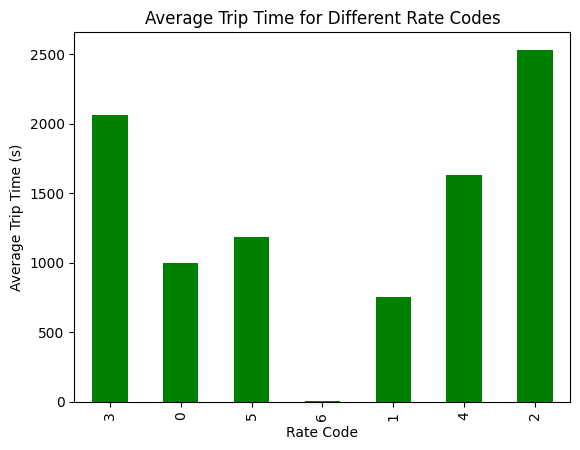

In [ ]:
avg_time_rate_code = combined_df.groupBy('rate_code').agg(F.avg('trip_time_in_secs').alias('avg_trip_time'))
avg_time_rate_code.show()

# Visualization
avg_time_rate_code_pd = avg_time_rate_code.toPandas()
avg_time_rate_code_pd.plot(kind='bar', x='rate_code', y='avg_trip_time', legend=None, color='green')
plt.xlabel('Rate Code')
plt.ylabel('Average Trip Time (s)')
plt.title('Average Trip Time for Different Rate Codes')
plt.show()


34. What is the total fare amount collected for different rate codes?

+---------+------------------+
|rate_code|        total_fare|
+---------+------------------+
|        3|            9801.5|
|        0|             392.0|
|        5|15071.430006027222|
|        6|               5.5|
|        1|         1114525.5|
|        4|            1549.5|
|        2|           92265.5|
+---------+------------------+



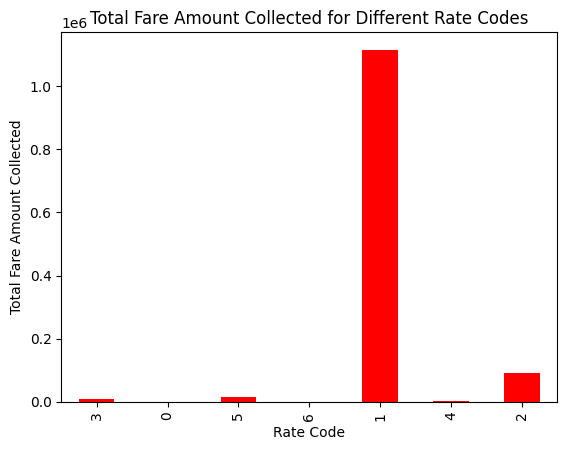

In [ ]:
total_fare_rate_code = combined_df.groupBy('rate_code').agg(F.sum('fare_amount').alias('total_fare'))
total_fare_rate_code.show()

# Visualization
total_fare_rate_code_pd = total_fare_rate_code.toPandas()
total_fare_rate_code_pd.plot(kind='bar', x='rate_code', y='total_fare', legend=None, color='red')
plt.xlabel('Rate Code')
plt.ylabel('Total Fare Amount Collected')
plt.title('Total Fare Amount Collected for Different Rate Codes')
plt.show()


35. What is the total tip amount collected for different rate codes?

+---------+------------------+
|rate_code|         total_tip|
+---------+------------------+
|        3|           1227.62|
|        0| 6.970000000000001|
|        5|1906.4900000000002|
|        6|               0.0|
|        1|124105.63000000079|
|        4|             98.95|
|        2|11046.810000000003|
+---------+------------------+



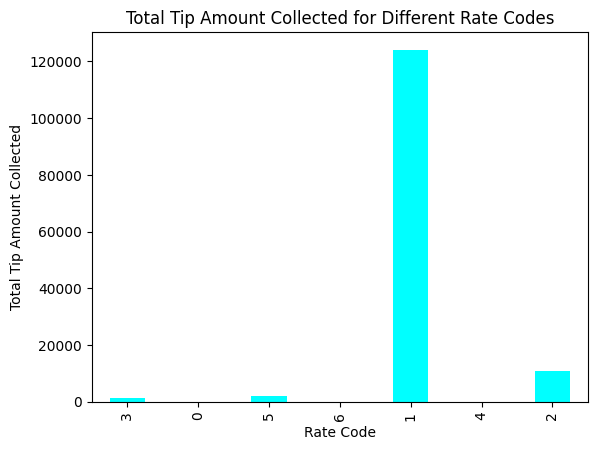

In [ ]:
total_tip_rate_code = combined_df.groupBy('rate_code').agg(F.sum('tip_amount').alias('total_tip'))
total_tip_rate_code.show()

# Visualization
total_tip_rate_code_pd = total_tip_rate_code.toPandas()
total_tip_rate_code_pd.plot(kind='bar', x='rate_code', y='total_tip', legend=None, color='cyan')
plt.xlabel('Rate Code')
plt.ylabel('Total Tip Amount Collected')
plt.title('Total Tip Amount Collected for Different Rate Codes')
plt.show()


36. What is the total amount collected for different rate codes?

+---------+------------------+
|rate_code|      total_amount|
+---------+------------------+
|        3|          12671.28|
|        0|            424.63|
|        5|17971.250000000004|
|        6|               6.0|
|        1| 1334384.469999986|
|        4|           1703.55|
|        2|111359.01000000109|
+---------+------------------+



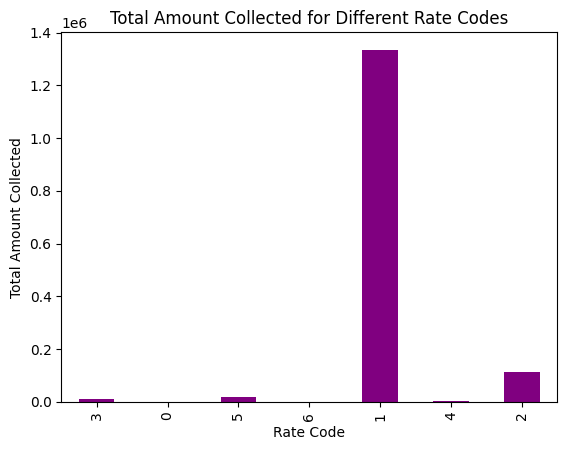

In [ ]:
total_amount_rate_code = combined_df.groupBy('rate_code').agg(F.sum('total_amount').alias('total_amount'))
total_amount_rate_code.show()

# Visualization
total_amount_rate_code_pd = total_amount_rate_code.toPandas()
total_amount_rate_code_pd.plot(kind='bar', x='rate_code', y='total_amount', legend=None, color='purple')
plt.xlabel('Rate Code')
plt.ylabel('Total Amount Collected')
plt.title('Total Amount Collected for Different Rate Codes')
plt.show()


37. What is the average fare amount for different passenger counts?

+---------------+------------------+
|passenger_count|          avg_fare|
+---------------+------------------+
|              3|12.909270446096654|
|              0|40.333333333333336|
|              5|12.845021037868163|
|              6| 12.52495403204623|
|              9|              51.0|
|              1|12.358320690428814|
|              4|13.075408462505237|
|              2|13.126223042116804|
+---------------+------------------+



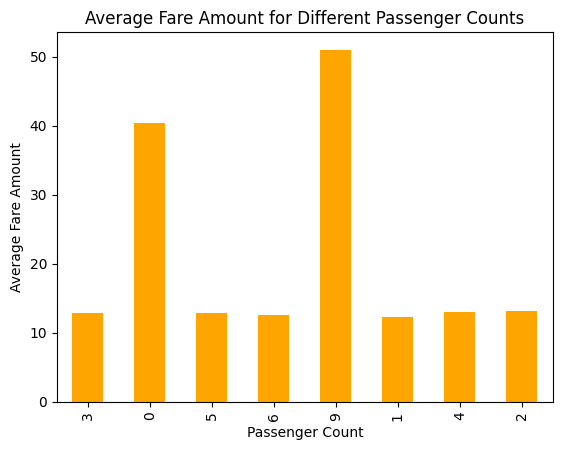

In [ ]:
avg_fare_passenger_count = combined_df.groupBy('passenger_count').agg(F.avg('fare_amount').alias('avg_fare'))
avg_fare_passenger_count.show()

# Visualization
avg_fare_passenger_count_pd = avg_fare_passenger_count.toPandas()
avg_fare_passenger_count_pd.plot(kind='bar', x='passenger_count', y='avg_fare', legend=None, color='orange')
plt.xlabel('Passenger Count')
plt.ylabel('Average Fare Amount')
plt.title('Average Fare Amount for Different Passenger Counts')
plt.show()


38. What is the average trip distance for different passenger counts?

+---------------+------------------+
|passenger_count|      avg_distance|
+---------------+------------------+
|              3|3.0011779732039705|
|              0|0.4666666587193807|
|              5|3.0637464922840407|
|              6|2.9390412384312916|
|              9| 1.149999976158142|
|              1|2.8490913231726203|
|              4|3.0179555925966297|
|              2|3.1133775541956075|
+---------------+------------------+



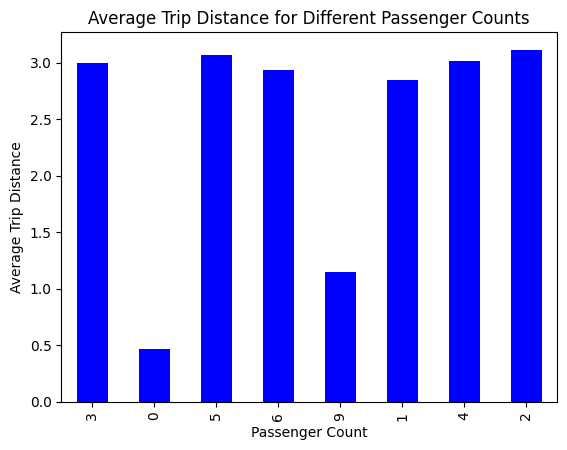

In [ ]:
avg_distance_passenger_count = combined_df.groupBy('passenger_count').agg(F.avg('trip_distance').alias('avg_distance'))
avg_distance_passenger_count.show()

# Visualization
avg_distance_passenger_count_pd = avg_distance_passenger_count.toPandas()
avg_distance_passenger_count_pd.plot(kind='bar', x='passenger_count', y='avg_distance', legend=None, color='blue')
plt.xlabel('Passenger Count')
plt.ylabel('Average Trip Distance')
plt.title('Average Trip Distance for Different Passenger Counts')
plt.show()


39. What is the average trip time for different passenger counts?

+---------------+------------------+
|passenger_count|     avg_trip_time|
+---------------+------------------+
|              3| 822.9168215613383|
|              0|199.66666666666666|
|              5| 812.9275946704067|
|              6| 800.1016548463357|
|              9|             417.0|
|              1| 774.7090794154832|
|              4| 844.0804356933389|
|              2| 824.8320800227015|
+---------------+------------------+



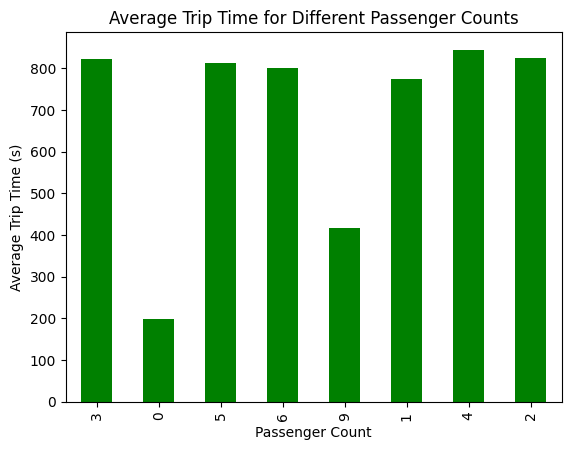

In [ ]:
avg_time_passenger_count = combined_df.groupBy('passenger_count').agg(F.avg('trip_time_in_secs').alias('avg_trip_time'))
avg_time_passenger_count.show()

# Visualization
avg_time_passenger_count_pd = avg_time_passenger_count.toPandas()
avg_time_passenger_count_pd.plot(kind='bar', x='passenger_count', y='avg_trip_time', legend=None, color='green')
plt.xlabel('Passenger Count')
plt.ylabel('Average Trip Time (s)')
plt.title('Average Trip Time for Different Passenger Counts')
plt.show()


40. What is the total fare amount collected for different passenger counts?

+---------------+------------------+
|passenger_count|        total_fare|
+---------------+------------------+
|              3|           55561.5|
|              0|             121.0|
|              5|           73268.0|
|              6|           47682.5|
|              9|             102.0|
|              1| 840637.6900043488|
|              4|           31211.0|
|              2|185027.24000167847|
+---------------+------------------+



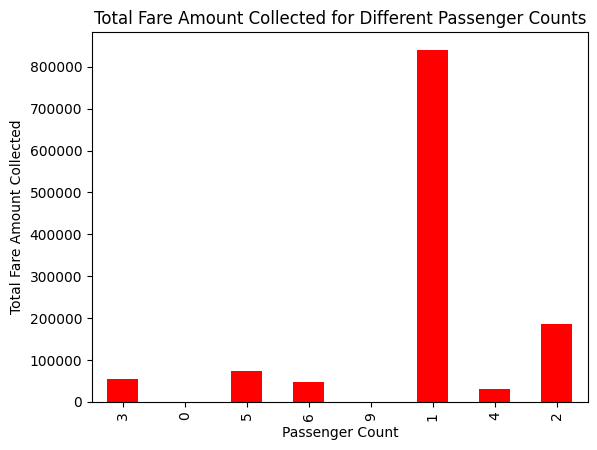

In [ ]:
total_fare_passenger_count = combined_df.groupBy('passenger_count').agg(F.sum('fare_amount').alias('total_fare'))
total_fare_passenger_count.show()

# Visualization
total_fare_passenger_count_pd = total_fare_passenger_count.toPandas()
total_fare_passenger_count_pd.plot(kind='bar', x='passenger_count', y='total_fare', legend=None, color='red')
plt.xlabel('Passenger Count')
plt.ylabel('Total Fare Amount Collected')
plt.title('Total Fare Amount Collected for Different Passenger Counts')
plt.show()


41. What is the total tip amount collected for different passenger counts?

+---------------+-----------------+
|passenger_count|        total_tip|
+---------------+-----------------+
|              3|5467.599999999998|
|              0|              5.0|
|              5|          8374.91|
|              6|5498.679999999996|
|              9|             20.0|
|              1|97058.04000000024|
|              4|2479.909999999999|
|              2|19488.33000000002|
+---------------+-----------------+



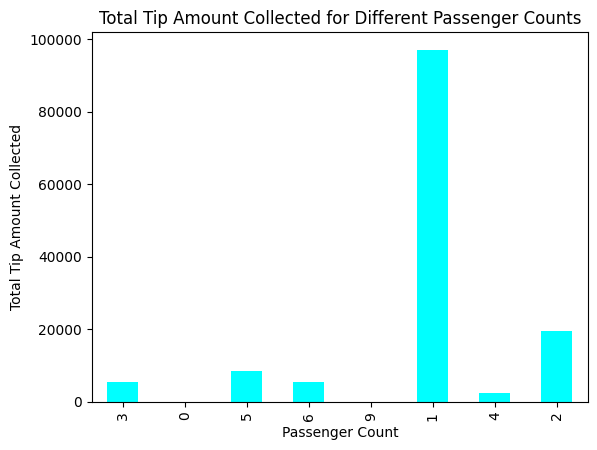

In [ ]:
total_tip_passenger_count = combined_df.groupBy('passenger_count').agg(F.sum('tip_amount').alias('total_tip'))
total_tip_passenger_count.show()

# Visualization
total_tip_passenger_count_pd = total_tip_passenger_count.toPandas()
total_tip_passenger_count_pd.plot(kind='bar', x='passenger_count', y='total_tip', legend=None, color='cyan')
plt.xlabel('Passenger Count')
plt.ylabel('Total Tip Amount Collected')
plt.title('Total Tip Amount Collected for Different Passenger Counts')
plt.show()


42. What is the total amount collected for different passenger counts?

+---------------+------------------+
|passenger_count|      total_amount|
+---------------+------------------+
|              3| 66006.63000000006|
|              0|             126.5|
|              5|  88018.8100000002|
|              6| 57209.06000000005|
|              9|             123.0|
|              1|1009480.4199999964|
|              4|          36432.79|
|              2|221122.98000000083|
+---------------+------------------+



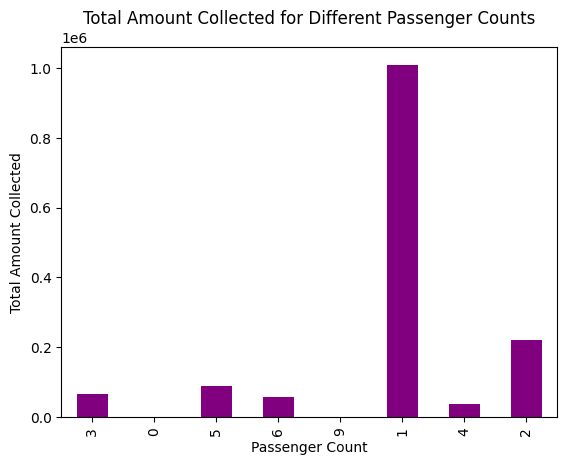

In [ ]:
total_amount_passenger_count = combined_df.groupBy('passenger_count').agg(F.sum('total_amount').alias('total_amount'))
total_amount_passenger_count.show()

# Visualization
total_amount_passenger_count_pd = total_amount_passenger_count.toPandas()
total_amount_passenger_count_pd.plot(kind='bar', x='passenger_count', y='total_amount', legend=None, color='purple')
plt.xlabel('Passenger Count')
plt.ylabel('Total Amount Collected')
plt.title('Total Amount Collected for Different Passenger Counts')
plt.show()

43. What is the average trip distance for trips with different number of passengers?

+---------------+------------------+
|passenger_count|      avg_distance|
+---------------+------------------+
|              3|3.0011779732039705|
|              0|0.4666666587193807|
|              5|3.0637464922840407|
|              6|2.9390412384312916|
|              9| 1.149999976158142|
|              1|2.8490913231726203|
|              4|3.0179555925966297|
|              2|3.1133775541956075|
+---------------+------------------+



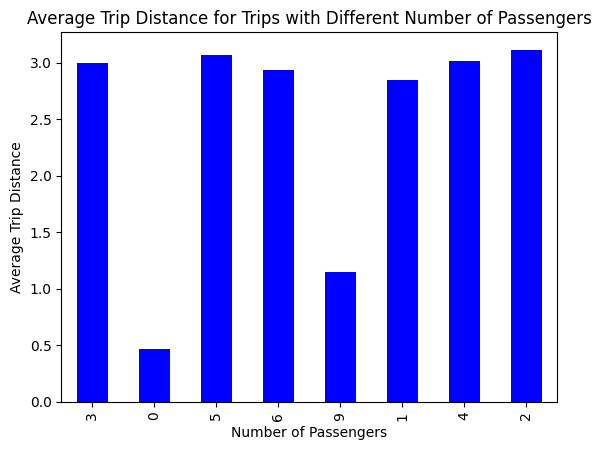

In [ ]:
avg_distance_num_passengers = combined_df.groupBy('passenger_count').agg(F.avg('trip_distance').alias('avg_distance'))
avg_distance_num_passengers.show()

# Visualization
avg_distance_num_passengers_pd = avg_distance_num_passengers.toPandas()
avg_distance_num_passengers_pd.plot(kind='bar', x='passenger_count', y='avg_distance', legend=None, color='blue')
plt.xlabel('Number of Passengers')
plt.ylabel('Average Trip Distance')
plt.title('Average Trip Distance for Trips with Different Number of Passengers')
plt.show()


44. What is the average trip time for trips with different number of passengers?

+---------------+------------------+
|passenger_count|     avg_trip_time|
+---------------+------------------+
|              3| 822.9168215613383|
|              0|199.66666666666666|
|              5| 812.9275946704067|
|              6| 800.1016548463357|
|              9|             417.0|
|              1| 774.7090794154832|
|              4| 844.0804356933389|
|              2| 824.8320800227015|
+---------------+------------------+



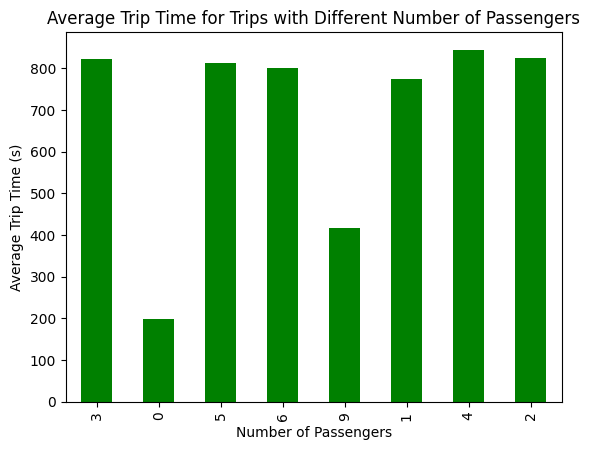

In [ ]:
avg_time_num_passengers = combined_df.groupBy('passenger_count').agg(F.avg('trip_time_in_secs').alias('avg_trip_time'))
avg_time_num_passengers.show()

# Visualization
avg_time_num_passengers_pd = avg_time_num_passengers.toPandas()
avg_time_num_passengers_pd.plot(kind='bar', x='passenger_count', y='avg_trip_time', legend=None, color='green')
plt.xlabel('Number of Passengers')
plt.ylabel('Average Trip Time (s)')
plt.title('Average Trip Time for Trips with Different Number of Passengers')
plt.show()

45. Most Frequent Pickup and Drop-off Locations

In [ ]:
# Most frequent pickup locations
pickup_freq = combined_df.groupBy("pickup_longitude", "pickup_latitude").count().orderBy(F.desc("count"))
pickup_freq.show(10)

# Most frequent drop-off locations
dropoff_freq = combined_df.groupBy("dropoff_longitude", "dropoff_latitude").count().orderBy(F.desc("count"))
dropoff_freq.show(10)

+----------------+---------------+-----+
|pickup_longitude|pickup_latitude|count|
+----------------+---------------+-----+
|       -73.83461|      40.765968|   13|
|       -73.96167|      40.774151|   13|
|      -73.948723|      40.744843|    8|
|      -73.793983|      40.656971|    7|
|      -73.974815|      40.618103|    4|
|      -73.776733|      40.645435|    3|
|       -73.77668|      40.645309|    3|
|      -73.789169|      40.641808|    3|
|      -73.964592|      40.760124|    3|
|      -74.004021|      40.747768|    3|
+----------------+---------------+-----+
only showing top 10 rows

+-----------------+----------------+-----+
|dropoff_longitude|dropoff_latitude|count|
+-----------------+----------------+-----+
|        -73.96167|       40.774151|   13|
|        -73.83461|       40.765968|   13|
|       -73.948723|       40.744843|    8|
|       -73.793983|       40.656971|    7|
|       -73.974815|       40.618103|    4|
|       -73.964592|       40.760124|    3|
|        -73.

46. Variation of Fare Amount with Pickup and Drop-off Locations

In [ ]:
# Average fare amount by pickup location
avg_fare_pickup = combined_df.groupBy("pickup_longitude", "pickup_latitude").agg(F.avg("fare_amount").alias("avg_fare"))
avg_fare_pickup.show(10)

# Average fare amount by drop-off location
avg_fare_dropoff = combined_df.groupBy("dropoff_longitude", "dropoff_latitude").agg(F.avg("fare_amount").alias("avg_fare"))
avg_fare_dropoff.show(10)

+----------------+---------------+--------+
|pickup_longitude|pickup_latitude|avg_fare|
+----------------+---------------+--------+
|      -73.983612|      40.774734|    10.5|
|      -73.951729|      40.774082|    15.0|
|      -73.962585|      40.776463|     5.0|
|      -73.970039|      40.799702|    10.0|
|      -73.985695|      40.778149|     4.0|
|      -73.979401|      40.746227|     5.5|
|      -73.972282|      40.765198|     8.0|
|      -73.999886|      40.743439|    15.0|
|      -73.990936|      40.719578|    12.0|
|      -73.958725|      40.760044|     6.5|
+----------------+---------------+--------+
only showing top 10 rows

+-----------------+----------------+--------+
|dropoff_longitude|dropoff_latitude|avg_fare|
+-----------------+----------------+--------+
|       -73.977516|       40.744553|     9.0|
|       -73.944237|       40.809818|     6.5|
|       -73.977158|       40.722572|     5.5|
|       -74.016541|        40.70665|    20.0|
|        -74.00695|       40.743629|

47. Correlation Between Trip Distance and Fare Amount

In [ ]:
# Cast columns to float
combined_df = combined_df.withColumn("trip_distance", col("trip_distance").cast("float"))
combined_df = combined_df.withColumn("fare_amount", col("fare_amount").cast("float"))

# Verify the schema to ensure correct data types
combined_df.printSchema()

# Correlation between trip distance and fare amount
correlation = combined_df.stat.corr("trip_distance", "fare_amount")
print(f"Correlation between trip distance and fare amount: {correlation}")


root
 |-- medallion: string (nullable = true)
 |-- hack_license: string (nullable = true)
 |-- vendor_id: string (nullable = true)
 |-- pickup_datetime: string (nullable = true)
 |-- rate_code: string (nullable = true)
 |-- store_and_fwd_flag: string (nullable = true)
 |-- dropoff_datetime: string (nullable = true)
 |-- passenger_count: string (nullable = true)
 |-- trip_time_in_secs: string (nullable = true)
 |-- trip_distance: float (nullable = true)
 |-- pickup_longitude: string (nullable = true)
 |-- pickup_latitude: string (nullable = true)
 |-- dropoff_longitude: string (nullable = true)
 |-- dropoff_latitude: string (nullable = true)
 |-- payment_type: string (nullable = true)
 |-- fare_amount: float (nullable = true)
 |-- surcharge: string (nullable = true)
 |-- mta_tax: string (nullable = true)
 |-- tip_amount: string (nullable = true)
 |-- tolls_amount: string (nullable = true)
 |-- total_amount: string (nullable = true)

Correlation between trip distance and fare amount: 0.9

48. Average Trip Durations and Distances for Different Regions

In [ ]:
# Average trip duration and distance by pickup location
avg_trip_stats = combined_df.groupBy("pickup_longitude", "pickup_latitude").agg(
    F.avg("trip_time_in_secs").alias("avg_duration"),
    F.avg("trip_distance").alias("avg_distance")
)
avg_trip_stats.show(10)


+----------------+---------------+------------+------------------+
|pickup_longitude|pickup_latitude|avg_duration|      avg_distance|
+----------------+---------------+------------+------------------+
|      -73.983612|      40.774734|       847.0|1.7999999523162842|
|      -73.951729|      40.774082|      1407.0| 2.200000047683716|
|      -73.962585|      40.776463|       240.0|              0.75|
|      -73.970039|      40.799702|       660.0|2.2300000190734863|
|      -73.985695|      40.778149|       180.0|0.5699999928474426|
|      -73.979401|      40.746227|       360.0|0.6200000047683716|
|      -73.972282|      40.765198|       660.0|0.8700000047683716|
|      -73.999886|      40.743439|       954.0| 3.700000047683716|
|      -73.990936|      40.719578|       999.0|1.7000000476837158|
|      -73.958725|      40.760044|       426.0| 0.699999988079071|
+----------------+---------------+------------+------------------+
only showing top 10 rows



49. Effect of Pickup and Drop-off Locations on Tip Amount

In [ ]:
# Average tip amount by pickup location
avg_tip_pickup = combined_df.groupBy("pickup_longitude", "pickup_latitude").agg(F.avg("tip_amount").alias("avg_tip"))
avg_tip_pickup.show(10)

# Average tip amount by drop-off location
avg_tip_dropoff = combined_df.groupBy("dropoff_longitude", "dropoff_latitude").agg(F.avg("tip_amount").alias("avg_tip"))
avg_tip_dropoff.show(10)


+----------------+---------------+-------+
|pickup_longitude|pickup_latitude|avg_tip|
+----------------+---------------+-------+
|      -73.983612|      40.774734|    2.2|
|      -73.951729|      40.774082|    1.5|
|      -73.962585|      40.776463|    1.2|
|      -73.970039|      40.799702|    2.0|
|      -73.985695|      40.778149|    0.0|
|      -73.979401|      40.746227|    1.1|
|      -73.972282|      40.765198|    0.0|
|      -73.999886|      40.743439|    0.0|
|      -73.990936|      40.719578|    2.6|
|      -73.958725|      40.760044|    0.0|
+----------------+---------------+-------+
only showing top 10 rows

+-----------------+----------------+-------+
|dropoff_longitude|dropoff_latitude|avg_tip|
+-----------------+----------------+-------+
|       -73.977516|       40.744553|    0.0|
|       -73.944237|       40.809818|    0.0|
|       -73.977158|       40.722572|    0.0|
|       -74.016541|        40.70665|    3.0|
|        -74.00695|       40.743629|    1.9|
|       -73.

50. Effect of Number of Passengers on Fare Amount for Different Locations

In [ ]:
# Average fare amount by number of passengers and pickup location
avg_fare_passengers = combined_df.groupBy("passenger_count", "pickup_longitude", "pickup_latitude").agg(F.avg("fare_amount").alias("avg_fare"))
avg_fare_passengers.show(10)

+---------------+----------------+---------------+--------+
|passenger_count|pickup_longitude|pickup_latitude|avg_fare|
+---------------+----------------+---------------+--------+
|              1|      -73.996155|       40.74332|     4.5|
|              1|      -73.982079|      40.774487|     6.0|
|              1|      -74.005241|      40.707726|     8.5|
|              2|      -73.975143|      40.741661|     9.0|
|              6|      -73.983521|      40.764526|    42.5|
|              1|      -73.974312|      40.752087|     5.5|
|              2|       -73.98896|      40.736534|     5.0|
|              1|      -73.995415|      40.750561|    11.5|
|              1|      -73.999733|       40.74033|     5.5|
|              1|      -73.990303|      40.757393|     5.0|
+---------------+----------------+---------------+--------+
only showing top 10 rows



51. Effect of Rate Code on Fare Amount and Trip Distance

In [ ]:
# Average fare amount and trip distance by rate code
rate_code_effect = combined_df.groupBy("rate_code").agg(
    F.avg("fare_amount").alias("avg_fare"),
    F.avg("trip_distance").alias("avg_distance")
)
rate_code_effect.show()


+---------+------------------+------------------+
|rate_code|          avg_fare|      avg_distance|
+---------+------------------+------------------+
|        3| 63.23548387096774|15.908516075690427|
|        0|             15.68| 4.028000004291535|
|        5| 66.10276318432992| 7.547806994597378|
|        6|               5.5|               0.0|
|        1|11.596715119606273|2.6118692707121967|
|        4|49.983870967741936| 13.49258064514687|
|        2|51.892857142857146|17.295624288339567|
+---------+------------------+------------------+



52. Distribution of Payment Types Across Different Regions

In [ ]:
# Count of payment types by pickup location
payment_type_dist = combined_df.groupBy("payment_type", "pickup_longitude", "pickup_latitude").count().orderBy(F.desc("count"))
payment_type_dist.show(10)


+------------+----------------+---------------+-----+
|payment_type|pickup_longitude|pickup_latitude|count|
+------------+----------------+---------------+-----+
|         CRD|       -73.83461|      40.765968|    7|
|         CRD|       -73.96167|      40.774151|    7|
|         CSH|       -73.83461|      40.765968|    6|
|         CSH|       -73.96167|      40.774151|    6|
|         CSH|      -73.948723|      40.744843|    4|
|         CRD|      -73.948723|      40.744843|    4|
|         CRD|      -73.793983|      40.656971|    4|
|         CRD|      -73.789169|      40.641808|    3|
|         CRD|      -74.004021|      40.747768|    3|
|         CSH|       -73.77668|      40.645309|    3|
+------------+----------------+---------------+-----+
only showing top 10 rows



53. Variation of Surcharges and Tolls with Pickup and Drop-off Locations

In [ ]:
# Average surcharges and tolls by pickup location
avg_surcharge_tolls = combined_df.groupBy("pickup_longitude", "pickup_latitude").agg(
    F.avg("surcharge").alias("avg_surcharge"),
    F.avg("tolls_amount").alias("avg_tolls")
)
avg_surcharge_tolls.show(10)


+----------------+---------------+-------------+---------+
|pickup_longitude|pickup_latitude|avg_surcharge|avg_tolls|
+----------------+---------------+-------------+---------+
|      -73.983612|      40.774734|          0.0|      0.0|
|      -73.951729|      40.774082|          0.0|      0.0|
|      -73.962585|      40.776463|          1.0|      0.0|
|      -73.970039|      40.799702|          0.0|      0.0|
|      -73.985695|      40.778149|          1.0|      0.0|
|      -73.979401|      40.746227|          0.0|      0.0|
|      -73.972282|      40.765198|          0.0|      0.0|
|      -73.999886|      40.743439|          0.5|      0.0|
|      -73.990936|      40.719578|          0.5|      0.0|
|      -73.958725|      40.760044|          0.0|      0.0|
+----------------+---------------+-------------+---------+
only showing top 10 rows



In [ ]:
!pip install geopandas matplotlib shapely

In [ ]:
!pip install folium geopandas

In [ ]:
import folium
from folium.plugins import HeatMap
import pandas as pd
from pyspark.sql.functions import col

# Cast pickup latitude and longitude to float
combined_df = combined_df.withColumn("pickup_latitude", col("pickup_latitude").cast("float"))
combined_df = combined_df.withColumn("pickup_longitude", col("pickup_longitude").cast("float"))

# Convert Spark DataFrame to Pandas DataFrame
pickup_df = combined_df.select("pickup_latitude", "pickup_longitude").toPandas()

# Filter out any rows with missing data
pickup_df = pickup_df.dropna(subset=['pickup_latitude', 'pickup_longitude'])

# Initialize a Folium map centered around New York City
nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=12)

# Create a heatmap with adjusted radius, blur, and max_zoom parameters
heat_data = [[row['pickup_latitude'], row['pickup_longitude']] for index, row in pickup_df.iterrows()]
HeatMap(heat_data, radius=15, blur=10, max_zoom=13).add_to(nyc_map)

# Save the map to an HTML file
nyc_map.save("nyc_pickup_heatmap.html")

# Display the map
nyc_map


# **Time Series Analysis**

54. What are the peak hours for taxi pickups and drop-offs?

+-----------+-----+
|pickup_hour|count|
+-----------+-----+
|          0| 4099|
|          1| 3030|
|          2| 2229|
|          3| 1631|
|          4| 1210|
|          5|  991|
|          6| 1917|
|          7| 3420|
|          8| 4149|
|          9| 4495|
|         10| 4397|
|         11| 4884|
|         12| 5035|
|         13| 5039|
|         14| 5100|
|         15| 4815|
|         16| 3899|
|         17| 4714|
|         18| 5628|
|         19| 5856|
+-----------+-----+
only showing top 20 rows

+------------+-----+
|dropoff_hour|count|
+------------+-----+
|           0| 4302|
|           1| 3247|
|           2| 2353|
|           3| 1727|
|           4| 1312|
|           5|  953|
|           6| 1662|
|           7| 3140|
|           8| 3943|
|           9| 4444|
|          10| 4409|
|          11| 4749|
|          12| 5057|
|          13| 4955|
|          14| 5012|
|          15| 4937|
|          16| 4063|
|          17| 4400|
|          18| 5514|
|          19| 6000|
+----------

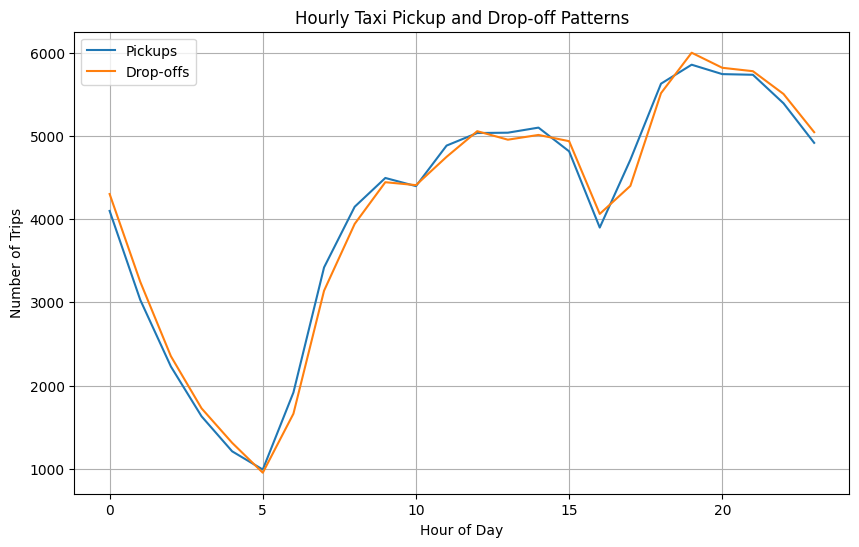

In [ ]:
# Extract hour from pickup and dropoff datetime
combined_df = combined_df.withColumn("pickup_hour", F.hour("pickup_datetime"))
combined_df = combined_df.withColumn("dropoff_hour", F.hour("dropoff_datetime"))

# Group by pickup and dropoff hour
pickup_hourly = combined_df.groupBy("pickup_hour").count().orderBy("pickup_hour")
dropoff_hourly = combined_df.groupBy("dropoff_hour").count().orderBy("dropoff_hour")

pickup_hourly.show()
dropoff_hourly.show()

# Convert to Pandas DataFrame for plotting
pickup_hourly_pd = pickup_hourly.toPandas()
dropoff_hourly_pd = dropoff_hourly.toPandas()

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(pickup_hourly_pd["pickup_hour"], pickup_hourly_pd["count"], label="Pickups")
plt.plot(dropoff_hourly_pd["dropoff_hour"], dropoff_hourly_pd["count"], label="Drop-offs")
plt.xlabel("Hour of Day")
plt.ylabel("Number of Trips")
plt.title("Hourly Taxi Pickup and Drop-off Patterns")
plt.legend()
plt.grid(True)
plt.show()


55.How does the average fare amount vary by hour of the day?

+-----------+------------------+
|pickup_hour|          avg_fare|
+-----------+------------------+
|          0|12.958404488899731|
|          1|12.699257425742575|
|          2|12.524226110363392|
|          3|13.061005518087063|
|          4|14.632644628099174|
|          5|16.562058526740667|
|          6|13.414627021387584|
|          7|11.989766081871345|
|          8| 12.03699686671487|
|          9|12.023359288097886|
|         10|12.131851262224243|
|         11|12.144758394758394|
|         12| 12.01291956305859|
|         13|12.495634054375868|
|         14|13.116666666666667|
|         15|13.260539979231568|
|         16|13.386509361374712|
|         17|12.817034365719135|
|         18|12.334674840085288|
|         19|11.813780737704919|
+-----------+------------------+
only showing top 20 rows



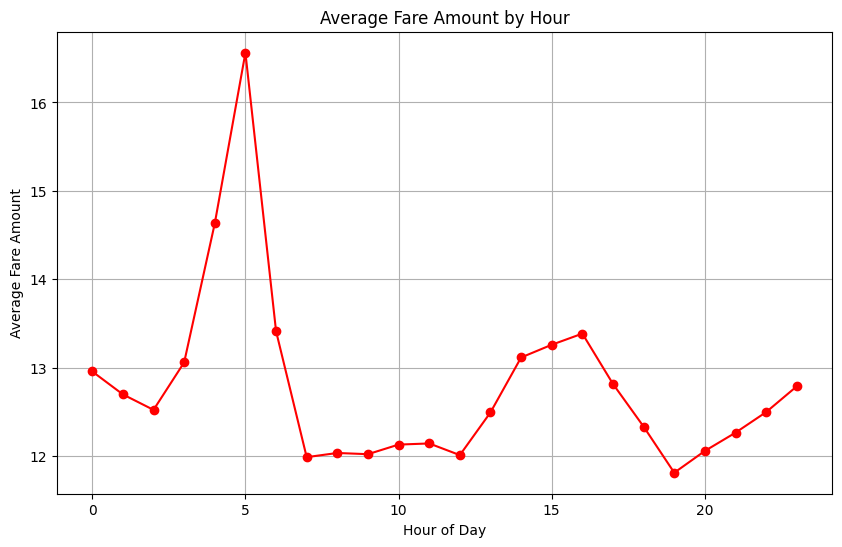

In [ ]:
avg_fare_hourly = combined_df.groupBy("pickup_hour").agg(F.avg("fare_amount").alias("avg_fare")).orderBy("pickup_hour")
avg_fare_hourly.show()

# Convert to Pandas DataFrame for plotting
avg_fare_hourly_pd = avg_fare_hourly.toPandas()

plt.figure(figsize=(10, 6))
plt.plot(avg_fare_hourly_pd["pickup_hour"], avg_fare_hourly_pd["avg_fare"], marker='o', color='red')
plt.xlabel("Hour of Day")
plt.ylabel("Average Fare Amount")
plt.title("Average Fare Amount by Hour")
plt.grid(True)
plt.show()

56.How does the average trip distance vary by hour of the day?

+-----------+------------------+
|pickup_hour|      avg_distance|
+-----------+------------------+
|          0|3.3445352525006116|
|          1|3.2690693069306915|
|          2| 3.276002691790041|
|          3| 3.480214592274681|
|          4| 4.121388429752067|
|          5|  4.97027245206862|
|          6|  3.65773604590506|
|          7|2.9995087719298232|
|          8|2.7088021209930084|
|          9|2.5791924360400458|
|         10| 2.676734136911533|
|         11| 2.590178132678129|
|         12|2.5246017874875815|
|         13|2.6989918634649706|
|         14| 2.879521568627452|
|         15| 2.956685358255457|
|         16|3.0586304180559094|
|         17|2.7749851506151906|
|         18|2.6244385216773214|
|         19| 2.574484289617485|
+-----------+------------------+
only showing top 20 rows



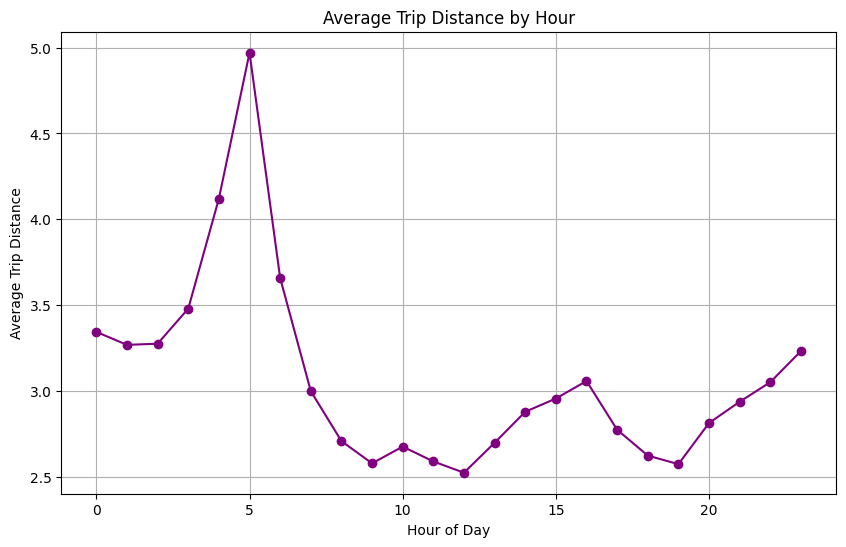

In [ ]:
avg_distance_hourly = combined_df.groupBy("pickup_hour").agg(F.avg("trip_distance").alias("avg_distance")).orderBy("pickup_hour")
avg_distance_hourly.show()

# Convert to Pandas DataFrame for plotting
avg_distance_hourly_pd = avg_distance_hourly.toPandas()

plt.figure(figsize=(10, 6))
plt.plot(avg_distance_hourly_pd["pickup_hour"], avg_distance_hourly_pd["avg_distance"], marker='o', color='purple')
plt.xlabel("Hour of Day")
plt.ylabel("Average Trip Distance")
plt.title("Average Trip Distance by Hour")
plt.grid(True)
plt.show()


57.What is the distribution of passenger counts across different hours?

+-----------+-------------------+
|pickup_hour|avg_passenger_count|
+-----------+-------------------+
|          0| 1.7533544767016345|
|          1| 1.7574257425742574|
|          2| 1.7039030955585464|
|          3|  1.748620478234212|
|          4| 1.7413223140495868|
|          5| 1.6024217961654894|
|          6| 1.5571205007824727|
|          7| 1.5880116959064328|
|          8| 1.6690768859966256|
|          9| 1.6353726362625138|
|         10| 1.6850125085285421|
|         11| 1.7432432432432432|
|         12| 1.7370407149950347|
|         13| 1.6914070252034135|
|         14|  1.741372549019608|
|         15| 1.7769470404984424|
|         16| 1.7809694793536803|
|         17| 1.7547730165464575|
|         18| 1.7450248756218905|
|         19|  1.762636612021858|
+-----------+-------------------+
only showing top 20 rows



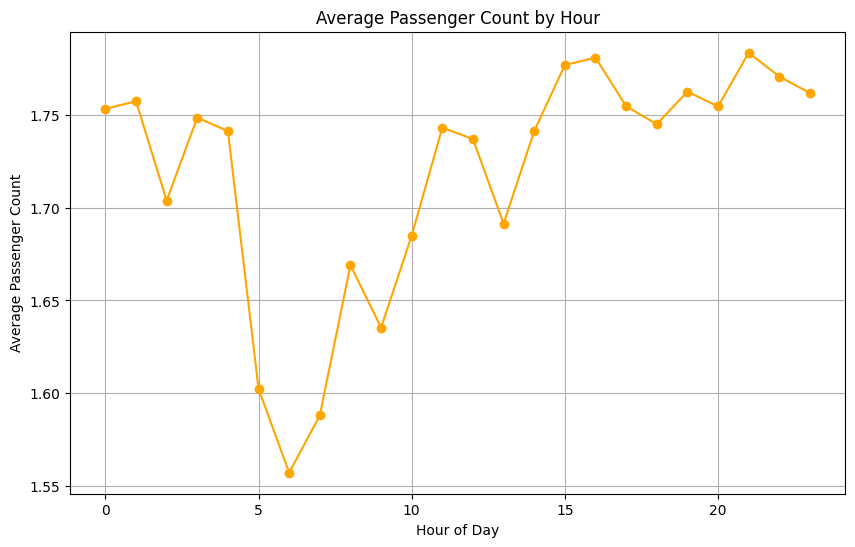

In [ ]:
passenger_hourly = combined_df.groupBy("pickup_hour").agg(F.avg("passenger_count").alias("avg_passenger_count")).orderBy("pickup_hour")
passenger_hourly.show()

# Convert to Pandas DataFrame for plotting
passenger_hourly_pd = passenger_hourly.toPandas()

plt.figure(figsize=(10, 6))
plt.plot(passenger_hourly_pd["pickup_hour"], passenger_hourly_pd["avg_passenger_count"], marker='o', color='orange')
plt.xlabel("Hour of Day")
plt.ylabel("Average Passenger Count")
plt.title("Average Passenger Count by Hour")
plt.grid(True)
plt.show()

58.Which hour has the highest total fare amount collected?

+-----------+----------+
|pickup_hour|total_fare|
+-----------+----------+
|          0|   53116.5|
|          1|  38478.75|
|          2|   27916.5|
|          3|   21302.5|
|          4|   17705.5|
|          5|   16413.0|
|          6|  25715.84|
|          7|   41005.0|
|          8|   49941.5|
|          9|   54045.0|
|         10|  53343.75|
|         11|   59315.0|
|         12|  60485.05|
|         13|   62965.5|
|         14|   66895.0|
|         15|   63849.5|
|         16|   52194.0|
|         17|   60419.5|
|         18|  69419.55|
|         19|   69181.5|
+-----------+----------+
only showing top 20 rows



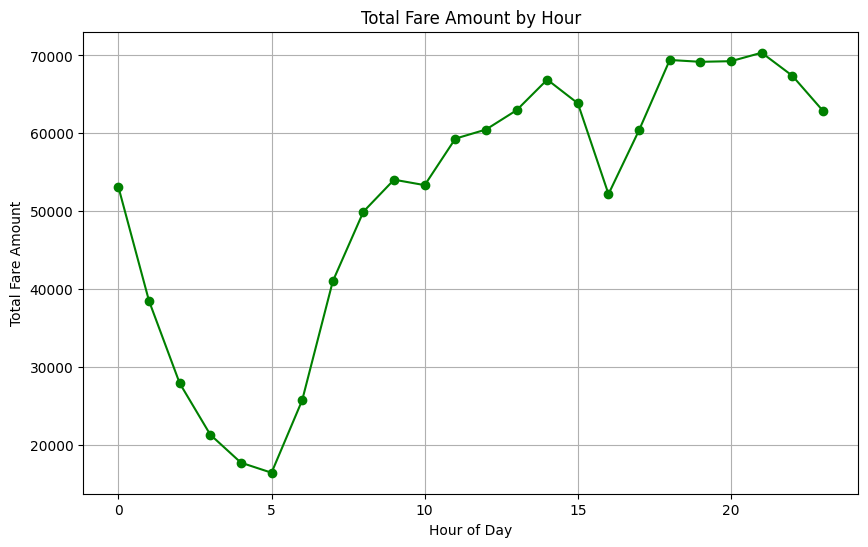

In [ ]:
total_fare_hourly = combined_df.groupBy("pickup_hour").agg(F.sum("fare_amount").alias("total_fare")).orderBy("pickup_hour")
total_fare_hourly.show()

# Convert to Pandas DataFrame for plotting
total_fare_hourly_pd = total_fare_hourly.toPandas()

plt.figure(figsize=(10, 6))
plt.plot(total_fare_hourly_pd["pickup_hour"], total_fare_hourly_pd["total_fare"], marker='o', color='green')
plt.xlabel("Hour of Day")
plt.ylabel("Total Fare Amount")
plt.title("Total Fare Amount by Hour")
plt.grid(True)
plt.show()

59.How does the number of passengers affect the fare amount by hour?

+-----------+----------+----------------+------------------+
|pickup_hour|total_fare|total_passengers|fare_per_passenger|
+-----------+----------+----------------+------------------+
|          0|   53116.5|            7187| 7.390635870321414|
|          1|  38478.75|            5325| 7.226056338028169|
|          2|   27916.5|            3798| 7.350315955766193|
|          3|   21302.5|            2852| 7.469319775596073|
|          4|   17705.5|            2107| 8.403179876601804|
|          5|   16413.0|            1588|10.335642317380353|
|          6|  25715.84|            2985| 8.615021775544388|
|          7|   41005.0|            5431| 7.550174921745535|
|          8|   49941.5|            6925| 7.211768953068592|
|          9|   54045.0|            7351|7.3520609440892395|
|         10|  53343.75|            7409| 7.199858280469699|
|         11|   59315.0|            8514| 6.966760629551327|
|         12|  60485.05|            8746| 6.915738623370684|
|         13|   62965.5|

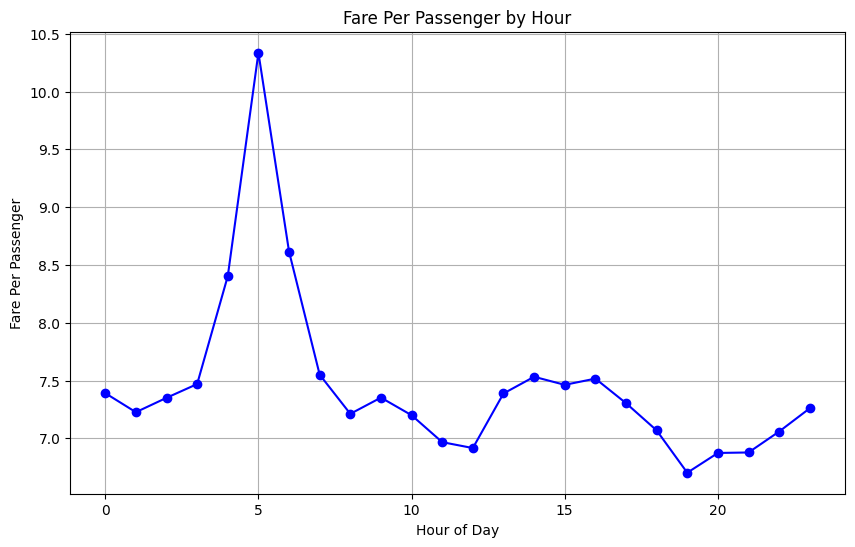

In [ ]:
fare_per_passenger_hourly = combined_df.groupBy("pickup_hour").agg(F.sum("fare_amount").alias("total_fare"), F.sum("passenger_count").alias("total_passengers")).orderBy("pickup_hour")
fare_per_passenger_hourly = fare_per_passenger_hourly.withColumn("fare_per_passenger", fare_per_passenger_hourly["total_fare"] / fare_per_passenger_hourly["total_passengers"])
fare_per_passenger_hourly.show()

# Convert to Pandas DataFrame for plotting
fare_per_passenger_hourly_pd = fare_per_passenger_hourly.select("pickup_hour", "fare_per_passenger").toPandas()

plt.figure(figsize=(10, 6))
plt.plot(fare_per_passenger_hourly_pd["pickup_hour"], fare_per_passenger_hourly_pd["fare_per_passenger"], marker='o', color='blue')
plt.xlabel("Hour of Day")
plt.ylabel("Fare Per Passenger")
plt.title("Fare Per Passenger by Hour")
plt.grid(True)
plt.show()


60.What is the distribution of payment types across different hours?

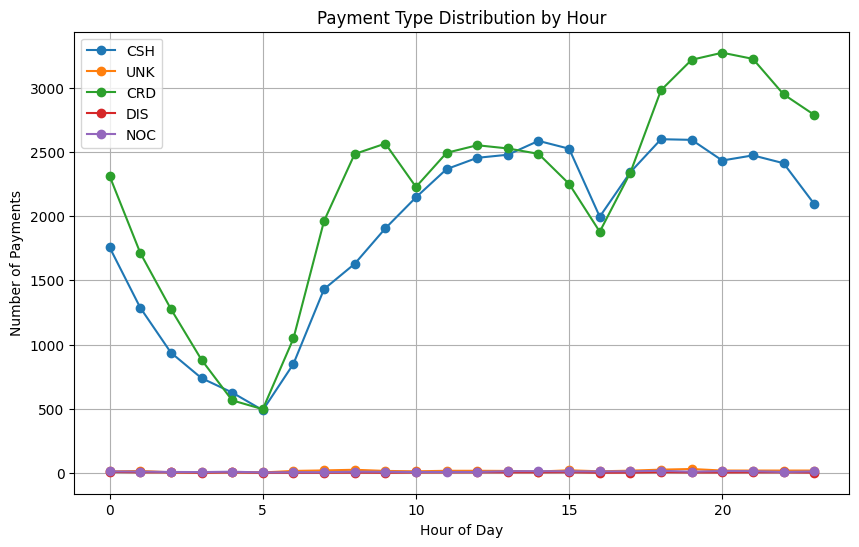

In [ ]:
payment_hourly = combined_df.groupBy("pickup_hour", "payment_type").count().orderBy("pickup_hour")
payment_hourly_pd = payment_hourly.toPandas()

plt.figure(figsize=(10, 6))
for payment_type in payment_hourly_pd["payment_type"].unique():
    subset = payment_hourly_pd[payment_hourly_pd["payment_type"] == payment_type]
    plt.plot(subset["pickup_hour"], subset["count"], marker='o', label=payment_type)
plt.xlabel("Hour of Day")
plt.ylabel("Number of Payments")
plt.title("Payment Type Distribution by Hour")
plt.legend()
plt.grid(True)
plt.show()

61.How do trip times vary by hour of the day?

+-----------+-----------------+
|pickup_hour|    avg_trip_time|
+-----------+-----------------+
|          0|701.5867284703586|
|          1|667.7864686468647|
|          2| 636.361148497084|
|          3|666.0968730839976|
|          4|663.6553719008265|
|          5|705.1281533804238|
|          6|644.4235785080856|
|          7|694.0739766081871|
|          8|776.9669799951796|
|          9|789.7134593993326|
|         10|793.2433477370935|
|         11|827.0911138411138|
|         12|809.1819265143992|
|         13|837.8525501091486|
|         14|895.8723529411765|
|         15|920.9100726895119|
|         16|929.7622467299308|
|         17|911.8797199830293|
|         18|860.7359630419332|
|         19|791.7243852459017|
+-----------+-----------------+
only showing top 20 rows



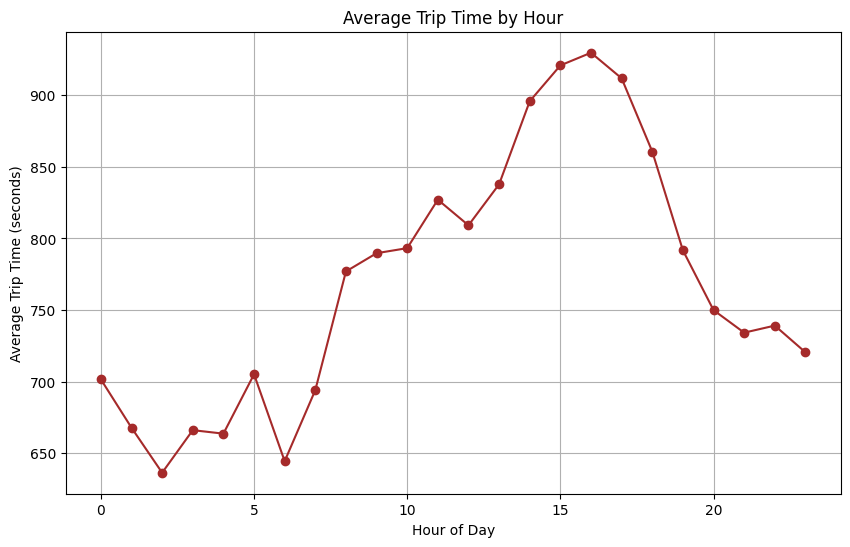

In [ ]:
avg_trip_time_hourly = combined_df.groupBy("pickup_hour").agg(F.avg("trip_time_in_secs").alias("avg_trip_time")).orderBy("pickup_hour")
avg_trip_time_hourly.show()

# Convert to Pandas DataFrame for plotting
avg_trip_time_hourly_pd = avg_trip_time_hourly.toPandas()

plt.figure(figsize=(10, 6))
plt.plot(avg_trip_time_hourly_pd["pickup_hour"], avg_trip_time_hourly_pd["avg_trip_time"], marker='o', color='brown')
plt.xlabel("Hour of Day")
plt.ylabel("Average Trip Time (seconds)")
plt.title("Average Trip Time by Hour")
plt.grid(True)
plt.show()

62.How do tip amounts vary by hour of the day?

+-----------+------------------+
|pickup_hour|           avg_tip|
+-----------+------------------+
|          0|1.5108392290802615|
|          1|1.4492706270627043|
|          2|1.3886720502467467|
|          3|1.2892029429797678|
|          4|1.4984628099173551|
|          5| 1.819051463168516|
|          6| 1.535732916014605|
|          7|1.4062426900584786|
|          8| 1.452545191612436|
|          9|1.4067074527252499|
|         10|1.2797975892654083|
|         11| 1.296388206388205|
|         12|1.2926494538232356|
|         13|1.2926394125818605|
|         14| 1.323772549019606|
|         15|1.3643343717549308|
|         16|1.4542908438061033|
|         17|1.4375837929571487|
|         18|1.4192448471926091|
|         19| 1.380107581967212|
+-----------+------------------+
only showing top 20 rows



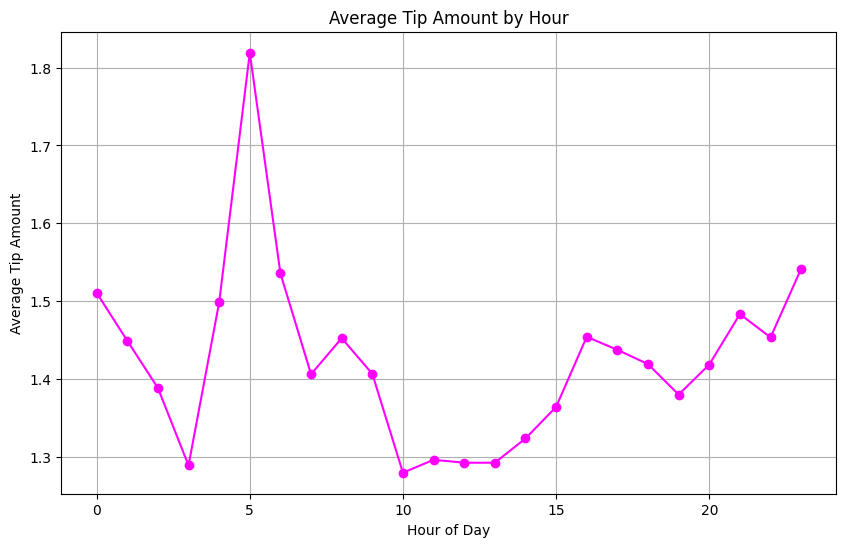

In [ ]:
avg_tip_hourly = combined_df.groupBy("pickup_hour").agg(F.avg("tip_amount").alias("avg_tip")).orderBy("pickup_hour")
avg_tip_hourly.show()

# Convert to Pandas DataFrame for plotting
avg_tip_hourly_pd = avg_tip_hourly.toPandas()

plt.figure(figsize=(10, 6))
plt.plot(avg_tip_hourly_pd["pickup_hour"], avg_tip_hourly_pd["avg_tip"], marker='o', color='magenta')
plt.xlabel("Hour of Day")
plt.ylabel("Average Tip Amount")
plt.title("Average Tip Amount by Hour")
plt.grid(True)
plt.show()

63.How do taxi pickups vary by day of the week?

+----------+-----+
|pickup_day|count|
+----------+-----+
|    Monday|14724|
|   Tuesday|15915|
| Wednesday|11985|
|  Thursday|12829|
|    Friday|13998|
|  Saturday|13561|
|    Sunday|15313|
+----------+-----+



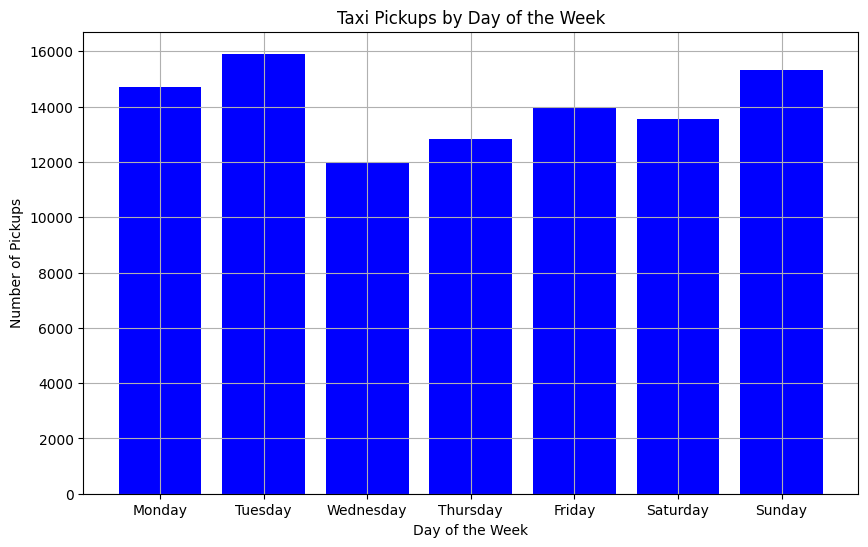

In [ ]:
pickup_daily = combined_df.groupBy("pickup_day").count().orderBy(F.when(F.col("pickup_day") == "Monday", 1)
                                                                .when(F.col("pickup_day") == "Tuesday", 2)
                                                                .when(F.col("pickup_day") == "Wednesday", 3)
                                                                .when(F.col("pickup_day") == "Thursday", 4)
                                                                .when(F.col("pickup_day") == "Friday", 5)
                                                                .when(F.col("pickup_day") == "Saturday", 6)
                                                                .when(F.col("pickup_day") == "Sunday", 7))
pickup_daily.show()

# Convert to Pandas DataFrame for plotting
pickup_daily_pd = pickup_daily.toPandas()

plt.figure(figsize=(10, 6))
plt.bar(pickup_daily_pd["pickup_day"], pickup_daily_pd["count"], color='blue')
plt.xlabel("Day of the Week")
plt.ylabel("Number of Pickups")
plt.title("Taxi Pickups by Day of the Week")
plt.grid(True)
plt.show()


64.How do taxi drop-offs vary by day of the week?

+-----------+-----+
|dropoff_day|count|
+-----------+-----+
|     Monday|14685|
|    Tuesday|15945|
|  Wednesday|11968|
|   Thursday|12805|
|     Friday|13958|
|   Saturday|13595|
|     Sunday|15369|
+-----------+-----+



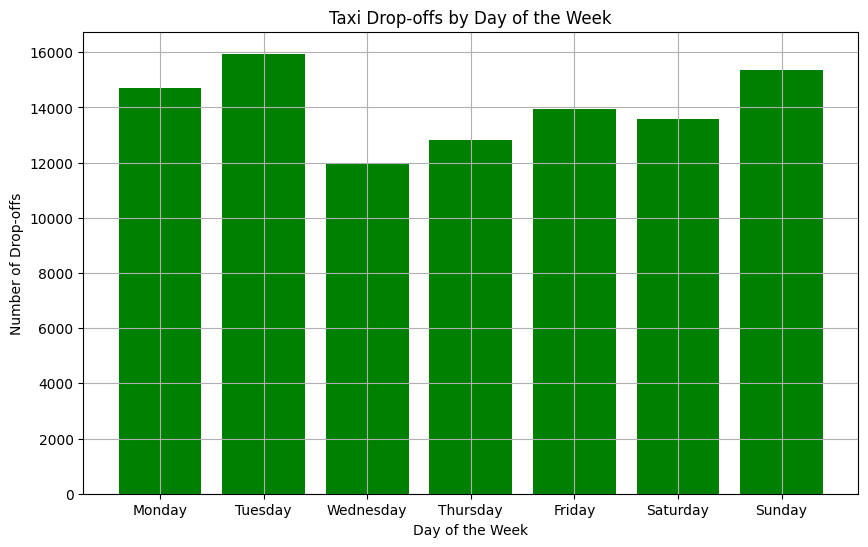

In [ ]:
dropoff_daily = combined_df.groupBy("dropoff_day").count().orderBy(F.when(F.col("dropoff_day") == "Monday", 1)
                                                                  .when(F.col("dropoff_day") == "Tuesday", 2)
                                                                  .when(F.col("dropoff_day") == "Wednesday", 3)
                                                                  .when(F.col("dropoff_day") == "Thursday", 4)
                                                                  .when(F.col("dropoff_day") == "Friday", 5)
                                                                  .when(F.col("dropoff_day") == "Saturday", 6)
                                                                  .when(F.col("dropoff_day") == "Sunday", 7))
dropoff_daily.show()

# Convert to Pandas DataFrame for plotting
dropoff_daily_pd = dropoff_daily.toPandas()

plt.figure(figsize=(10, 6))
plt.bar(dropoff_daily_pd["dropoff_day"], dropoff_daily_pd["count"], color='green')
plt.xlabel("Day of the Week")
plt.ylabel("Number of Drop-offs")
plt.title("Taxi Drop-offs by Day of the Week")
plt.grid(True)
plt.show()

65.How does the average fare amount vary by day of the week?

+----------+------------------+
|pickup_day|          avg_fare|
+----------+------------------+
|    Monday|12.547694240695463|
|   Tuesday| 11.82402450518379|
| Wednesday|12.890613266583228|
|  Thursday|12.872086678618754|
|    Friday|12.811675239319904|
|  Saturday|12.324608067251678|
|    Sunday|12.706686475543655|
+----------+------------------+



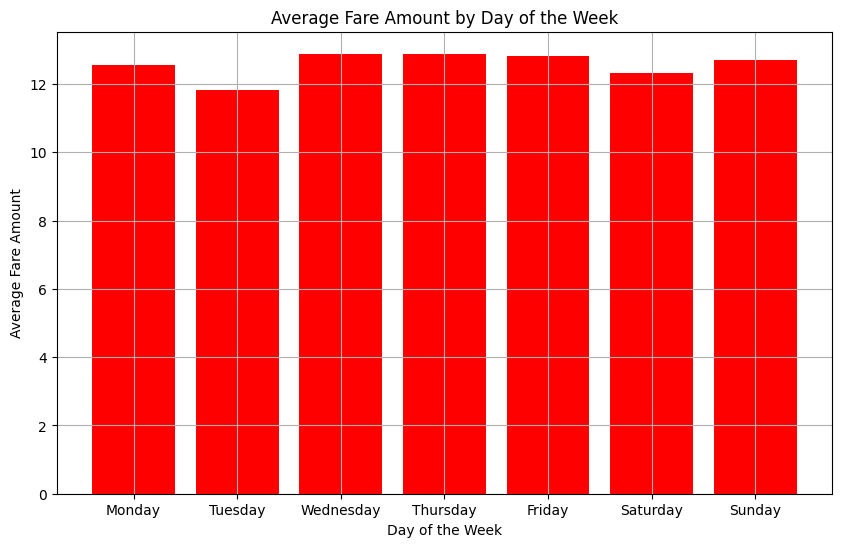

In [ ]:
avg_fare_daily = combined_df.groupBy("pickup_day").agg(F.avg("fare_amount").alias("avg_fare")).orderBy(F.when(F.col("pickup_day") == "Monday", 1)
                                                                                                      .when(F.col("pickup_day") == "Tuesday", 2)
                                                                                                      .when(F.col("pickup_day") == "Wednesday", 3)
                                                                                                      .when(F.col("pickup_day") == "Thursday", 4)
                                                                                                      .when(F.col("pickup_day") == "Friday", 5)
                                                                                                      .when(F.col("pickup_day") == "Saturday", 6)
                                                                                                      .when(F.col("pickup_day") == "Sunday", 7))
avg_fare_daily.show()

# Convert to Pandas DataFrame for plotting
avg_fare_daily_pd = avg_fare_daily.toPandas()

plt.figure(figsize=(10, 6))
plt.bar(avg_fare_daily_pd["pickup_day"], avg_fare_daily_pd["avg_fare"], color='red')
plt.xlabel("Day of the Week")
plt.ylabel("Average Fare Amount")
plt.title("Average Fare Amount by Day of the Week")
plt.grid(True)
plt.show()


66.How does the average trip distance vary by day of the week?

+----------+------------------+
|pickup_day|      avg_distance|
+----------+------------------+
|    Monday|2.9495320565063876|
|   Tuesday| 2.720581841030475|
| Wednesday|2.9175168961201514|
|  Thursday| 2.872752357939047|
|    Friday|  2.89890341477354|
|  Saturday| 2.862659095936881|
|    Sunday|3.1691314569320177|
+----------+------------------+



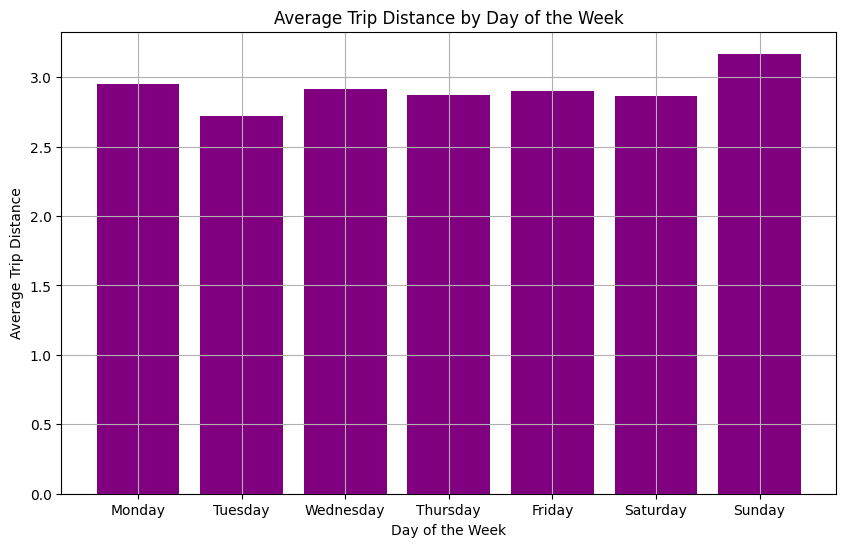

In [ ]:
avg_distance_daily = combined_df.groupBy("pickup_day").agg(F.avg("trip_distance").alias("avg_distance")).orderBy(F.when(F.col("pickup_day") == "Monday", 1)
                                                                                                                 .when(F.col("pickup_day") == "Tuesday", 2)
                                                                                                                 .when(F.col("pickup_day") == "Wednesday", 3)
                                                                                                                 .when(F.col("pickup_day") == "Thursday", 4)
                                                                                                                 .when(F.col("pickup_day") == "Friday", 5)
                                                                                                                 .when(F.col("pickup_day") == "Saturday", 6)
                                                                                                                 .when(F.col("pickup_day") == "Sunday", 7))
avg_distance_daily.show()

# Convert to Pandas DataFrame for plotting
avg_distance_daily_pd = avg_distance_daily.toPandas()

plt.figure(figsize=(10, 6))
plt.bar(avg_distance_daily_pd["pickup_day"], avg_distance_daily_pd["avg_distance"], color='purple')
plt.xlabel("Day of the Week")
plt.ylabel("Average Trip Distance")
plt.title("Average Trip Distance by Day of the Week")
plt.grid(True)
plt.show()


67.How does the total fare amount vary by day of the week?

+----------+------------------+
|pickup_day|        total_fare|
+----------+------------------+
|    Monday|         184752.25|
|   Tuesday|         188179.35|
| Wednesday|          154494.0|
|  Thursday|          165136.0|
|    Friday|179337.83000000002|
|  Saturday|         167134.01|
|    Sunday|         194577.49|
+----------+------------------+



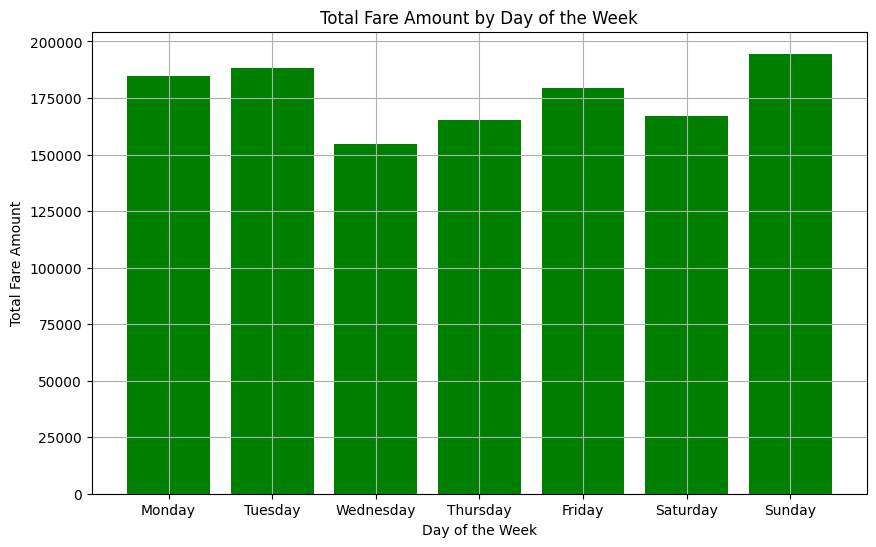

In [ ]:
total_fare_daily = combined_df.groupBy("pickup_day").agg(F.sum("fare_amount").alias("total_fare")).orderBy(F.when(F.col("pickup_day") == "Monday", 1)
                                                                                                         .when(F.col("pickup_day") == "Tuesday", 2)
                                                                                                         .when(F.col("pickup_day") == "Wednesday", 3)
                                                                                                         .when(F.col("pickup_day") == "Thursday", 4)
                                                                                                         .when(F.col("pickup_day") == "Friday", 5)
                                                                                                         .when(F.col("pickup_day") == "Saturday", 6)
                                                                                                         .when(F.col("pickup_day") == "Sunday", 7))
total_fare_daily.show()

# Convert to Pandas DataFrame for plotting
total_fare_daily_pd = total_fare_daily.toPandas()

plt.figure(figsize=(10, 6))
plt.bar(total_fare_daily_pd["pickup_day"], total_fare_daily_pd["total_fare"], color='green')
plt.xlabel("Day of the Week")
plt.ylabel("Total Fare Amount")
plt.title("Total Fare Amount by Day of the Week")
plt.grid(True)
plt.show()

68.How does the average trip time vary by day of the week?

+----------+-----------------+
|pickup_day|    avg_trip_time|
+----------+-----------------+
|    Monday|789.4784026079869|
|   Tuesday| 733.168960100534|
| Wednesday| 834.403587818106|
|  Thursday|845.7820562787434|
|    Friday|842.8114730675811|
|  Saturday|776.6136715581447|
|    Sunday|724.3678573760857|
+----------+-----------------+



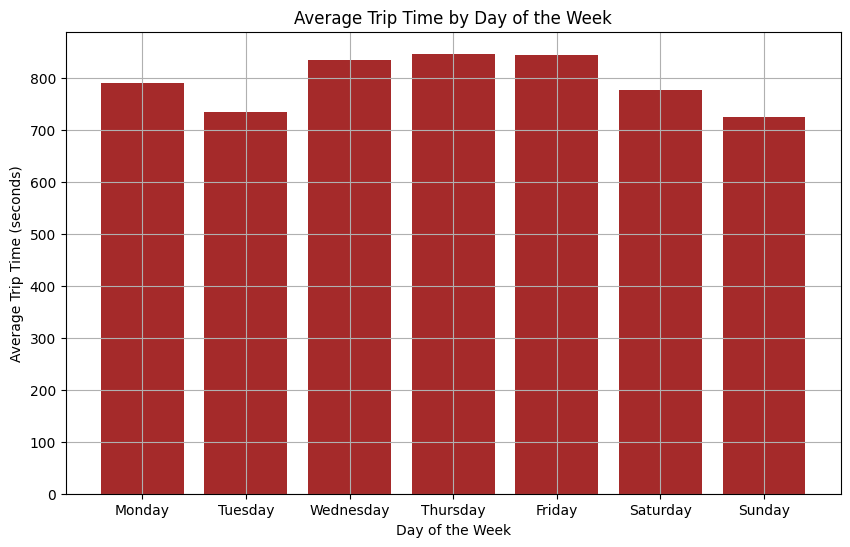

In [ ]:
avg_trip_time_daily = combined_df.groupBy("pickup_day").agg(F.avg("trip_time_in_secs").alias("avg_trip_time")).orderBy(F.when(F.col("pickup_day") == "Monday", 1)
                                                                                                                    .when(F.col("pickup_day") == "Tuesday", 2)
                                                                                                                    .when(F.col("pickup_day") == "Wednesday", 3)
                                                                                                                    .when(F.col("pickup_day") == "Thursday", 4)
                                                                                                                    .when(F.col("pickup_day") == "Friday", 5)
                                                                                                                    .when(F.col("pickup_day") == "Saturday", 6)
                                                                                                                    .when(F.col("pickup_day") == "Sunday", 7))
avg_trip_time_daily.show()

# Convert to Pandas DataFrame for plotting
avg_trip_time_daily_pd = avg_trip_time_daily.toPandas()

plt.figure(figsize=(10, 6))
plt.bar(avg_trip_time_daily_pd["pickup_day"], avg_trip_time_daily_pd["avg_trip_time"], color='brown')
plt.xlabel("Day of the Week")
plt.ylabel("Average Trip Time (seconds)")
plt.title("Average Trip Time by Day of the Week")
plt.grid(True)
plt.show()


69.How does the average tip amount vary by day of the week?

+----------+------------------+
|pickup_day|           avg_tip|
+----------+------------------+
|    Monday|1.3835615321923405|
|   Tuesday|1.3735840402136361|
| Wednesday|1.5477972465581995|
|  Thursday|  1.51971782679866|
|    Friday|1.4339677096728112|
|  Saturday| 1.275203156109432|
|    Sunday|1.3549141252530539|
+----------+------------------+



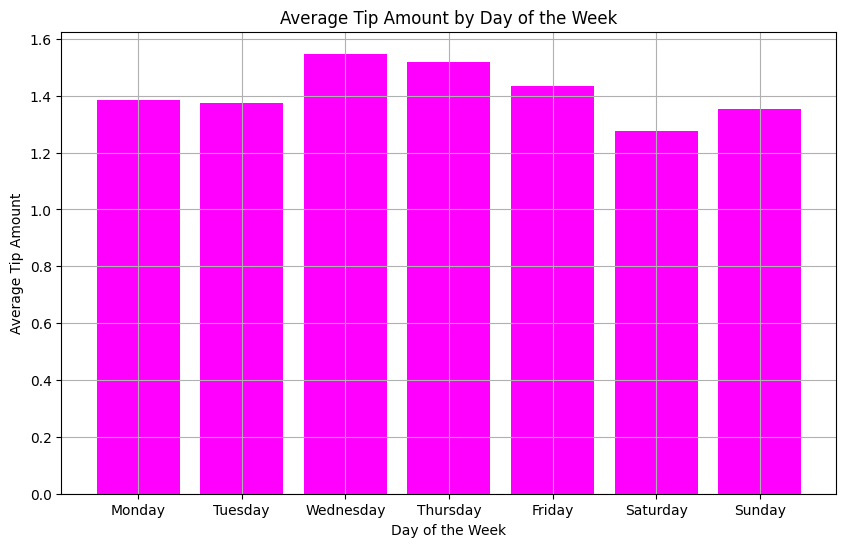

In [ ]:
avg_tip_daily = combined_df.groupBy("pickup_day").agg(F.avg("tip_amount").alias("avg_tip")).orderBy(F.when(F.col("pickup_day") == "Monday", 1)
                                                                                                  .when(F.col("pickup_day") == "Tuesday", 2)
                                                                                                  .when(F.col("pickup_day") == "Wednesday", 3)
                                                                                                  .when(F.col("pickup_day") == "Thursday", 4)
                                                                                                  .when(F.col("pickup_day") == "Friday", 5)
                                                                                                  .when(F.col("pickup_day") == "Saturday", 6)
                                                                                                  .when(F.col("pickup_day") == "Sunday", 7))
avg_tip_daily.show()

# Convert to Pandas DataFrame for plotting
avg_tip_daily_pd = avg_tip_daily.toPandas()

plt.figure(figsize=(10, 6))
plt.bar(avg_tip_daily_pd["pickup_day"], avg_tip_daily_pd["avg_tip"], color='magenta')
plt.xlabel("Day of the Week")
plt.ylabel("Average Tip Amount")
plt.title("Average Tip Amount by Day of the Week")
plt.grid(True)
plt.show()

70.What is the distribution of trip distances for each day of the week?

+----------+------------------+
|pickup_day| avg_trip_distance|
+----------+------------------+
|    Monday|2.9495320565063876|
|   Tuesday| 2.720581841030475|
| Wednesday|2.9175168961201514|
|  Thursday| 2.872752357939047|
|    Friday|  2.89890341477354|
|  Saturday| 2.862659095936881|
|    Sunday|3.1691314569320177|
+----------+------------------+



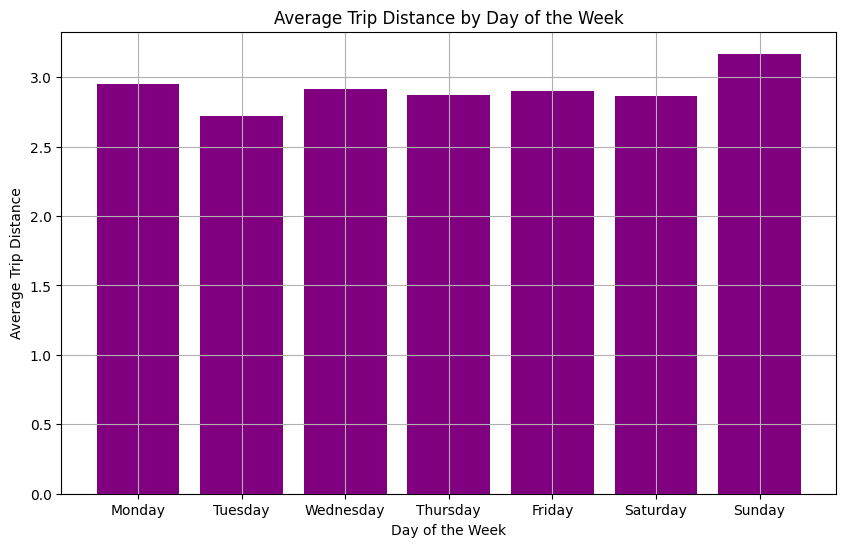

In [ ]:
trip_distance_daily = combined_df.groupBy("pickup_day").agg(F.avg("trip_distance").alias("avg_trip_distance")).orderBy(F.when(F.col("pickup_day") == "Monday", 1)
                                                                                                                     .when(F.col("pickup_day") == "Tuesday", 2)
                                                                                                                     .when(F.col("pickup_day") == "Wednesday", 3)
                                                                                                                     .when(F.col("pickup_day") == "Thursday", 4)
                                                                                                                     .when(F.col("pickup_day") == "Friday", 5)
                                                                                                                     .when(F.col("pickup_day") == "Saturday", 6)
                                                                                                                     .when(F.col("pickup_day") == "Sunday", 7))
trip_distance_daily.show()

# Convert to Pandas DataFrame for plotting
trip_distance_daily_pd = trip_distance_daily.toPandas()

plt.figure(figsize=(10, 6))
plt.bar(trip_distance_daily_pd["pickup_day"], trip_distance_daily_pd["avg_trip_distance"], color='purple')
plt.xlabel("Day of the Week")
plt.ylabel("Average Trip Distance")
plt.title("Average Trip Distance by Day of the Week")
plt.grid(True)
plt.show()

71.What are the peak hours for taxi pickups on weekdays vs. weekends?

+-----------+----------+-----+
|pickup_hour|is_weekend|count|
+-----------+----------+-----+
|          0|         1| 1782|
|          0|         0| 2317|
|          1|         1| 1525|
|          1|         0| 1505|
|          2|         1| 1257|
|          2|         0|  972|
|          3|         0|  603|
|          3|         1| 1028|
|          4|         0|  576|
|          4|         1|  634|
|          5|         1|  307|
|          5|         0|  684|
|          6|         1|  321|
|          6|         0| 1596|
|          7|         1|  414|
|          7|         0| 3006|
|          8|         1|  631|
|          8|         0| 3518|
|          9|         0| 3554|
|          9|         1|  941|
+-----------+----------+-----+
only showing top 20 rows



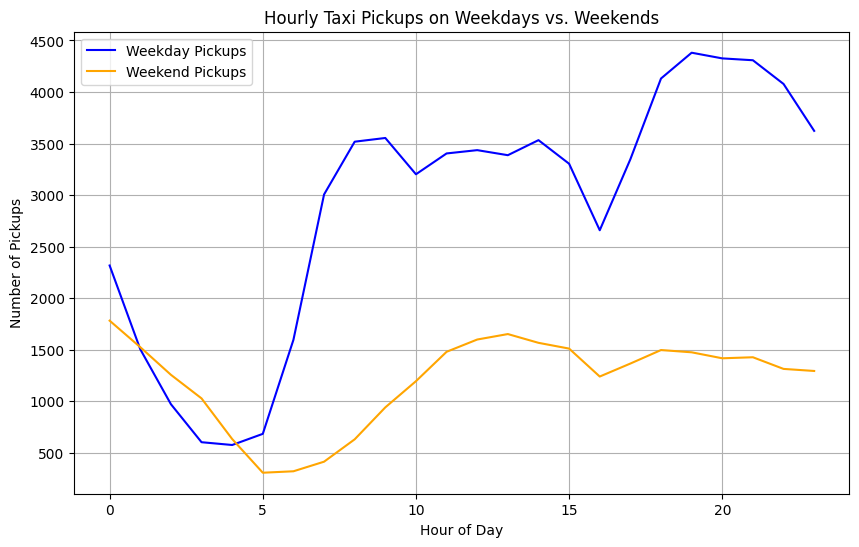

In [ ]:
combined_df = combined_df.withColumn("is_weekend", F.when(F.col("pickup_day").isin(["Saturday", "Sunday"]), 1).otherwise(0))

# Group by hour and is_weekend
pickup_hourly_weekend = combined_df.groupBy("pickup_hour", "is_weekend").count().orderBy("pickup_hour")
pickup_hourly_weekend.show()

# Convert to Pandas DataFrame for plotting
pickup_hourly_weekend_pd = pickup_hourly_weekend.toPandas()

plt.figure(figsize=(10, 6))
plt.plot(pickup_hourly_weekend_pd[pickup_hourly_weekend_pd["is_weekend"] == 0]["pickup_hour"], pickup_hourly_weekend_pd[pickup_hourly_weekend_pd["is_weekend"] == 0]["count"], label="Weekday Pickups", color='blue')
plt.plot(pickup_hourly_weekend_pd[pickup_hourly_weekend_pd["is_weekend"] == 1]["pickup_hour"], pickup_hourly_weekend_pd[pickup_hourly_weekend_pd["is_weekend"] == 1]["count"], label="Weekend Pickups", color='orange')
plt.xlabel("Hour of Day")
plt.ylabel("Number of Pickups")
plt.title("Hourly Taxi Pickups on Weekdays vs. Weekends")
plt.legend()
plt.grid(True)
plt.show()

72.How does the average fare amount vary by hour on weekdays vs. weekends?

+-----------+----------+------------------+
|pickup_hour|is_weekend|          avg_fare|
+-----------+----------+------------------+
|          0|         1|12.514309764309765|
|          0|         0| 13.29995684074234|
|          1|         1|             12.52|
|          1|         0|12.880897009966777|
|          2|         0| 12.86111111111111|
|          2|         1|12.263723150357995|
|          3|         0|12.883084577114428|
|          3|         1|13.165369649805447|
|          4|         0|15.408854166666666|
|          4|         1|13.927444794952681|
|          5|         0| 16.05921052631579|
|          5|         1| 17.68241042345277|
|          6|         1|18.314672897196264|
|          6|         0|12.429091478696742|
|          7|         1|15.079710144927537|
|          7|         0|11.564204923486361|
|          8|         1| 12.63946117274168|
|          8|         0|11.928936895963616|
|          9|         1|  11.5403825717322|
|          9|         0| 12.1512

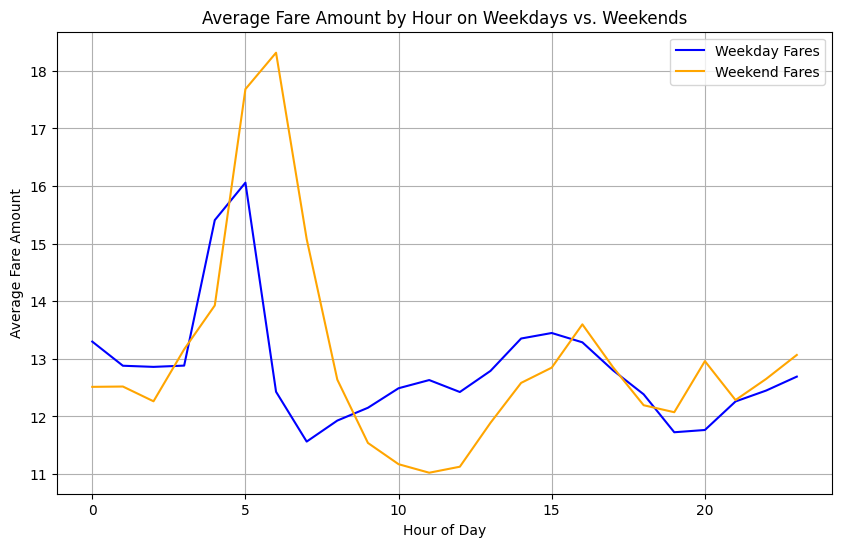

In [ ]:
avg_fare_hourly_weekend = combined_df.groupBy("pickup_hour", "is_weekend").agg(F.avg("fare_amount").alias("avg_fare")).orderBy("pickup_hour")
avg_fare_hourly_weekend.show()

# Convert to Pandas DataFrame for plotting
avg_fare_hourly_weekend_pd = avg_fare_hourly_weekend.toPandas()

plt.figure(figsize=(10, 6))
plt.plot(avg_fare_hourly_weekend_pd[avg_fare_hourly_weekend_pd["is_weekend"] == 0]["pickup_hour"], avg_fare_hourly_weekend_pd[avg_fare_hourly_weekend_pd["is_weekend"] == 0]["avg_fare"], label="Weekday Fares", color='blue')
plt.plot(avg_fare_hourly_weekend_pd[avg_fare_hourly_weekend_pd["is_weekend"] == 1]["pickup_hour"], avg_fare_hourly_weekend_pd[avg_fare_hourly_weekend_pd["is_weekend"] == 1]["avg_fare"], label="Weekend Fares", color='orange')
plt.xlabel("Hour of Day")
plt.ylabel("Average Fare Amount")
plt.title("Average Fare Amount by Hour on Weekdays vs. Weekends")
plt.legend()
plt.grid(True)
plt.show()

73.What are the most popular pickup locations by hour?

+---------------+----------------+-----------+-----+
|pickup_latitude|pickup_longitude|pickup_hour|count|
+---------------+----------------+-----------+-----+
|      40.732567|      -73.997192|          0|    1|
|      40.775402|      -73.982315|          0|    1|
|      40.716961|       -73.95649|          0|    1|
|      40.764557|       -73.98333|          0|    1|
|      40.745518|      -73.980385|          0|    1|
|      40.722103|      -73.997444|          0|    1|
|      40.726852|      -73.985458|          0|    1|
|      40.778172|       -73.94841|          0|    1|
|      40.744278|       -73.99604|          0|    1|
|       40.73447|      -73.954826|          0|    1|
|       40.74596|      -74.007484|          0|    1|
|      40.764099|      -73.977455|          0|    1|
|      40.718746|      -73.989204|          0|    1|
|      40.741131|       -74.00161|          0|    1|
|      40.731628|      -74.000961|          0|    1|
|      40.738018|      -73.996399|          0|

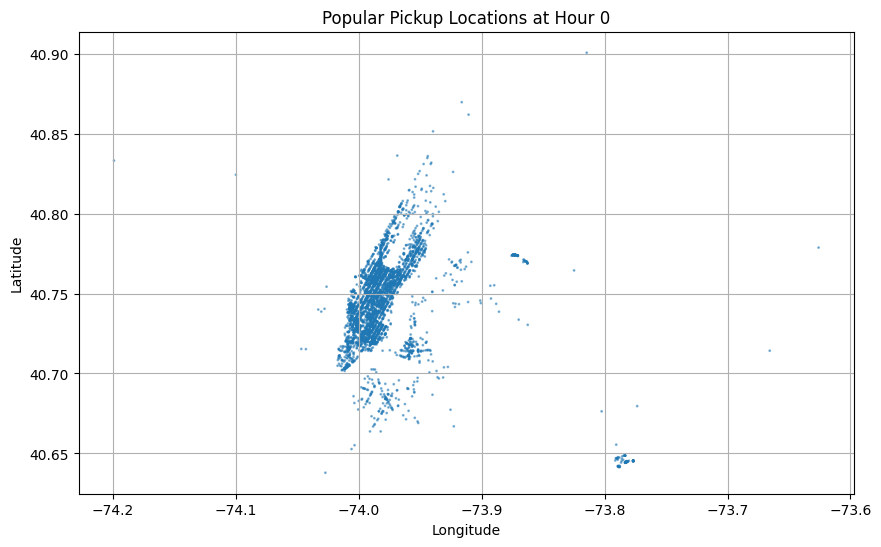

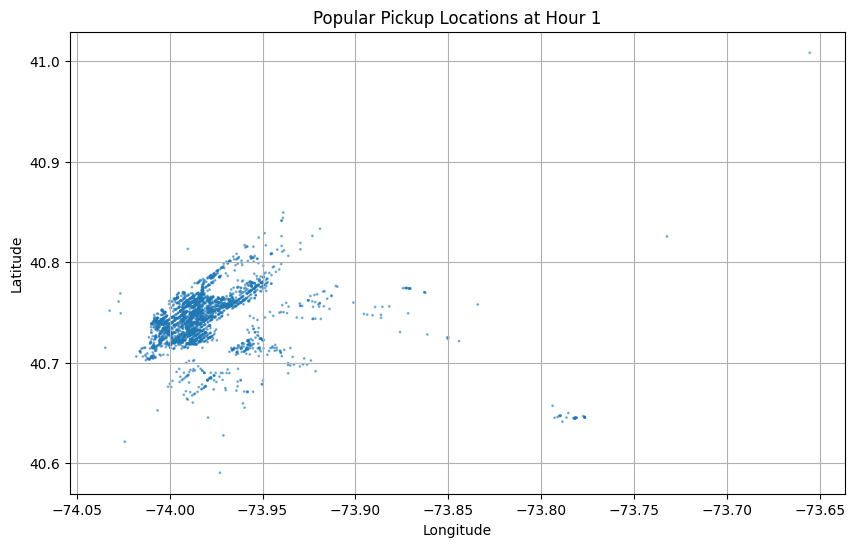

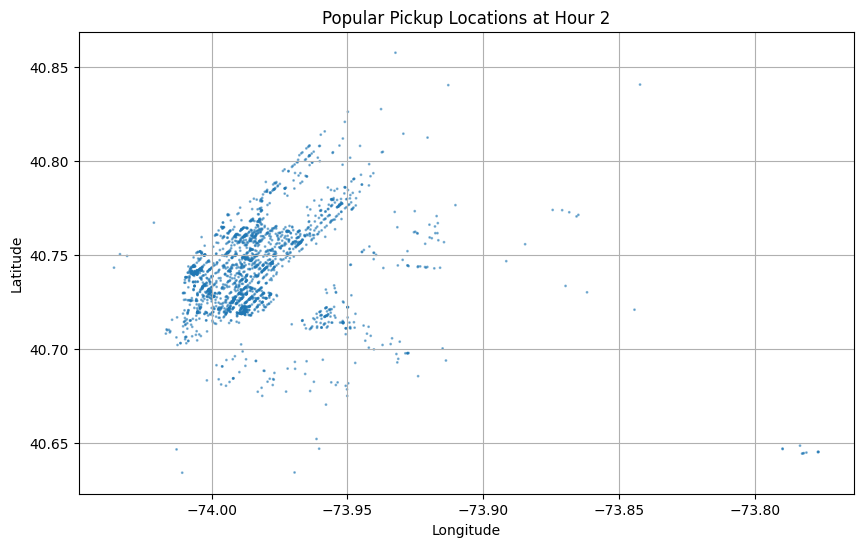

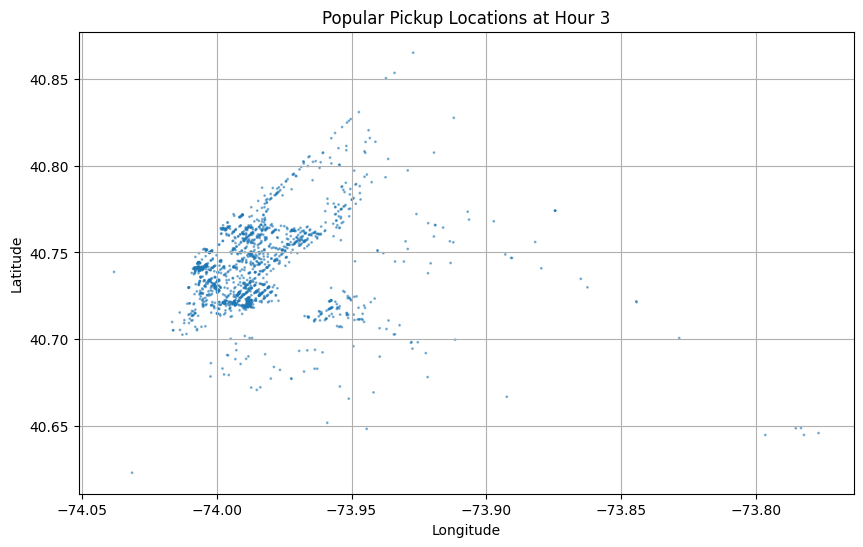

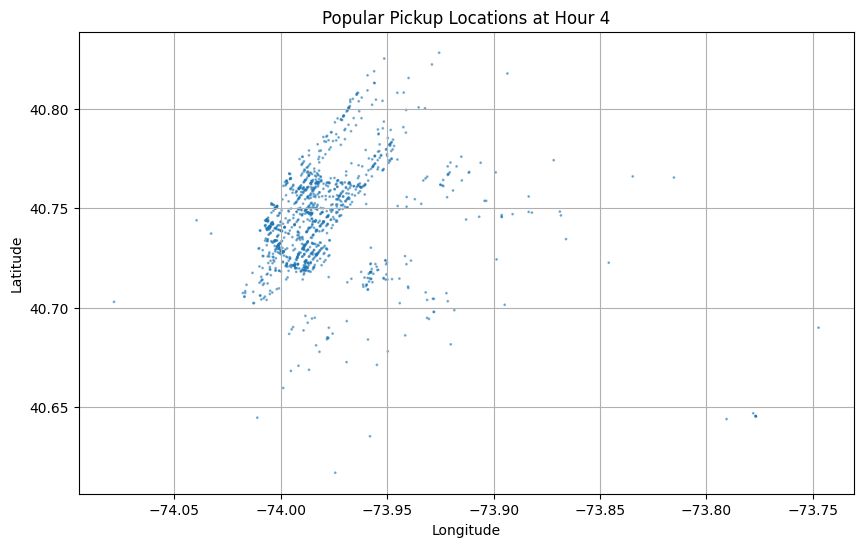

...

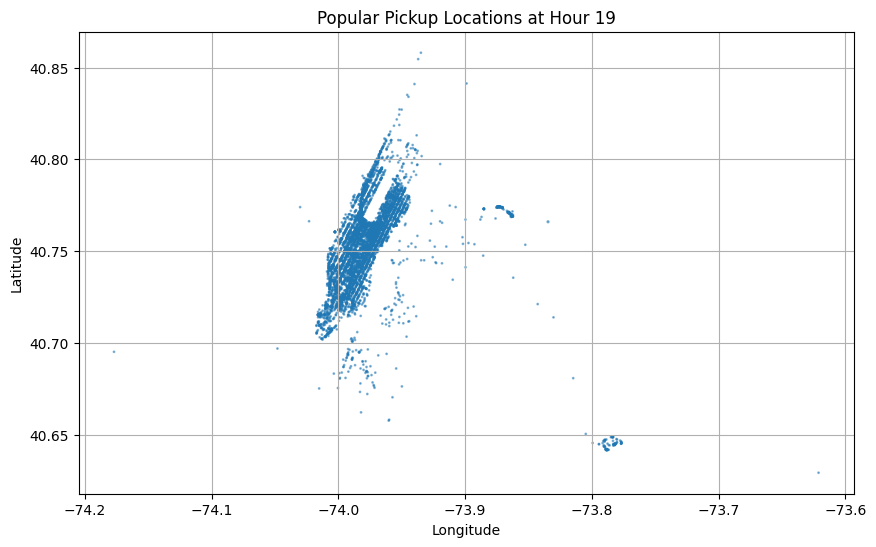

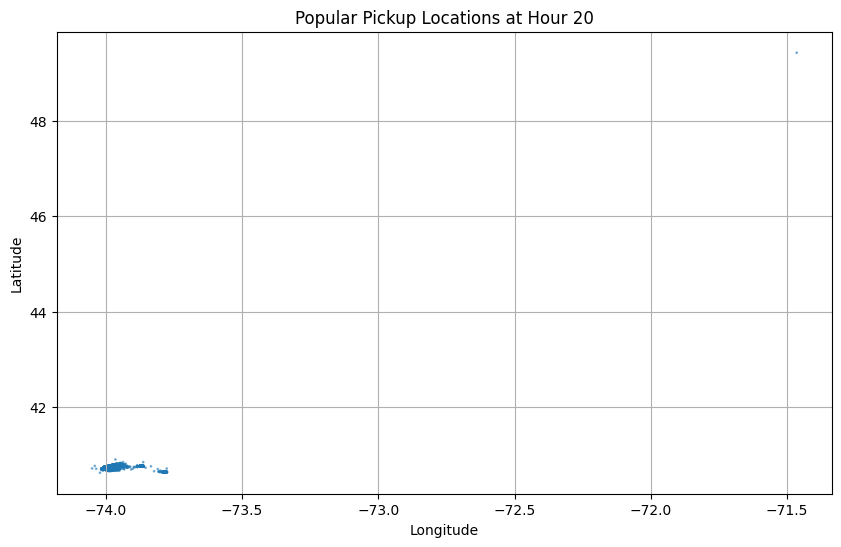

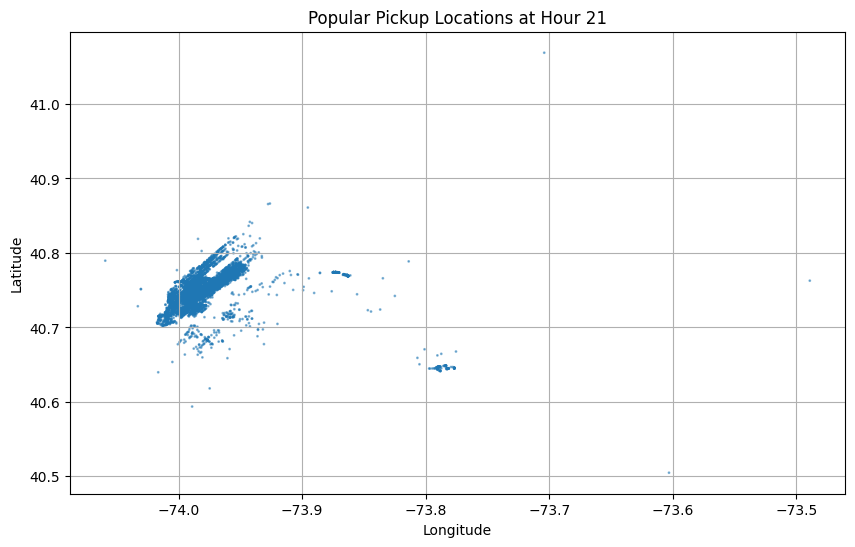

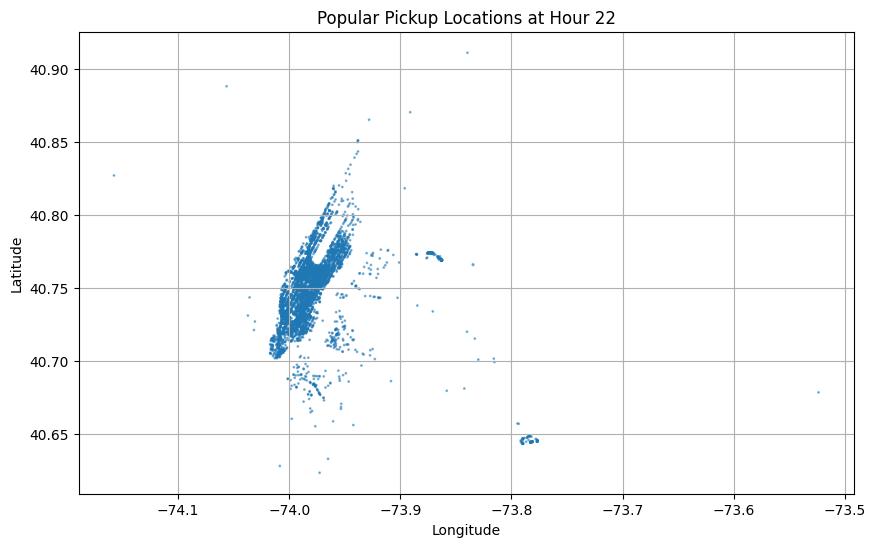

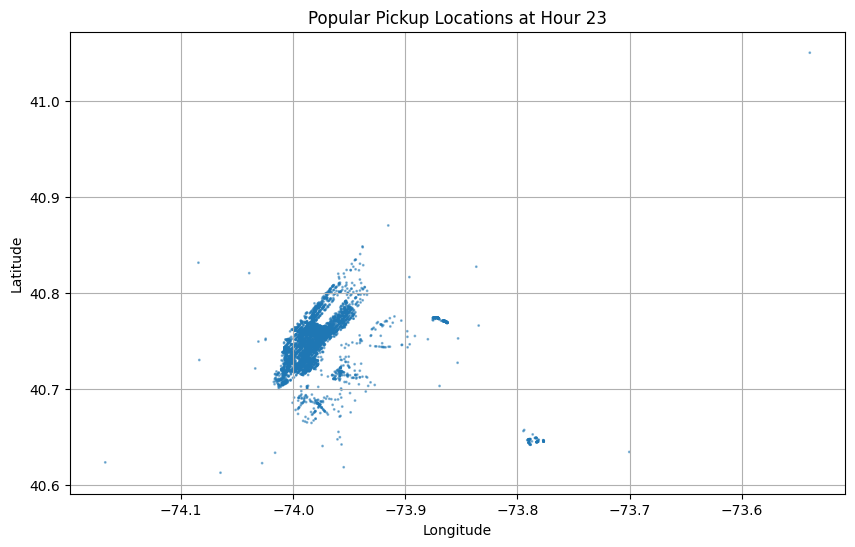

In [ ]:
pickup_locations_hourly = combined_df.groupBy("pickup_latitude", "pickup_longitude", "pickup_hour").count().orderBy("pickup_hour", F.desc("count"))
pickup_locations_hourly.show()

# Convert to Pandas DataFrame for plotting
pickup_locations_hourly_pd = pickup_locations_hourly.toPandas()

for hour in range(24):
    plt.figure(figsize=(10, 6))
    hour_data = pickup_locations_hourly_pd[pickup_locations_hourly_pd["pickup_hour"] == hour]
    plt.scatter(hour_data["pickup_longitude"], hour_data["pickup_latitude"], s=hour_data["count"], alpha=0.5)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title(f"Popular Pickup Locations at Hour {hour}")
    plt.grid(True)
    plt.show()

74.How do trip distances vary by pickup location and time of day?

+---------------+----------------+-----------+------------+
|pickup_latitude|pickup_longitude|pickup_hour|avg_distance|
+---------------+----------------+-----------+------------+
|      40.743183|      -73.973526|          0|         1.3|
|       40.71891|      -73.990379|          0|        4.82|
|      40.730968|      -74.001228|          0|        3.28|
|      40.709473|      -74.006683|          0|         4.9|
|      40.708069|      -74.003571|          0|         0.5|
|      40.740513|      -73.981255|          0|         1.7|
|      40.711094|      -74.008774|          0|        4.19|
|      40.680843|      -73.962509|          0|         1.1|
|      40.718906|       -74.00663|          0|        0.35|
|      40.723602|      -73.988152|          0|         6.1|
|      40.744549|      -73.979385|          0|        0.43|
|        40.7841|      -73.977554|          0|         3.8|
|      40.795681|      -73.943764|          0|         5.8|
|      40.755764|      -73.976234|      

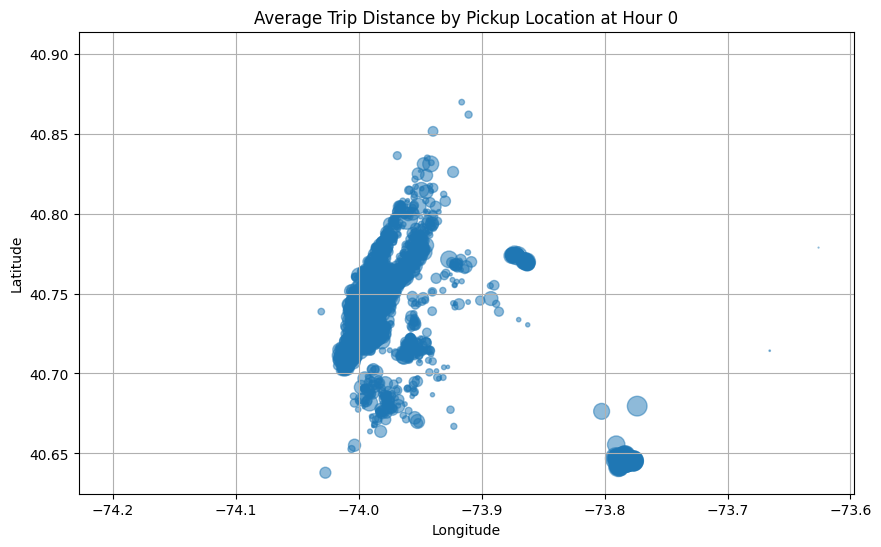

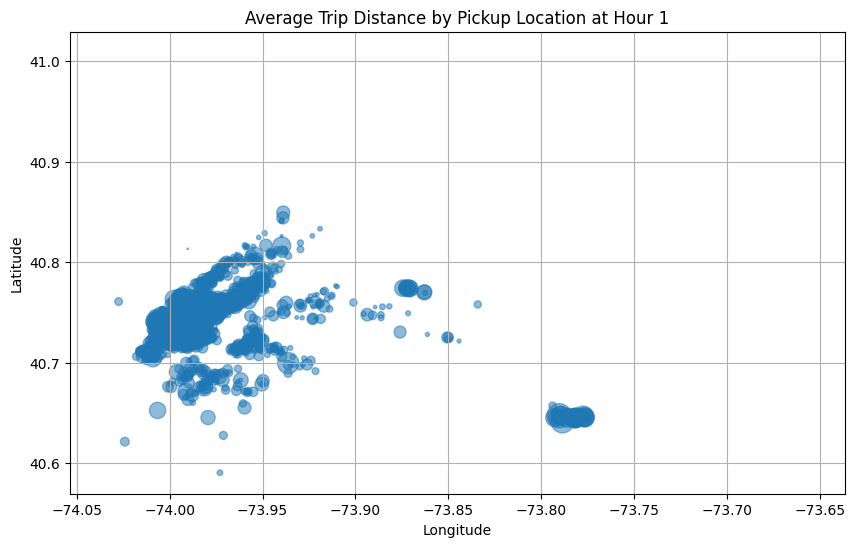

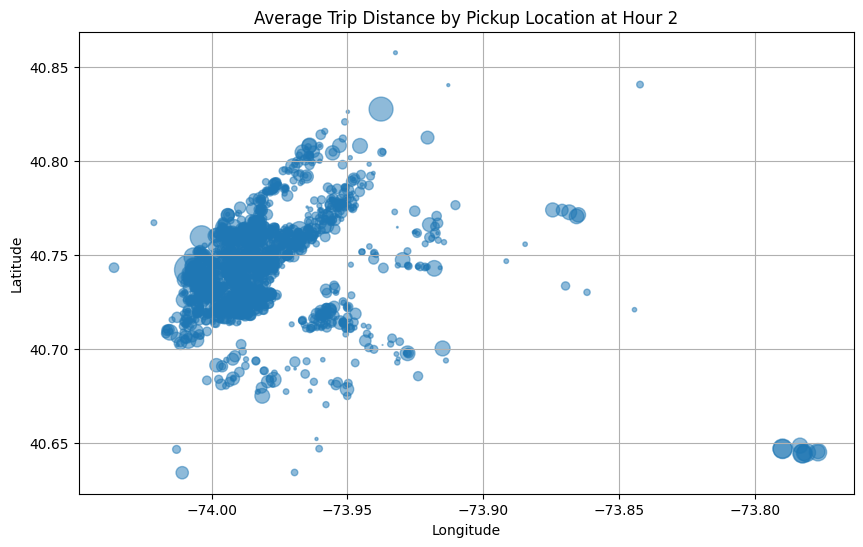

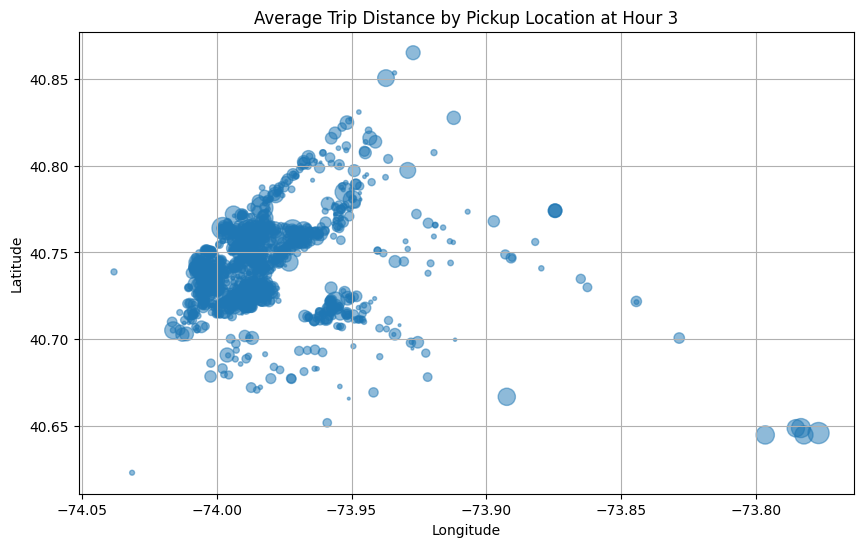

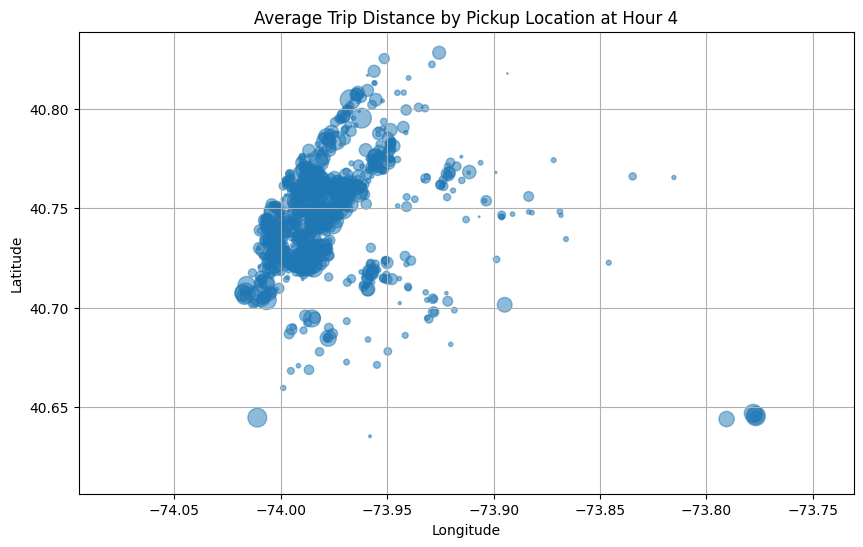

...

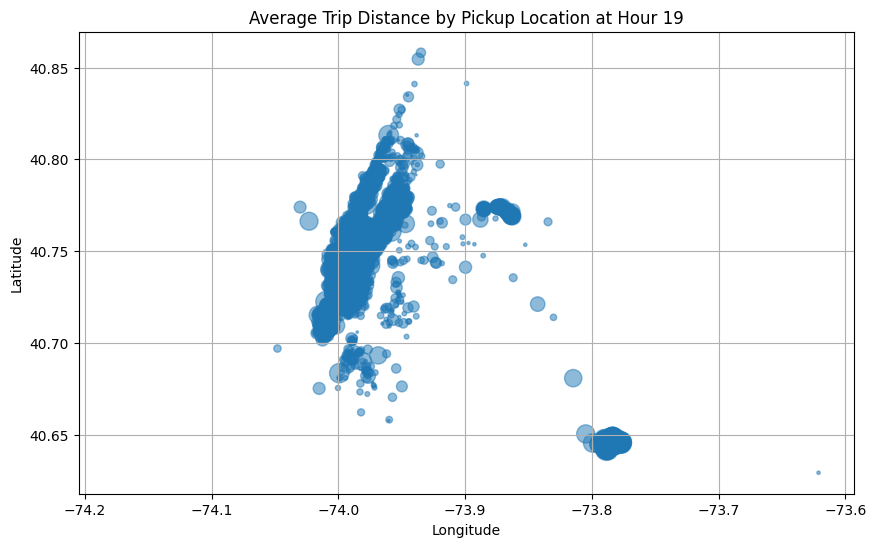

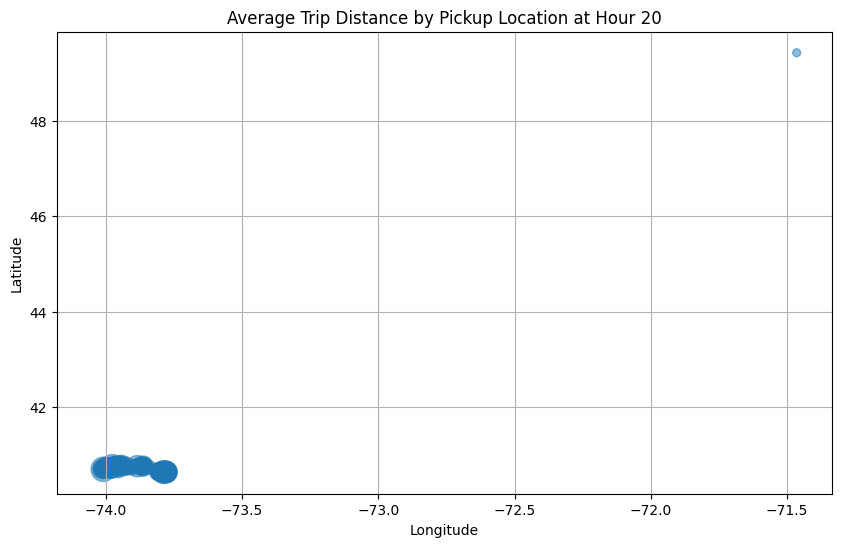

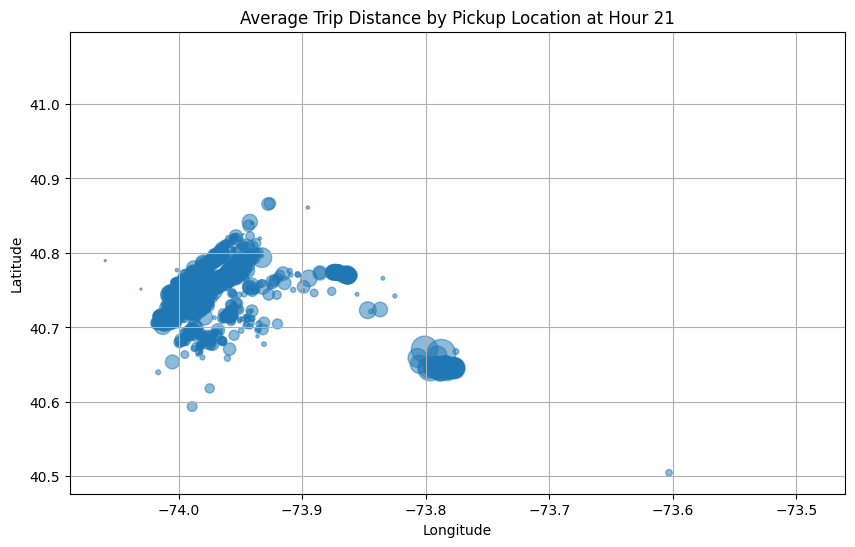

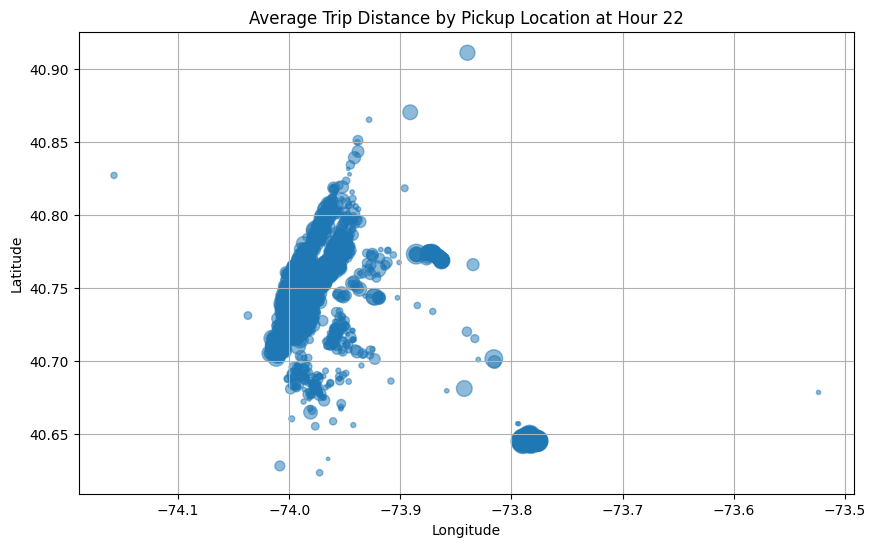

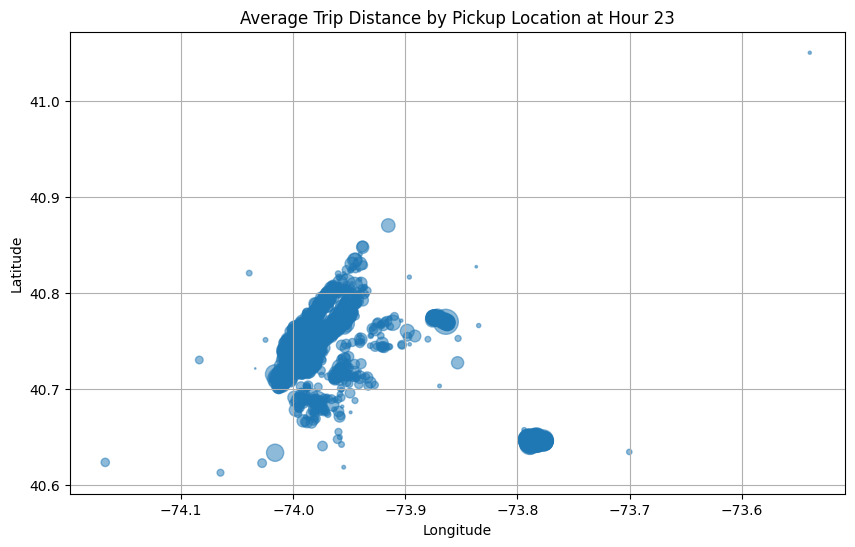

In [ ]:
avg_distance_location_hourly = combined_df.groupBy("pickup_latitude", "pickup_longitude", "pickup_hour").agg(F.avg("trip_distance").alias("avg_distance")).orderBy("pickup_hour")
avg_distance_location_hourly.show()

# Convert to Pandas DataFrame for plotting
avg_distance_location_hourly_pd = avg_distance_location_hourly.toPandas()

for hour in range(24):
    plt.figure(figsize=(10, 6))
    hour_data = avg_distance_location_hourly_pd[avg_distance_location_hourly_pd["pickup_hour"] == hour]
    plt.scatter(hour_data["pickup_longitude"], hour_data["pickup_latitude"], s=hour_data["avg_distance"] * 10, alpha=0.5)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title(f"Average Trip Distance by Pickup Location at Hour {hour}")
    plt.grid(True)
    plt.show()

75.How do fare amounts vary by pickup location and time of day?

+---------------+----------------+-----------+--------+
|pickup_latitude|pickup_longitude|pickup_hour|avg_fare|
+---------------+----------------+-----------+--------+
|      40.732567|      -73.997192|          0|    10.5|
|      40.775402|      -73.982315|          0|     9.5|
|      40.716961|       -73.95649|          0|    10.5|
|      40.764557|       -73.98333|          0|     6.0|
|      40.745518|      -73.980385|          0|     8.5|
|      40.722103|      -73.997444|          0|    10.5|
|      40.726852|      -73.985458|          0|     7.5|
|      40.778172|       -73.94841|          0|    10.5|
|      40.744278|       -73.99604|          0|     4.5|
|       40.73447|      -73.954826|          0|    11.5|
|       40.74596|      -74.007484|          0|     7.5|
|      40.764099|      -73.977455|          0|    35.0|
|      40.718746|      -73.989204|          0|    17.0|
|      40.741131|       -74.00161|          0|    11.5|
|      40.731628|      -74.000961|          0|  

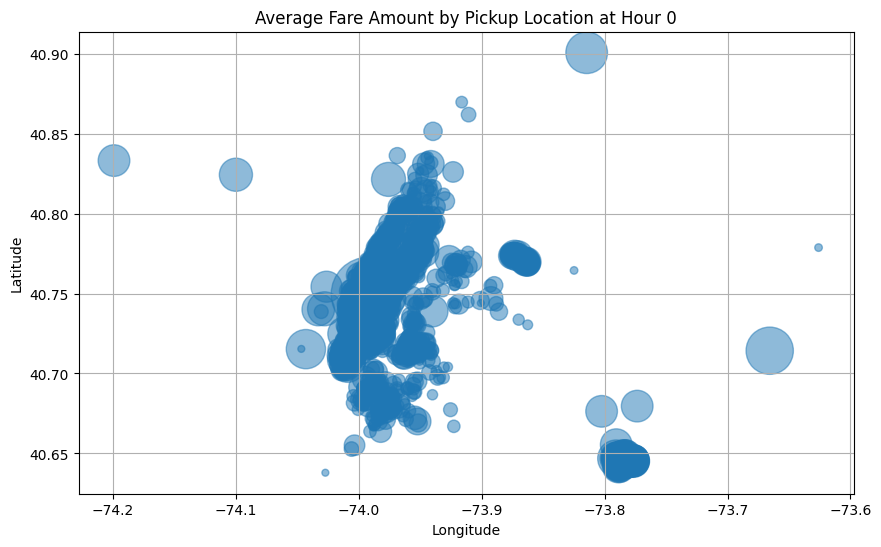

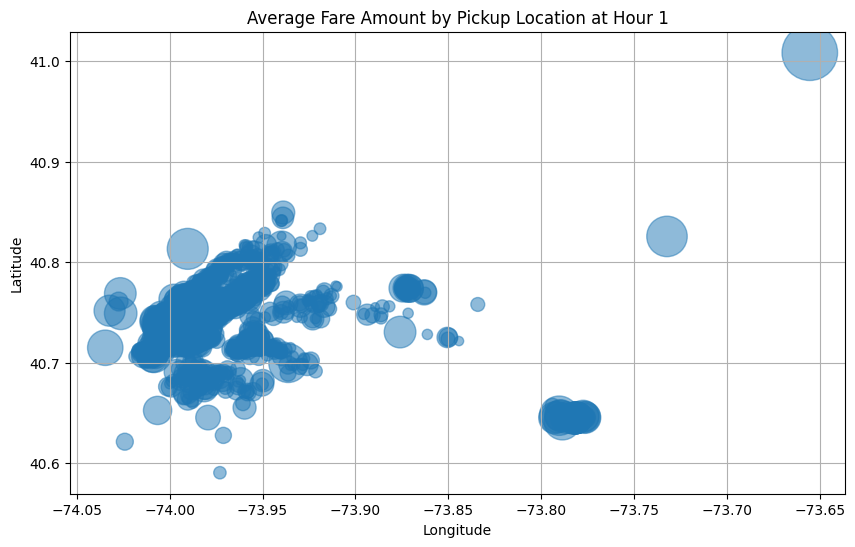

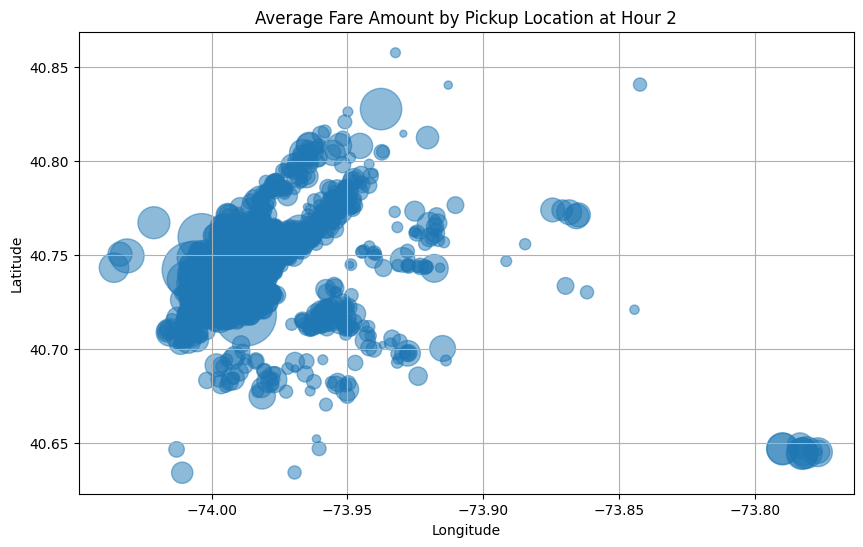

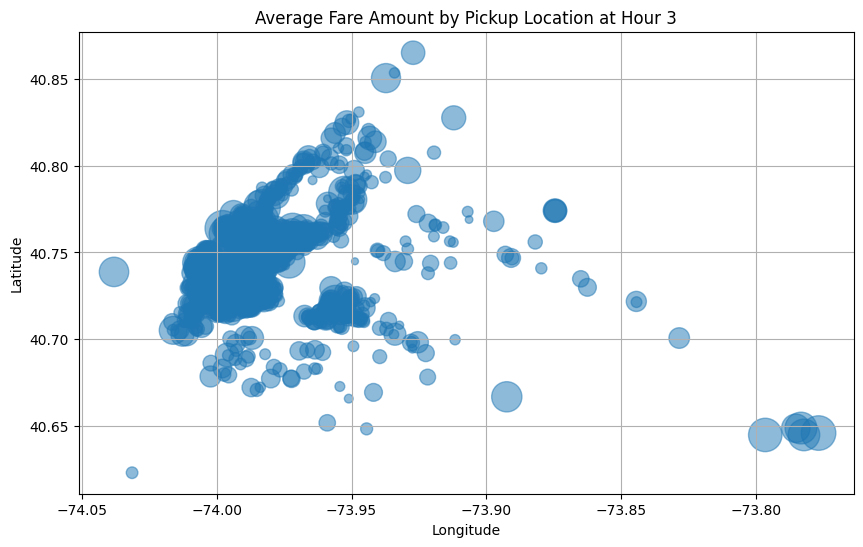

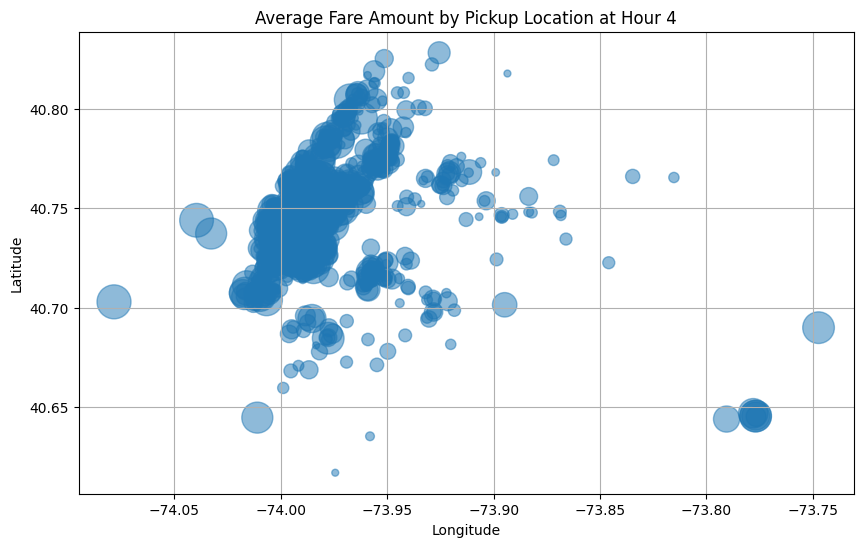

...

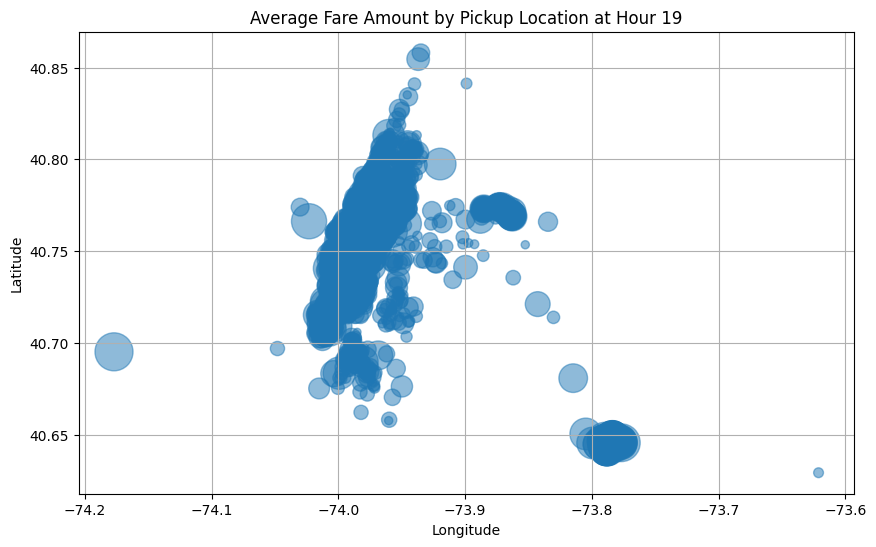

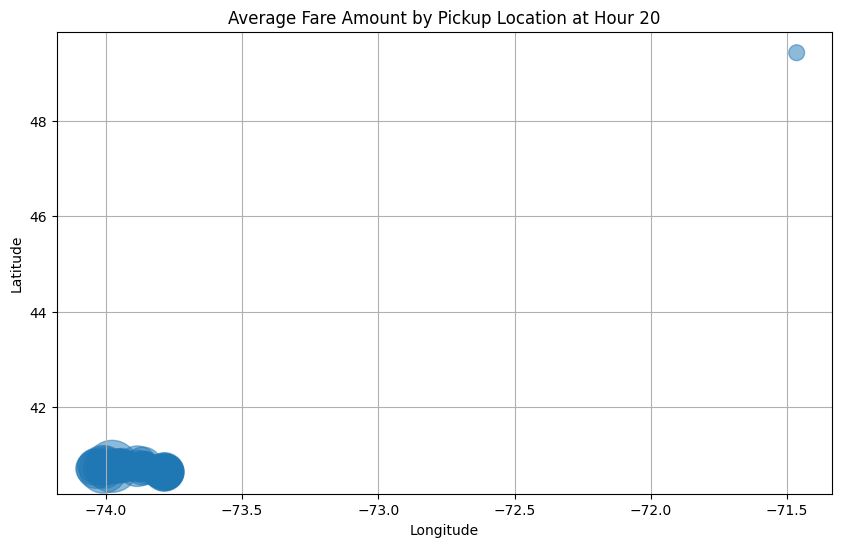

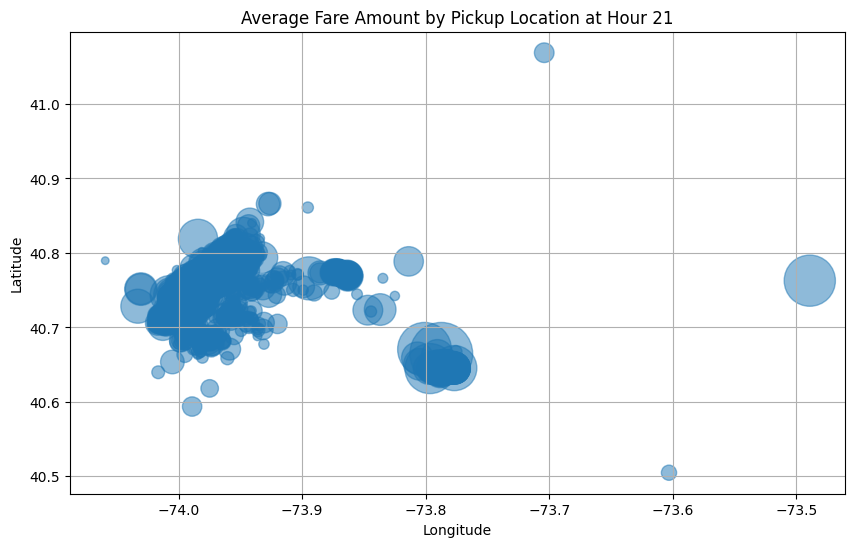

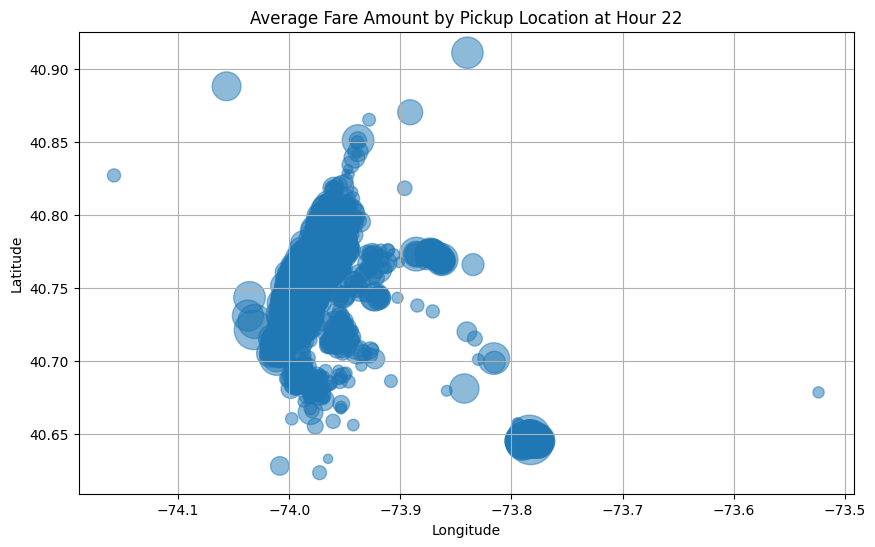

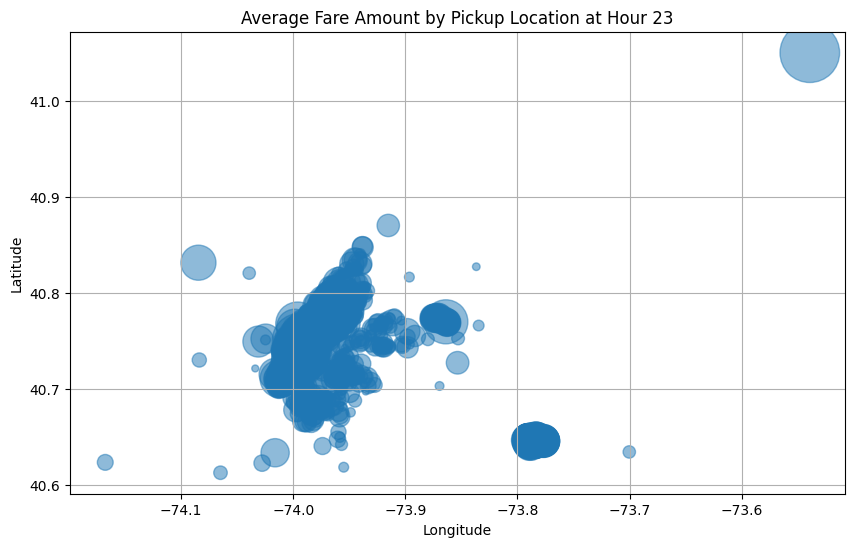

In [ ]:
avg_fare_location_hourly = combined_df.groupBy("pickup_latitude", "pickup_longitude", "pickup_hour").agg(F.avg("fare_amount").alias("avg_fare")).orderBy("pickup_hour")
avg_fare_location_hourly.show()

# Convert to Pandas DataFrame for plotting
avg_fare_location_hourly_pd = avg_fare_location_hourly.toPandas()

for hour in range(24):
    plt.figure(figsize=(10, 6))
    hour_data = avg_fare_location_hourly_pd[avg_fare_location_hourly_pd["pickup_hour"] == hour]
    plt.scatter(hour_data["pickup_longitude"], hour_data["pickup_latitude"], s=hour_data["avg_fare"] * 10, alpha=0.5)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title(f"Average Fare Amount by Pickup Location at Hour {hour}")
    plt.grid(True)
    plt.show()

76.How does the passenger count vary by pickup location and time of day?

+---------------+----------------+-----------+-------------------+
|pickup_latitude|pickup_longitude|pickup_hour|avg_passenger_count|
+---------------+----------------+-----------+-------------------+
|      40.732567|      -73.997192|          0|                1.0|
|      40.775402|      -73.982315|          0|                1.0|
|      40.716961|       -73.95649|          0|                1.0|
|      40.764557|       -73.98333|          0|                1.0|
|      40.745518|      -73.980385|          0|                1.0|
|      40.722103|      -73.997444|          0|                1.0|
|      40.726852|      -73.985458|          0|                2.0|
|      40.778172|       -73.94841|          0|                2.0|
|      40.744278|       -73.99604|          0|                4.0|
|       40.73447|      -73.954826|          0|                1.0|
|       40.74596|      -74.007484|          0|                2.0|
|      40.764099|      -73.977455|          0|                

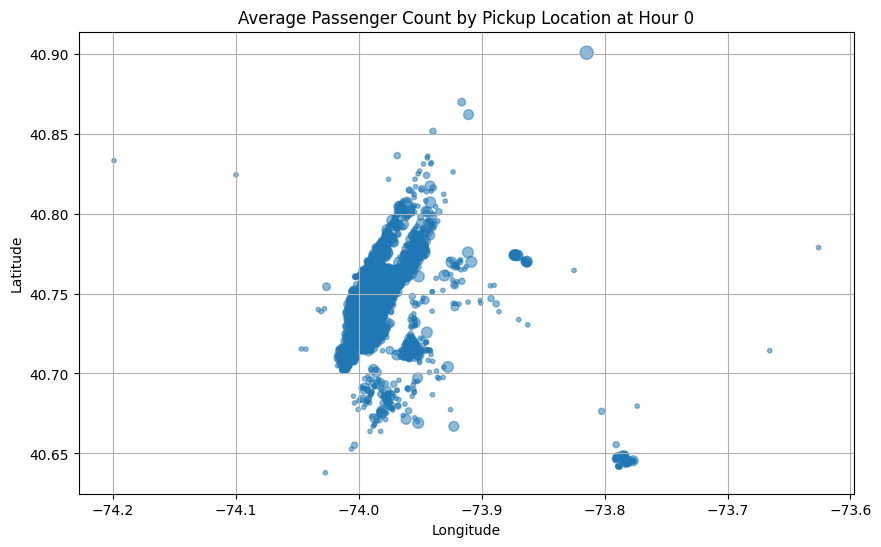

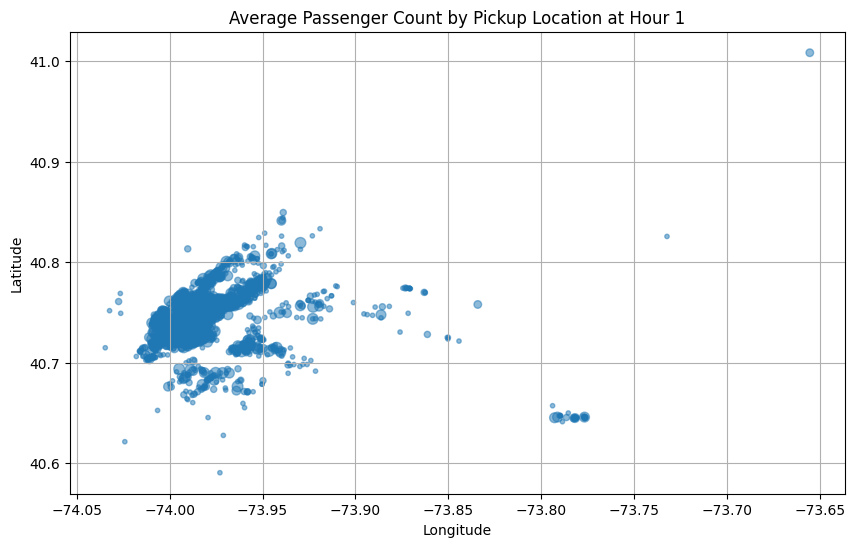

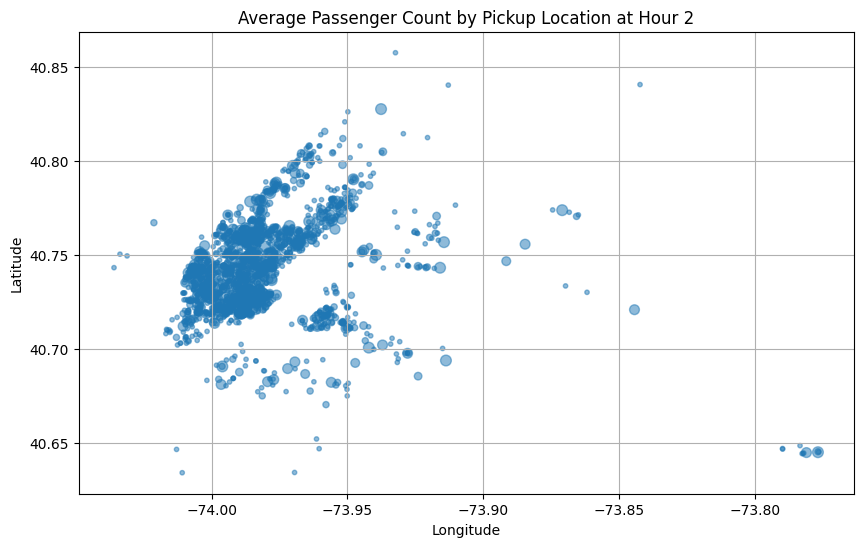

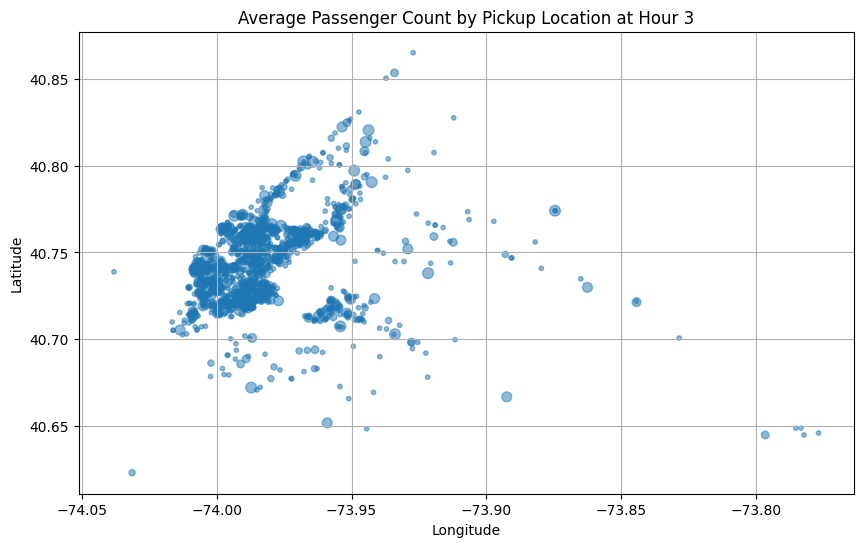

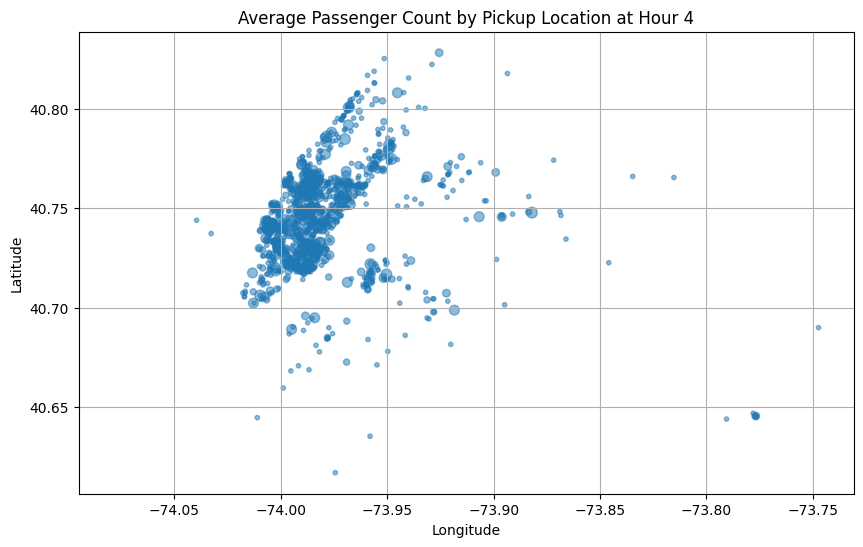

...

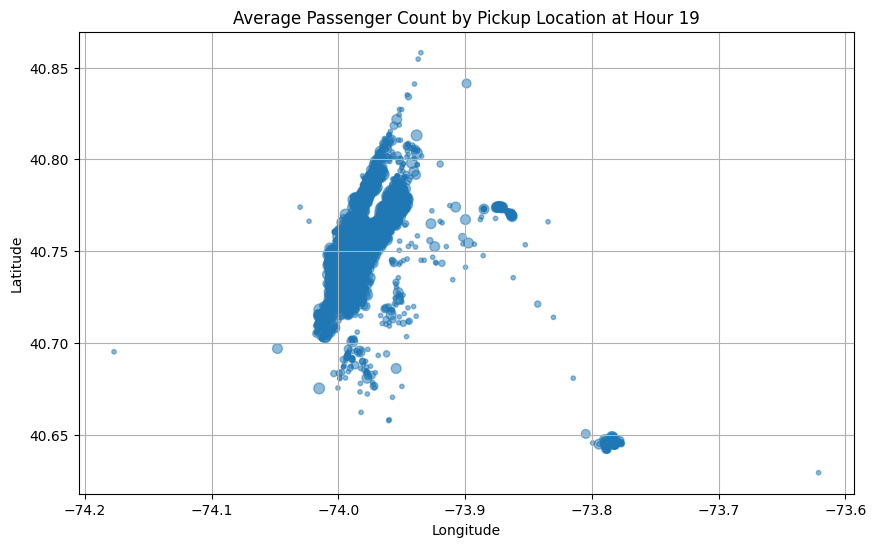

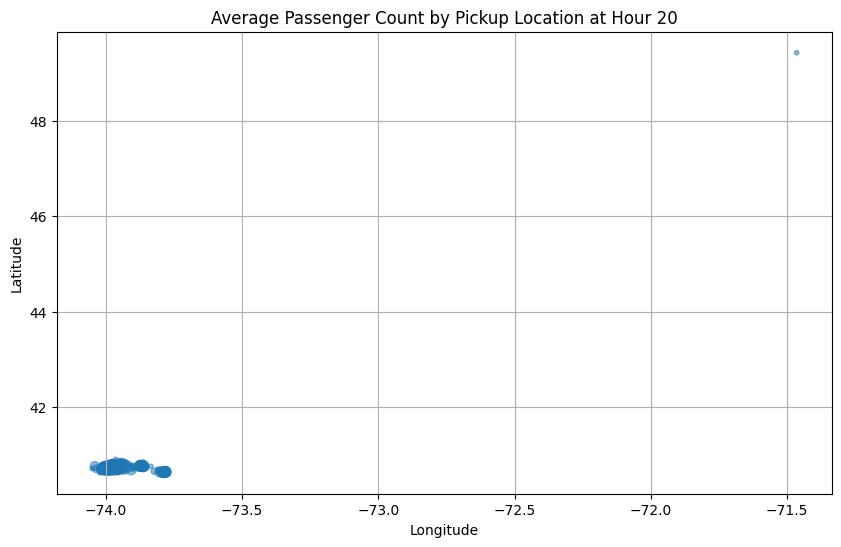

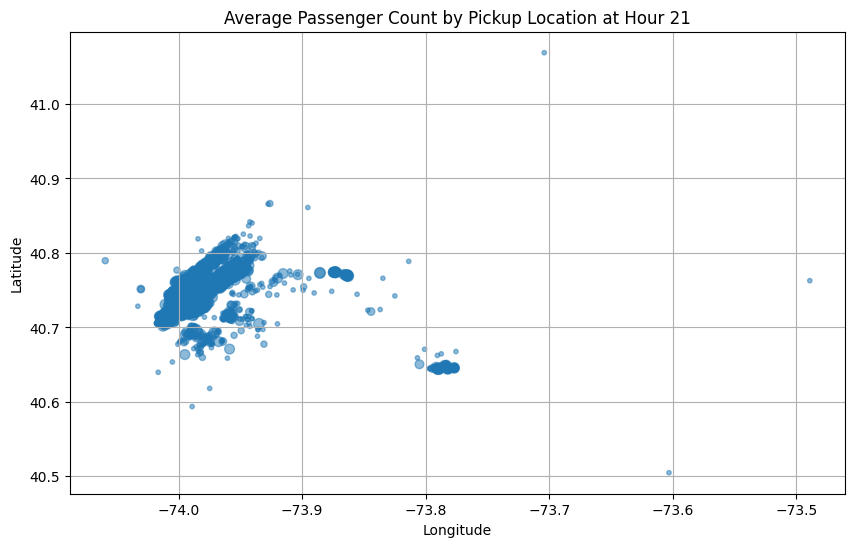

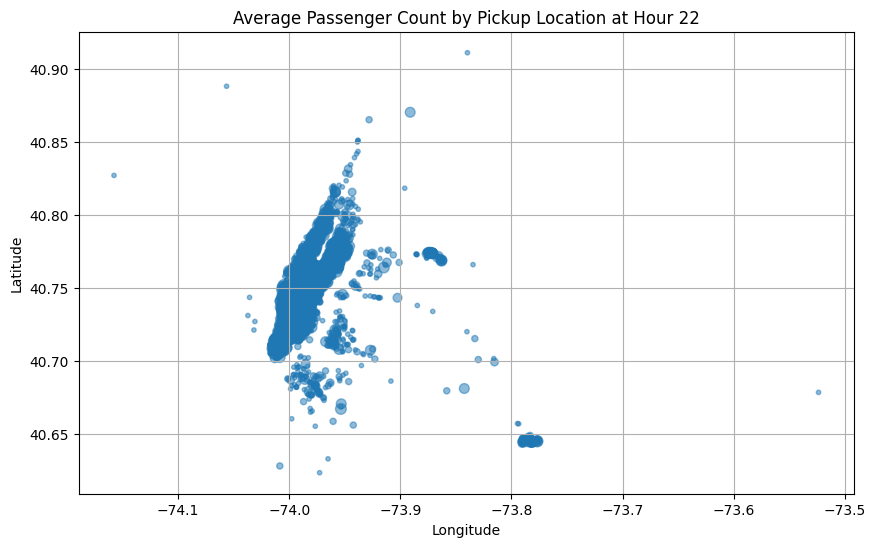

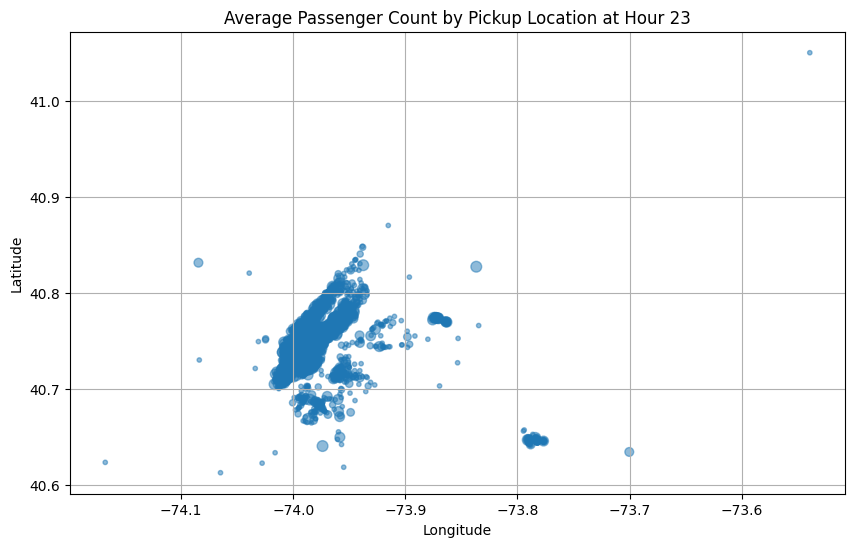

In [ ]:
avg_passenger_location_hourly = combined_df.groupBy("pickup_latitude", "pickup_longitude", "pickup_hour").agg(F.avg("passenger_count").alias("avg_passenger_count")).orderBy("pickup_hour")
avg_passenger_location_hourly.show()

# Convert to Pandas DataFrame for plotting
avg_passenger_location_hourly_pd = avg_passenger_location_hourly.toPandas()

for hour in range(24):
    plt.figure(figsize=(10, 6))
    hour_data = avg_passenger_location_hourly_pd[avg_passenger_location_hourly_pd["pickup_hour"] == hour]
    plt.scatter(hour_data["pickup_longitude"], hour_data["pickup_latitude"], s=hour_data["avg_passenger_count"] * 10, alpha=0.5)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title(f"Average Passenger Count by Pickup Location at Hour {hour}")
    plt.grid(True)
    plt.show()

77.How do trip times vary by pickup location and time of day?

+---------------+----------------+-----------+-------------+
|pickup_latitude|pickup_longitude|pickup_hour|avg_trip_time|
+---------------+----------------+-----------+-------------+
|      40.775402|      -73.982315|          0|        600.0|
|      40.732567|      -73.997192|          0|        624.0|
|      40.730968|      -74.001228|          0|        660.0|
|      40.709473|      -74.006683|          0|       1156.0|
|      40.708069|      -74.003571|          0|        302.0|
|      40.740513|      -73.981255|          0|        687.0|
|      40.711094|      -74.008774|          0|       1200.0|
|      40.680843|      -73.962509|          0|        349.0|
|      40.718906|       -74.00663|          0|        180.0|
|      40.723602|      -73.988152|          0|       1288.0|
|      40.744549|      -73.979385|          0|         60.0|
|        40.7841|      -73.977554|          0|        822.0|
|      40.795681|      -73.943764|          0|        739.0|
|      40.755764|      -

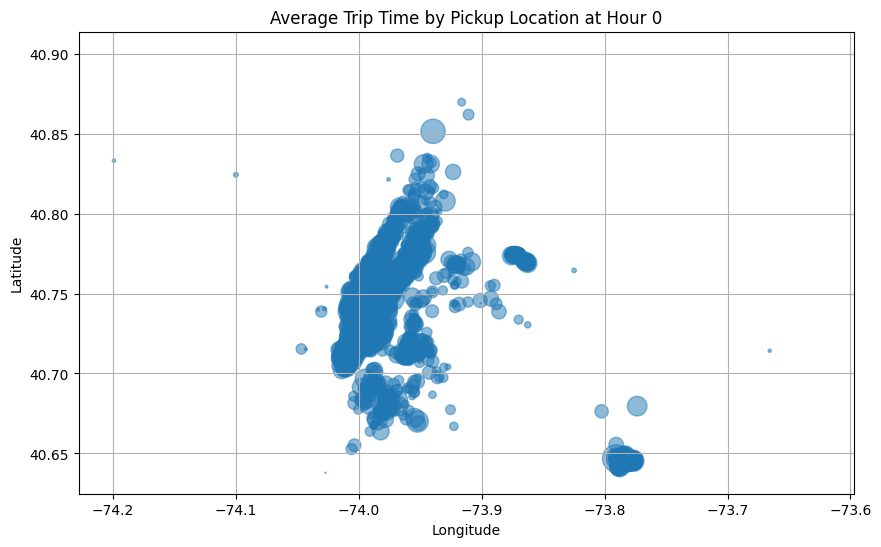

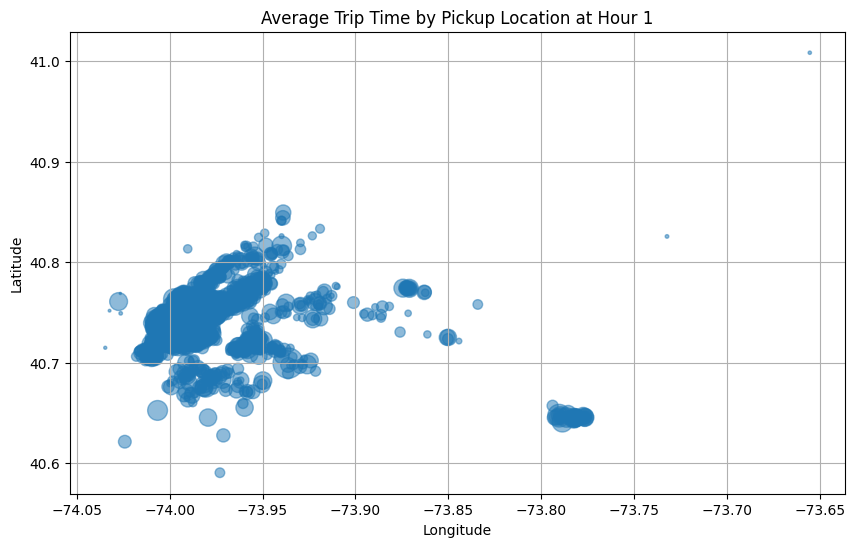

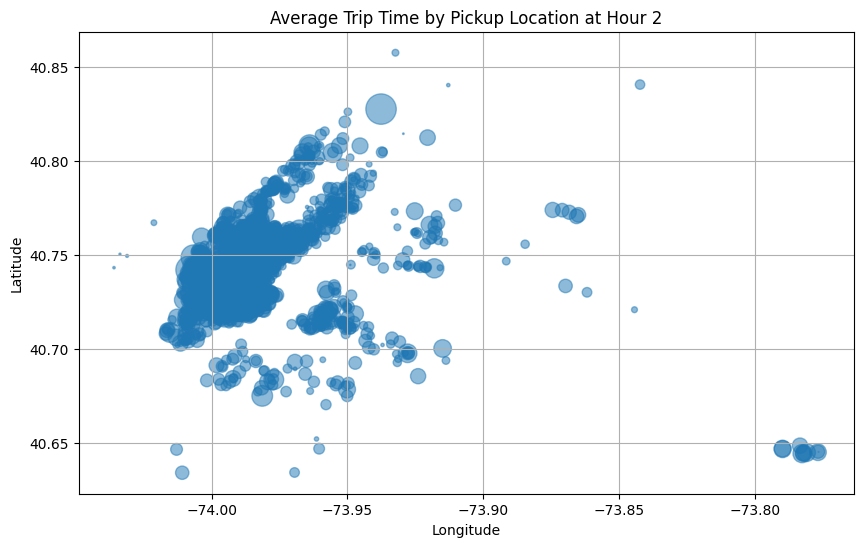

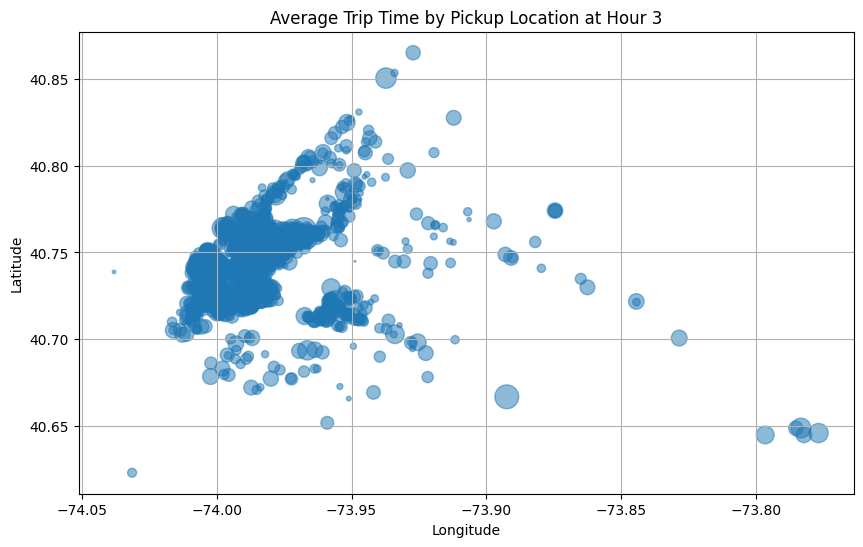

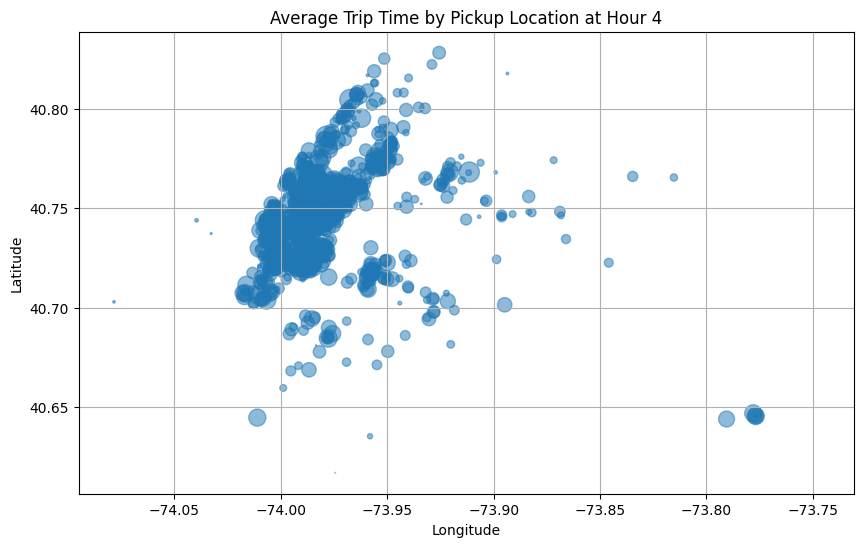

...

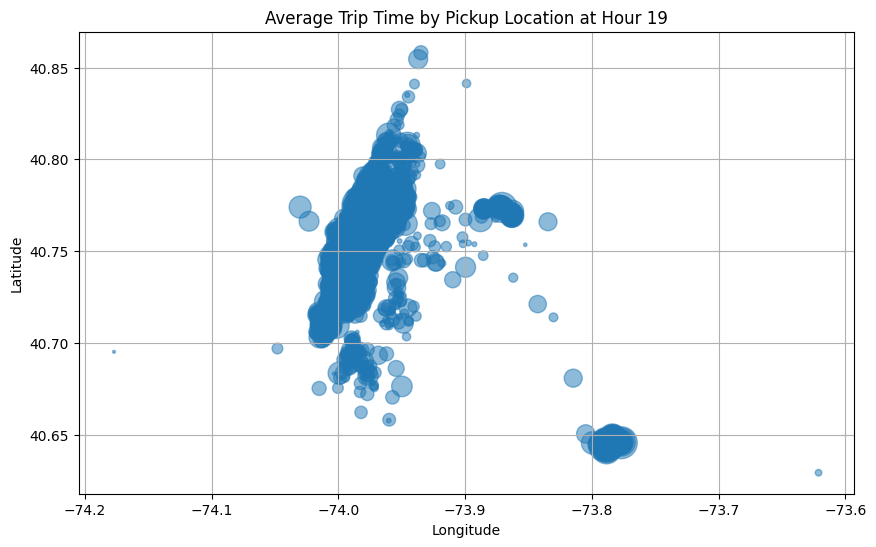

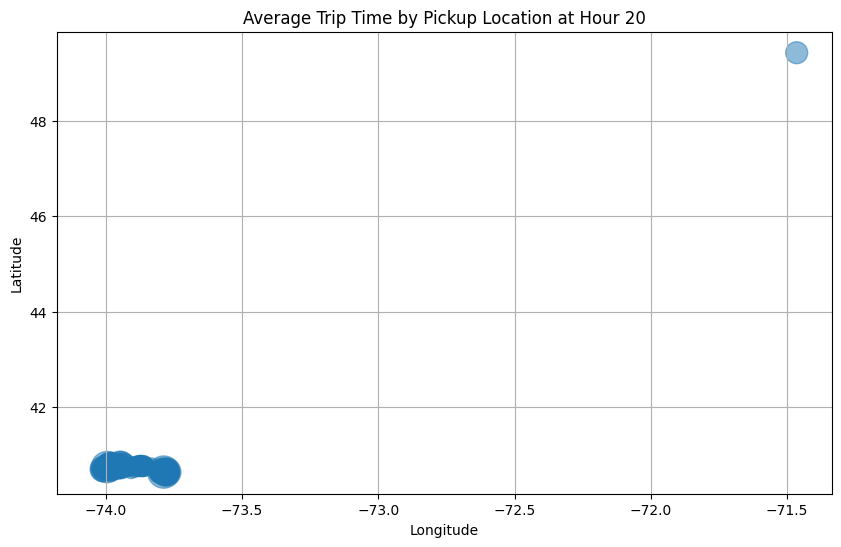

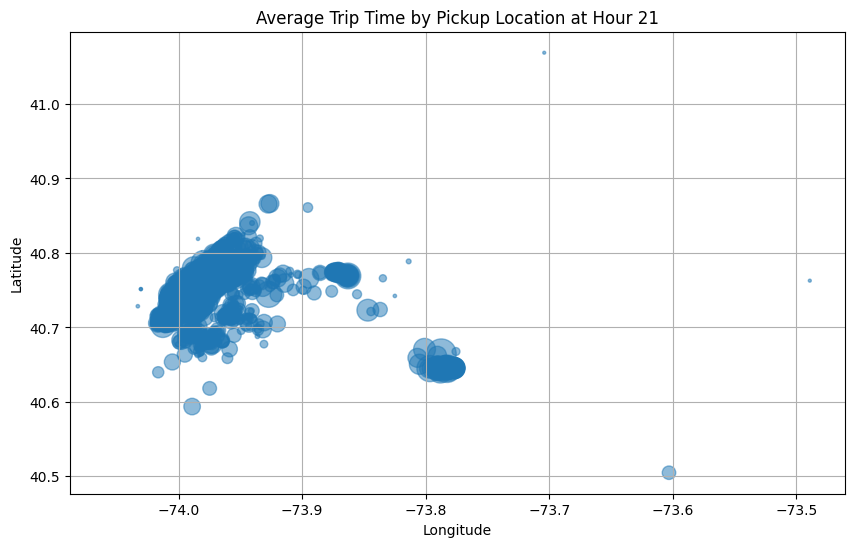

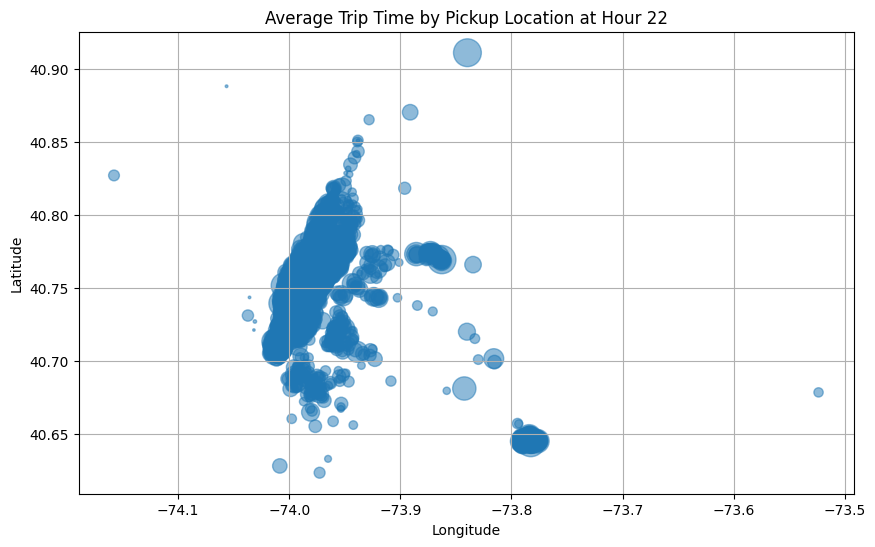

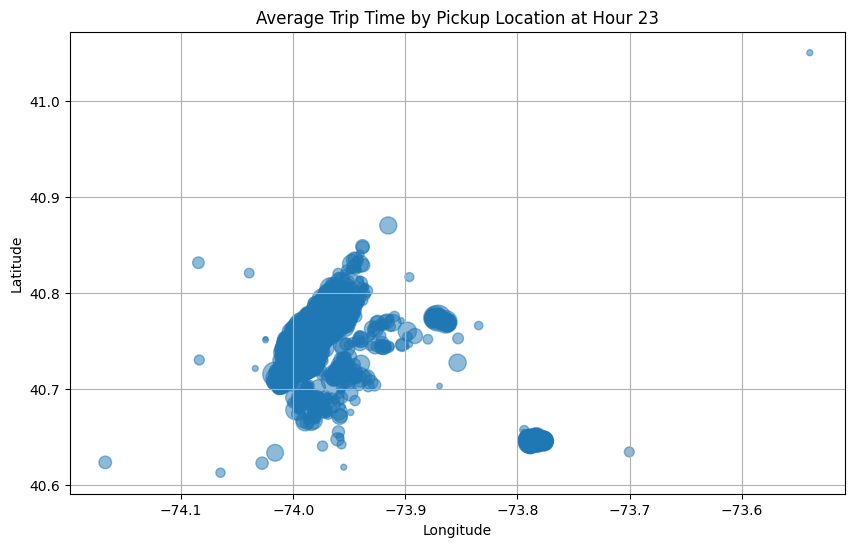

In [ ]:
avg_trip_time_location_hourly = combined_df.groupBy("pickup_latitude", "pickup_longitude", "pickup_hour").agg(F.avg("trip_time_in_secs").alias("avg_trip_time")).orderBy("pickup_hour")
avg_trip_time_location_hourly.show()

# Convert to Pandas DataFrame for plotting
avg_trip_time_location_hourly_pd = avg_trip_time_location_hourly.toPandas()

for hour in range(24):
    plt.figure(figsize=(10, 6))
    hour_data = avg_trip_time_location_hourly_pd[avg_trip_time_location_hourly_pd["pickup_hour"] == hour]
    plt.scatter(hour_data["pickup_longitude"], hour_data["pickup_latitude"], s=hour_data["avg_trip_time"] * 0.1, alpha=0.5)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title(f"Average Trip Time by Pickup Location at Hour {hour}")
    plt.grid(True)
    plt.show()


78.How does the average fare amount vary by hour for each day of the week?

+----------+-----------+------------------+
|pickup_day|pickup_hour|          avg_fare|
+----------+-----------+------------------+
|    Friday|          0|13.518388791593695|
|    Friday|          1|12.776829268292683|
|    Friday|          2|12.270833333333334|
|    Friday|          3|12.946107784431138|
|    Friday|          4|14.324675324675324|
|    Friday|          5|15.762295081967213|
|    Friday|          6|12.899774919614147|
|    Friday|          7| 11.78287197231834|
|    Friday|          8|11.853571428571428|
|    Friday|          9|12.856313497822931|
|    Friday|         10|12.471449487554905|
|    Friday|         11| 12.98176291793313|
|    Friday|         12|12.735249621785174|
|    Friday|         13|13.613976705490849|
|    Friday|         14|13.892053973013493|
|    Friday|         15|14.140522875816993|
|    Friday|         16|13.058695652173913|
|    Friday|         17| 13.83688524590164|
|    Friday|         18|12.789240506329113|
|    Friday|         19|12.48352

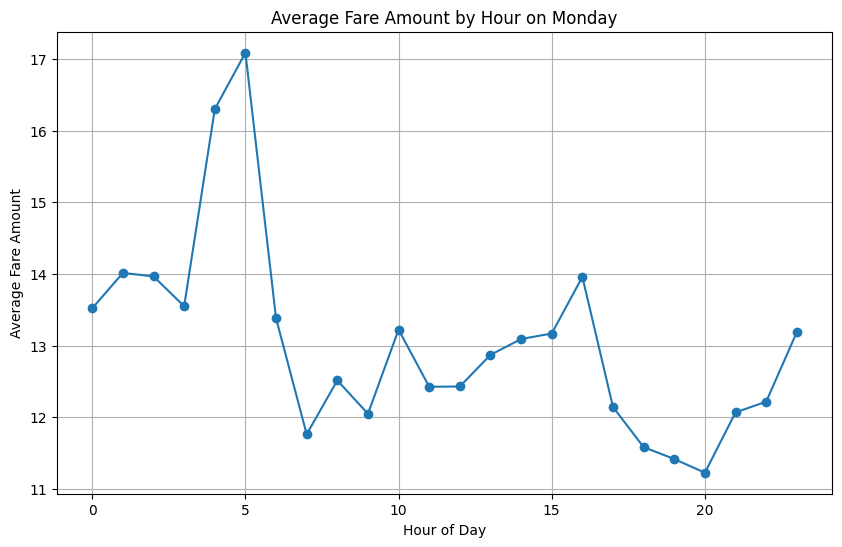

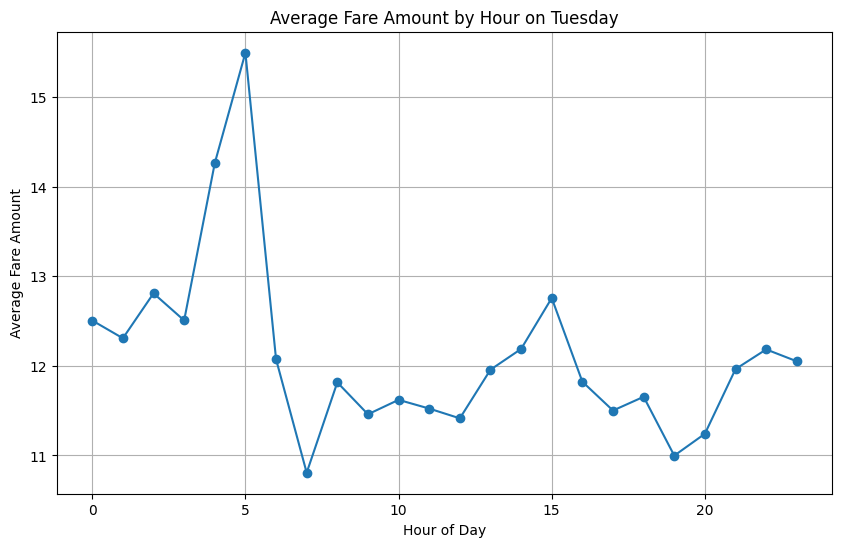

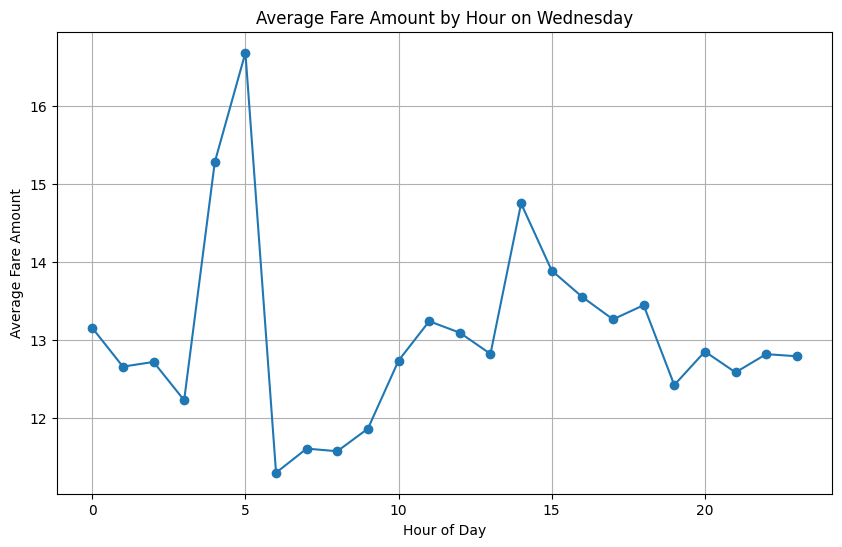

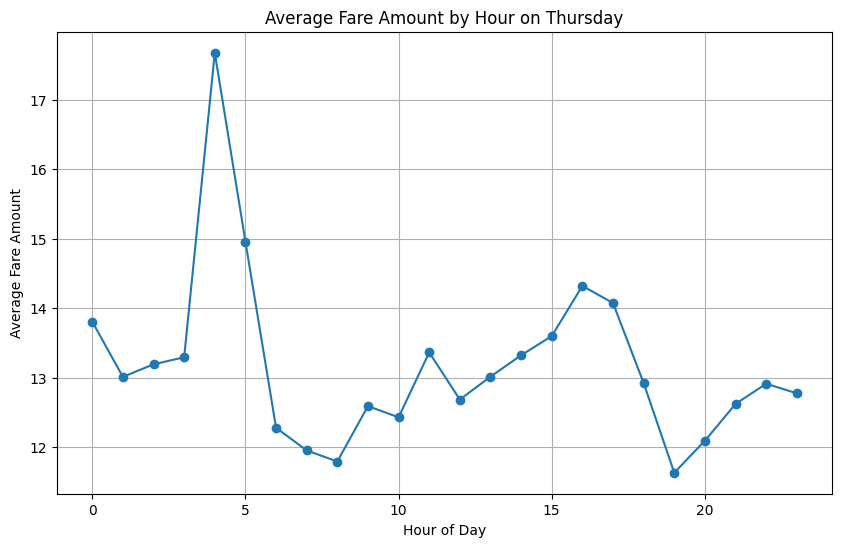

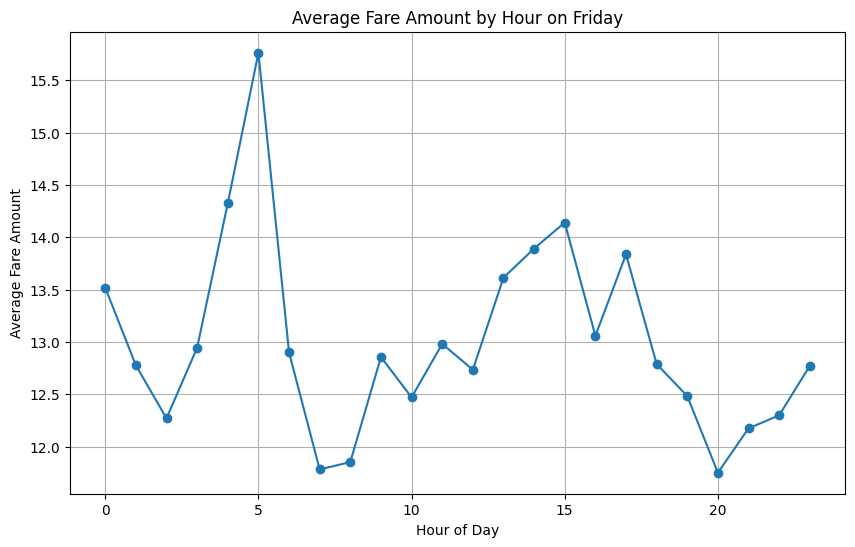

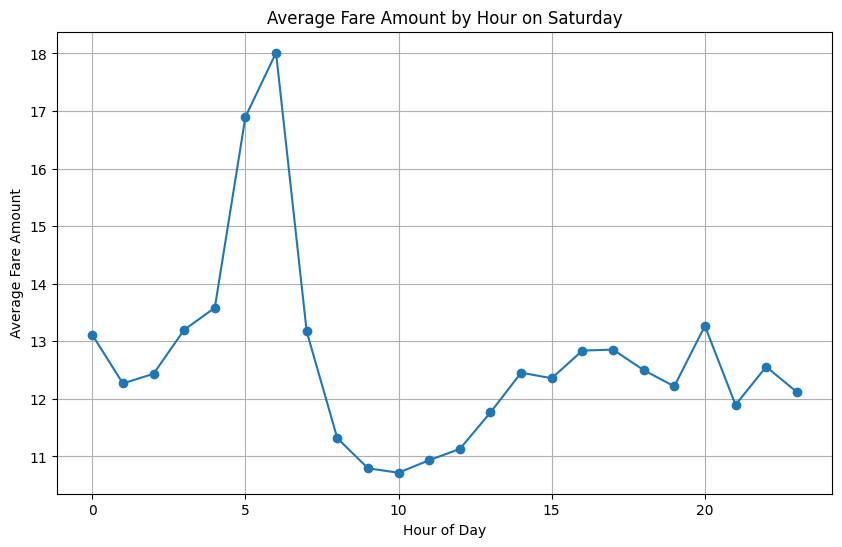

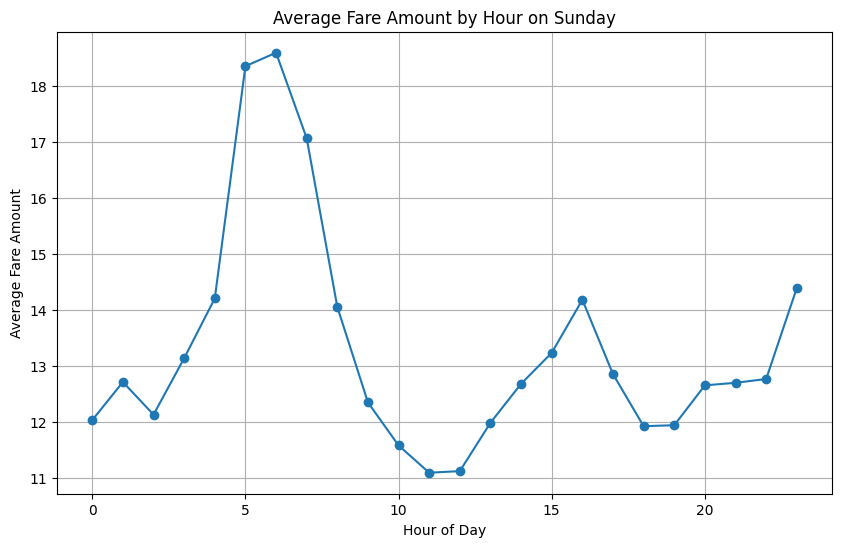

In [ ]:
avg_fare_hourly_daily = combined_df.groupBy("pickup_day", "pickup_hour").agg(F.avg("fare_amount").alias("avg_fare")).orderBy("pickup_day", "pickup_hour")
avg_fare_hourly_daily.show()

# Convert to Pandas DataFrame for plotting
avg_fare_hourly_daily_pd = avg_fare_hourly_daily.toPandas()

days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

for day in days:
    plt.figure(figsize=(10, 6))
    day_data = avg_fare_hourly_daily_pd[avg_fare_hourly_daily_pd["pickup_day"] == day]
    plt.plot(day_data["pickup_hour"], day_data["avg_fare"], marker='o', label=day)
    plt.xlabel("Hour of Day")
    plt.ylabel("Average Fare Amount")
    plt.title(f"Average Fare Amount by Hour on {day}")
    plt.grid(True)
    plt.show()

79.How does the average trip distance vary by hour for each day of the week?

+----------+-----------+------------------+
|pickup_day|pickup_hour|      avg_distance|
+----------+-----------+------------------+
|    Friday|          0| 3.493905429071804|
|    Friday|          1|3.2223658536585367|
|    Friday|          2|3.2476388888888885|
|    Friday|          3|3.5682035928143705|
|    Friday|          4|3.9038311688311684|
|    Friday|          5| 4.809508196721313|
|    Friday|          6|3.5283601286173645|
|    Friday|          7|  2.80114186851211|
|    Friday|          8| 2.581642857142858|
|    Friday|          9|2.7063860667634256|
|    Friday|         10|2.6966032210834543|
|    Friday|         11|2.5688449848024333|
|    Friday|         12|2.5551134644478064|
|    Friday|         13| 2.987337770382696|
|    Friday|         14|2.8829685157421285|
|    Friday|         15| 3.173186274509806|
|    Friday|         16| 2.830565217391303|
|    Friday|         17|2.9801475409836056|
|    Friday|         18| 2.734443037974686|
|    Friday|         19| 2.70305

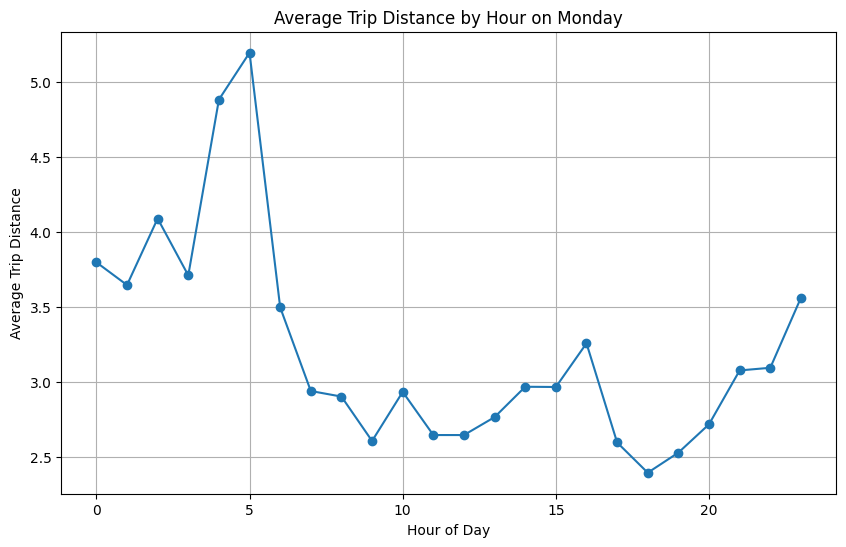

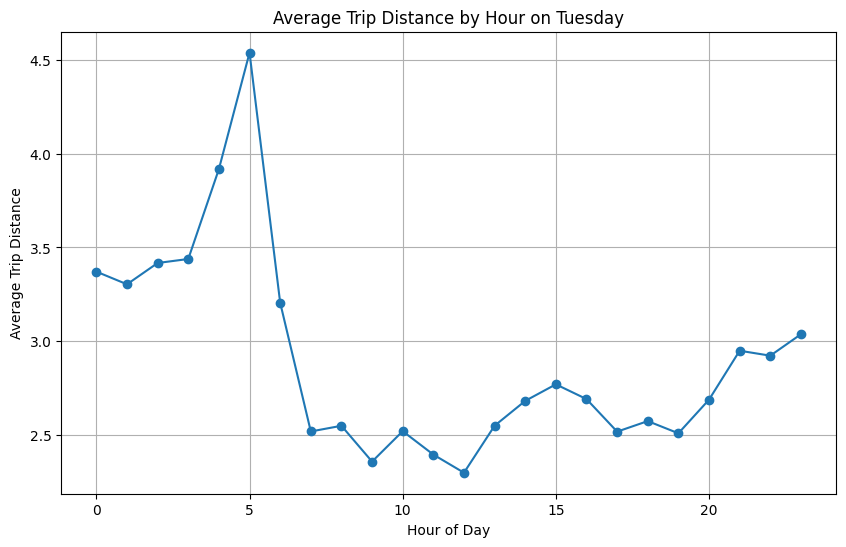

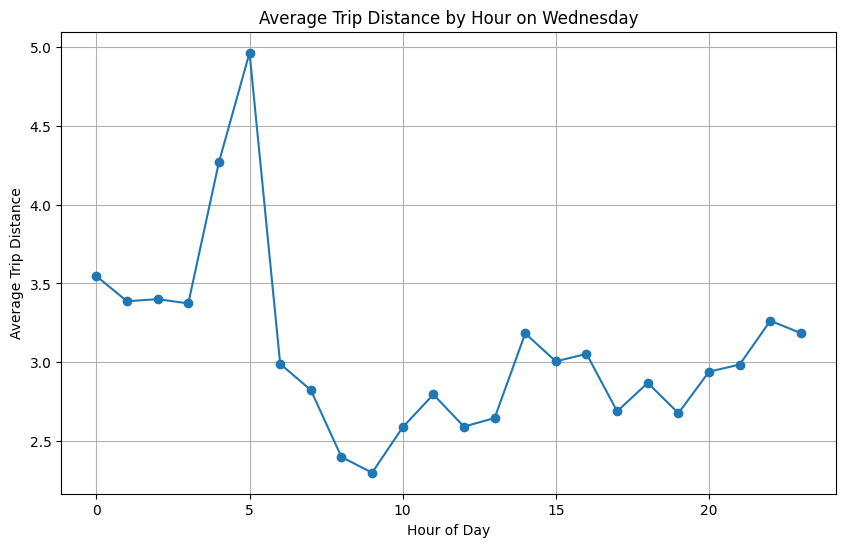

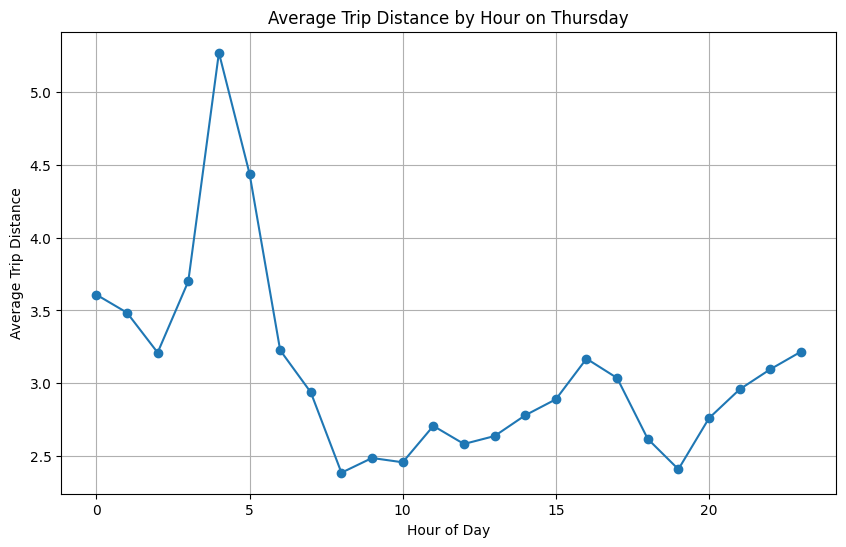

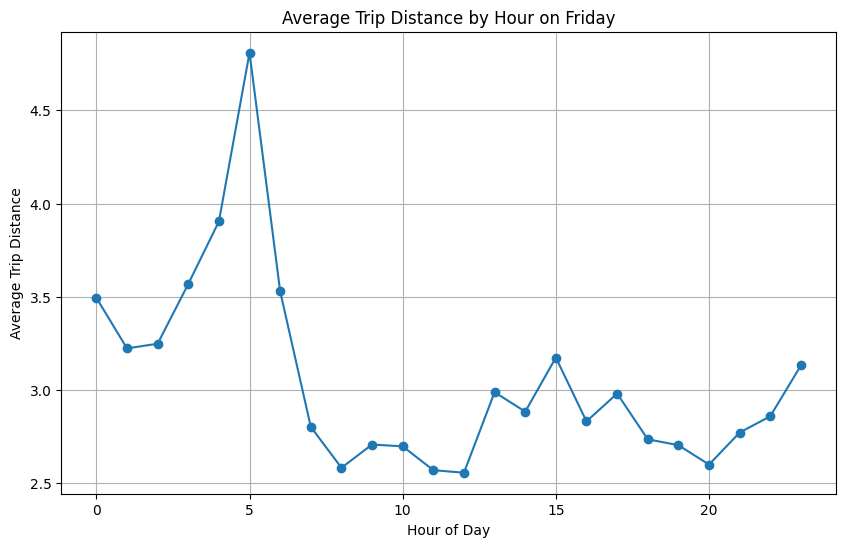

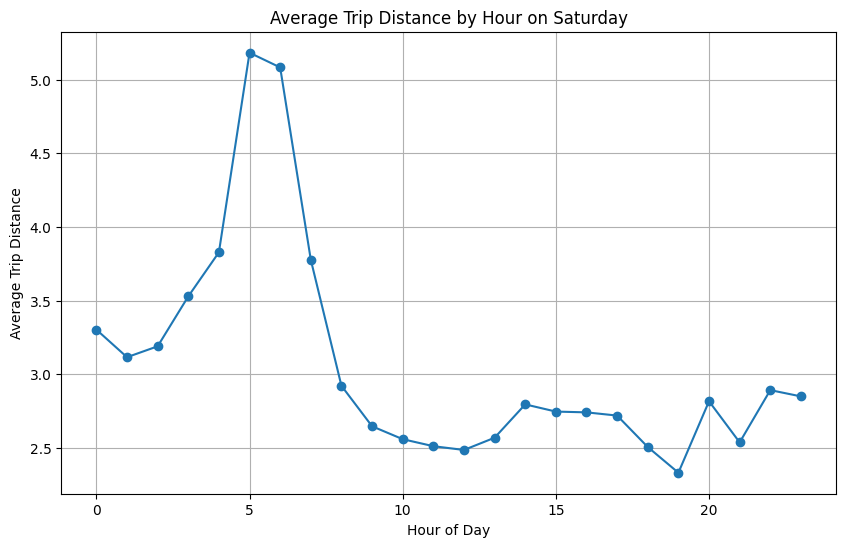

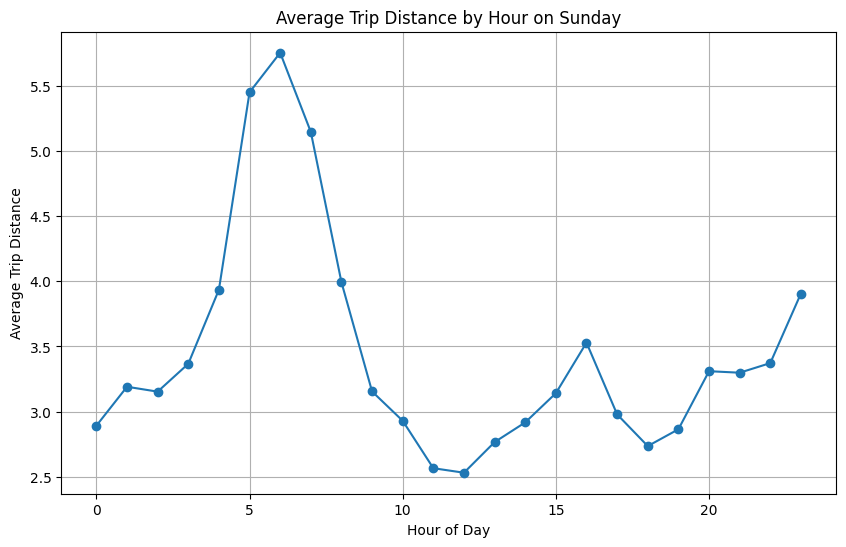

In [ ]:
avg_distance_hourly_daily = combined_df.groupBy("pickup_day", "pickup_hour").agg(F.avg("trip_distance").alias("avg_distance")).orderBy("pickup_day", "pickup_hour")
avg_distance_hourly_daily.show()

# Convert to Pandas DataFrame for plotting
avg_distance_hourly_daily_pd = avg_distance_hourly_daily.toPandas()

days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

for day in days:
    plt.figure(figsize=(10, 6))
    day_data = avg_distance_hourly_daily_pd[avg_distance_hourly_daily_pd["pickup_day"] == day]
    plt.plot(day_data["pickup_hour"], day_data["avg_distance"], marker='o', label=day)
    plt.xlabel("Hour of Day")
    plt.ylabel("Average Trip Distance")
    plt.title(f"Average Trip Distance by Hour on {day}")
    plt.grid(True)
    plt.show()

80.What is the trend in average fare amounts over time?

+-----------+------------------+
|pickup_date|          avg_fare|
+-----------+------------------+
| 2013-12-01|13.245601004664513|
| 2013-12-02| 13.25195644777135|
| 2013-12-03|12.558589824120604|
| 2013-12-04| 13.15378787878788|
| 2013-12-05|12.795952782462058|
| 2013-12-06|12.915757253127495|
| 2013-12-07|12.033411033411033|
| 2013-12-08|12.629809062410944|
| 2013-12-09|12.393720565149136|
| 2013-12-10|12.056351550960118|
| 2013-12-11|13.231529209621993|
| 2013-12-12|13.264010137989299|
| 2013-12-13|12.830497382198953|
| 2013-12-14|11.994195243362832|
| 2013-12-15|12.374582954200788|
| 2013-12-16|12.551825396825397|
| 2013-12-17|12.122215794041075|
| 2013-12-18|12.651032702237522|
| 2013-12-19|13.285243553008597|
| 2013-12-20|12.868614522156967|
+-----------+------------------+
only showing top 20 rows



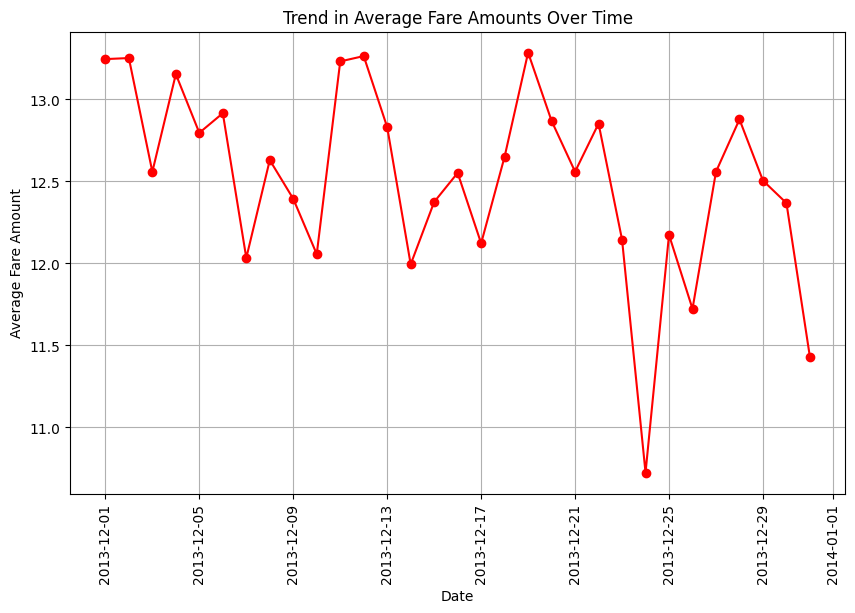

In [ ]:
avg_fare_trend = combined_df.groupBy("pickup_date").agg(F.avg("fare_amount").alias("avg_fare")).orderBy("pickup_date")
avg_fare_trend.show()

# Convert to Pandas DataFrame for plotting
avg_fare_trend_pd = avg_fare_trend.toPandas()

plt.figure(figsize=(10, 6))
plt.plot(avg_fare_trend_pd["pickup_date"], avg_fare_trend_pd["avg_fare"], marker='o', color='red')
plt.xlabel("Date")
plt.ylabel("Average Fare Amount")
plt.title("Trend in Average Fare Amounts Over Time")
plt.xticks(rotation = 90)
plt.grid(True)
plt.show()


81.What is the trend in total fare amounts over time?

+-----------+----------+
|pickup_date|total_fare|
+-----------+----------+
| 2013-12-01|  36915.49|
| 2013-12-02|   38947.5|
| 2013-12-03|  39986.55|
| 2013-12-04|   43407.5|
| 2013-12-05|   45528.0|
| 2013-12-06|   48524.5|
| 2013-12-07|   46461.0|
| 2013-12-08|   44318.0|
| 2013-12-09|   39474.0|
| 2013-12-10|  40810.75|
| 2013-12-11|   46204.5|
| 2013-12-12|   47100.5|
| 2013-12-13|   49012.5|
| 2013-12-14|  43371.01|
| 2013-12-15|   40799.0|
| 2013-12-16|  39538.25|
| 2013-12-17|   41906.5|
| 2013-12-18|   44101.5|
| 2013-12-19|   46365.5|
| 2013-12-20|  48205.83|
+-----------+----------+
only showing top 20 rows



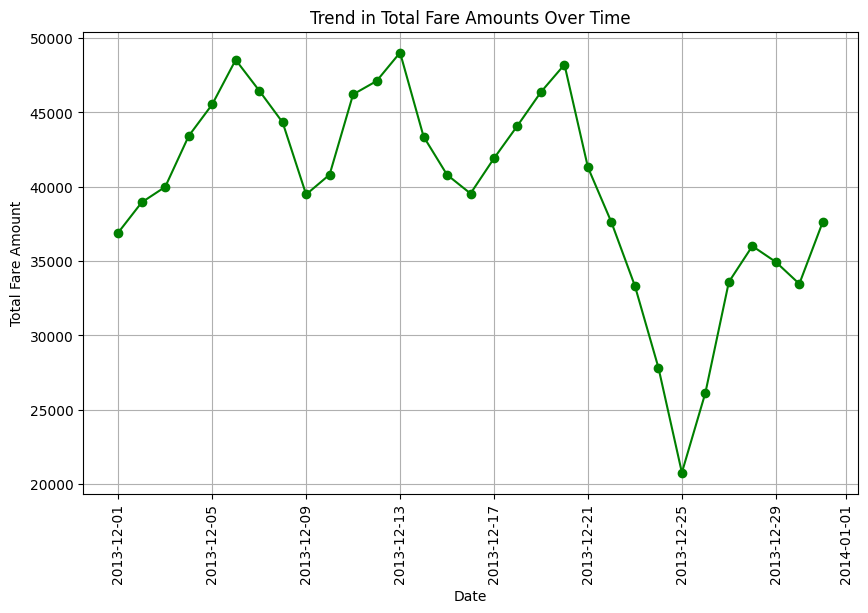

In [ ]:
total_fare_trend = combined_df.groupBy("pickup_date").agg(F.sum("fare_amount").alias("total_fare")).orderBy("pickup_date")
total_fare_trend.show()

# Convert to Pandas DataFrame for plotting
total_fare_trend_pd = total_fare_trend.toPandas()

plt.figure(figsize=(10, 6))
plt.plot(total_fare_trend_pd["pickup_date"], total_fare_trend_pd["total_fare"], marker='o', color='green')
plt.xlabel("Date")
plt.ylabel("Total Fare Amount")
plt.title("Trend in Total Fare Amounts Over Time")
plt.xticks(rotation = 90)
plt.grid(True)
plt.show()

82.How can fare amounts be forecasted using ARIMA?

+-----------+------------------+
|pickup_date|          avg_fare|
+-----------+------------------+
| 2013-12-01|13.245601004664513|
| 2013-12-02| 13.25195644777135|
| 2013-12-03|12.558589824120604|
| 2013-12-04| 13.15378787878788|
| 2013-12-05|12.795952782462058|
| 2013-12-06|12.915757253127495|
| 2013-12-07|12.033411033411033|
| 2013-12-08|12.629809062410944|
| 2013-12-09|12.393720565149136|
| 2013-12-10|12.056351550960118|
| 2013-12-11|13.231529209621993|
| 2013-12-12|13.264010137989299|
| 2013-12-13|12.830497382198953|
| 2013-12-14|11.994195243362832|
| 2013-12-15|12.374582954200788|
| 2013-12-16|12.551825396825397|
| 2013-12-17|12.122215794041075|
| 2013-12-18|12.651032702237522|
| 2013-12-19|13.285243553008597|
| 2013-12-20|12.868614522156967|
+-----------+------------------+
only showing top 20 rows



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


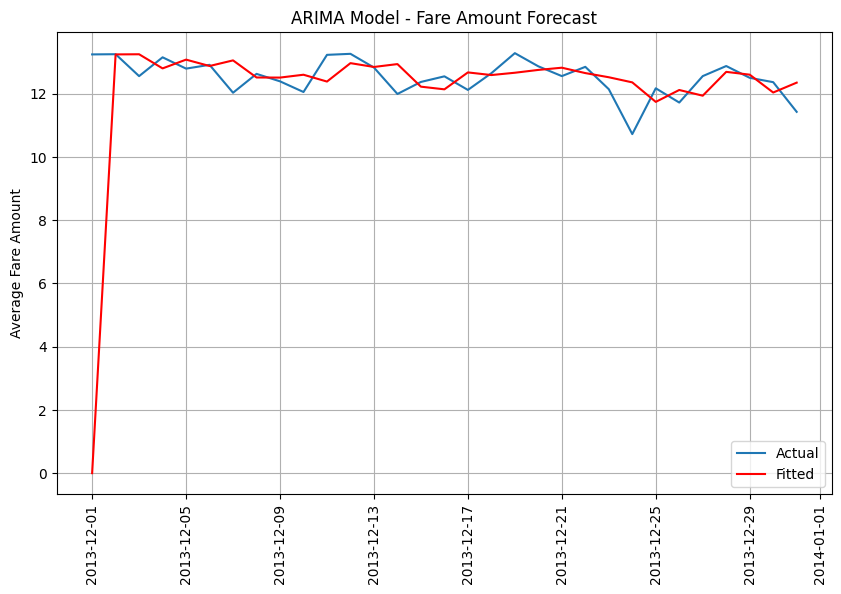

In [ ]:
from statsmodels.tsa.arima.model import ARIMA

avg_fare_daily = combined_df.groupBy("pickup_date").agg(F.avg("fare_amount").alias("avg_fare")).orderBy("pickup_date")
avg_fare_daily.show()
avg_fare_daily_pd = avg_fare_daily.toPandas()
avg_fare_daily_pd.set_index("pickup_date", inplace=True)

model = ARIMA(avg_fare_daily_pd["avg_fare"], order=(5,1,0))
model_fit = model.fit()

plt.figure(figsize=(10, 6))
plt.plot(avg_fare_daily_pd["avg_fare"], label="Actual")
plt.plot(model_fit.fittedvalues, color='red', label="Fitted")
plt.title("ARIMA Model - Fare Amount Forecast")
plt.ylabel("Average Fare Amount")
plt.xticks(rotation = 90)
plt.legend()
plt.grid(True)
plt.show()

83.How can trip distances be forecasted using ARIMA?

+-----------+------------------+
|pickup_date|      avg_distance|
+-----------+------------------+
| 2013-12-01| 3.406813778256191|
| 2013-12-02| 3.249251446070089|
| 2013-12-03|2.8610144472361805|
| 2013-12-04| 2.964072727272726|
| 2013-12-05| 2.852338392355258|
| 2013-12-06| 2.875003992547243|
| 2013-12-07|2.7181196581196603|
| 2013-12-08| 3.072277001994871|
| 2013-12-09|2.9145149136577695|
| 2013-12-10|2.7607917282127015|
| 2013-12-11|2.8463258877434163|
| 2013-12-12| 2.844646578428608|
| 2013-12-13| 2.845141361256548|
| 2013-12-14|2.7734264380530997|
| 2013-12-15|3.1424840764331234|
| 2013-12-16| 2.859736507936507|
| 2013-12-17|2.6701995950245845|
| 2013-12-18|2.8129345955249545|
| 2013-12-19| 2.994885386819483|
| 2013-12-20| 2.911639081687129|
+-----------+------------------+
only showing top 20 rows



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


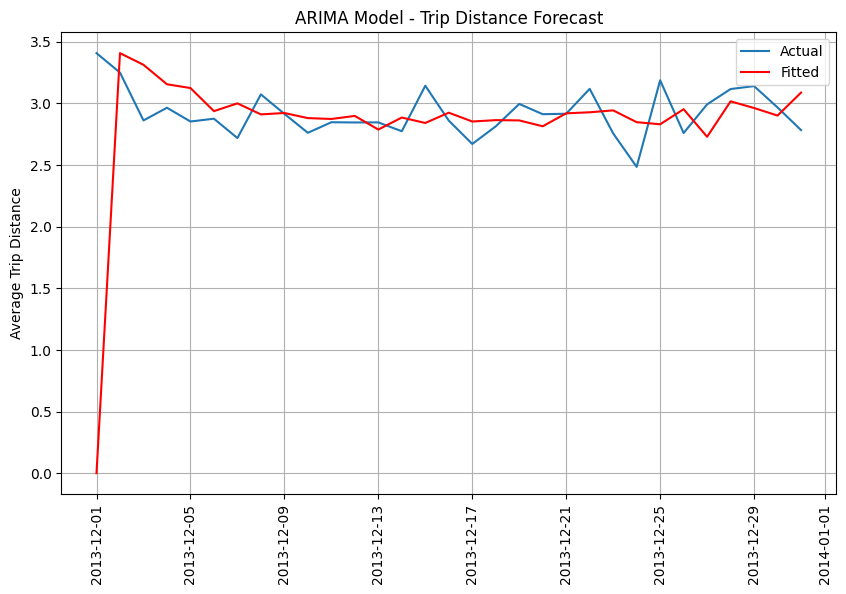

In [ ]:
avg_distance_daily = combined_df.groupBy("pickup_date").agg(F.avg("trip_distance").alias("avg_distance")).orderBy("pickup_date")
avg_distance_daily.show()
avg_distance_daily_pd = avg_distance_daily.toPandas()
avg_distance_daily_pd.set_index("pickup_date", inplace=True)

model = ARIMA(avg_distance_daily_pd["avg_distance"], order=(5,1,0))
model_fit = model.fit()

plt.figure(figsize=(10, 6))
plt.plot(avg_distance_daily_pd["avg_distance"], label="Actual")
plt.plot(model_fit.fittedvalues, color='red', label="Fitted")
plt.ylabel("Average Trip Distance")
plt.xticks(rotation = 90)
plt.title("ARIMA Model - Trip Distance Forecast")
plt.legend()
plt.grid(True)
plt.show()


84.How can seasonal patterns in trip distances be forecasted using SARIMA?

+-----------+------------------+
|pickup_date|      avg_distance|
+-----------+------------------+
| 2013-12-01| 3.406813778256191|
| 2013-12-02| 3.249251446070089|
| 2013-12-03|2.8610144472361805|
| 2013-12-04| 2.964072727272726|
| 2013-12-05| 2.852338392355258|
| 2013-12-06| 2.875003992547243|
| 2013-12-07|2.7181196581196603|
| 2013-12-08| 3.072277001994871|
| 2013-12-09|2.9145149136577695|
| 2013-12-10|2.7607917282127015|
| 2013-12-11|2.8463258877434163|
| 2013-12-12| 2.844646578428608|
| 2013-12-13| 2.845141361256548|
| 2013-12-14|2.7734264380530997|
| 2013-12-15|3.1424840764331234|
| 2013-12-16| 2.859736507936507|
| 2013-12-17|2.6701995950245845|
| 2013-12-18|2.8129345955249545|
| 2013-12-19| 2.994885386819483|
| 2013-12-20| 2.911639081687129|
+-----------+------------------+
only showing top 20 rows



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


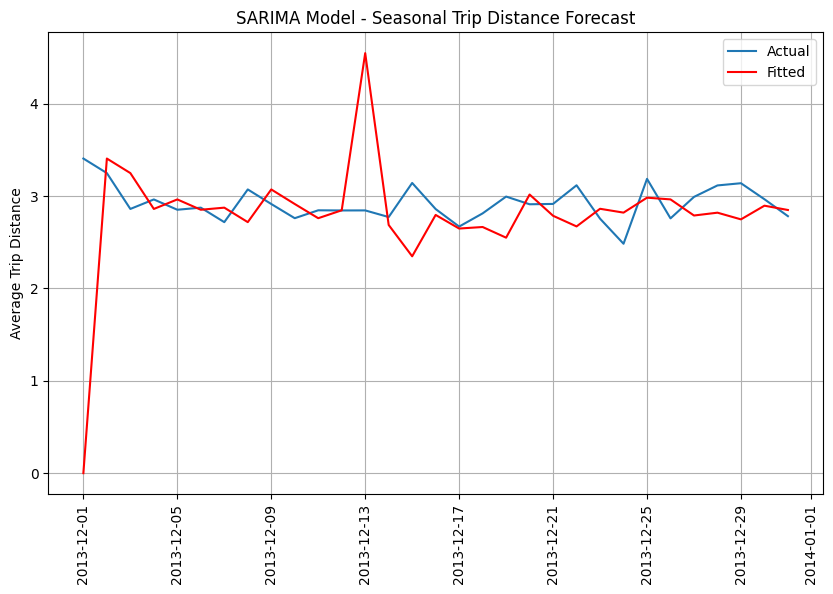

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

avg_distance_daily = combined_df.groupBy("pickup_date").agg(F.avg("trip_distance").alias("avg_distance")).orderBy("pickup_date")
avg_distance_daily.show()
avg_distance_daily_pd = avg_distance_daily.toPandas()
avg_distance_daily_pd.set_index("pickup_date", inplace=True)

model = SARIMAX(avg_distance_daily_pd["avg_distance"], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
model_fit = model.fit()

plt.figure(figsize=(10, 6))
plt.plot(avg_distance_daily_pd["avg_distance"], label="Actual")
plt.plot(model_fit.fittedvalues, color='red', label="Fitted")
plt.ylabel("Average Trip Distance")
plt.xticks(rotation = 90)
plt.title("SARIMA Model - Seasonal Trip Distance Forecast")
plt.legend()
plt.grid(True)
plt.show()


85.What is the correlation between fare amounts and trip distances?

In [ ]:
correlation = combined_df.stat.corr("fare_amount", "trip_distance")
print(f"Correlation between fare amounts and trip distances: {correlation}")

Correlation between fare amounts and trip distances: 0.9221520579251448


86.What is the correlation between fare amounts and trip times?

In [ ]:
correlation = combined_df.stat.corr("fare_amount", "trip_time_in_secs")
print(f"Correlation between fare amounts and trip times: {correlation}")

Correlation between fare amounts and trip times: 0.8219402508412748


87.What is the correlation between trip distances and trip times?

In [ ]:
correlation = combined_df.stat.corr("trip_distance", "trip_time_in_secs")
print(f"Correlation between trip distances and trip times: {correlation}")

Correlation between trip distances and trip times: 0.7499628458108714


88.What is the correlation between fare amounts and passenger counts?

In [ ]:
correlation = combined_df.stat.corr("fare_amount", "passenger_count")
print(f"Correlation between fare amounts and passenger counts: {correlation}")

Correlation between fare amounts and passenger counts: 0.016013508890231155


89.How can fare amount anomalies be detected using isolation forests?

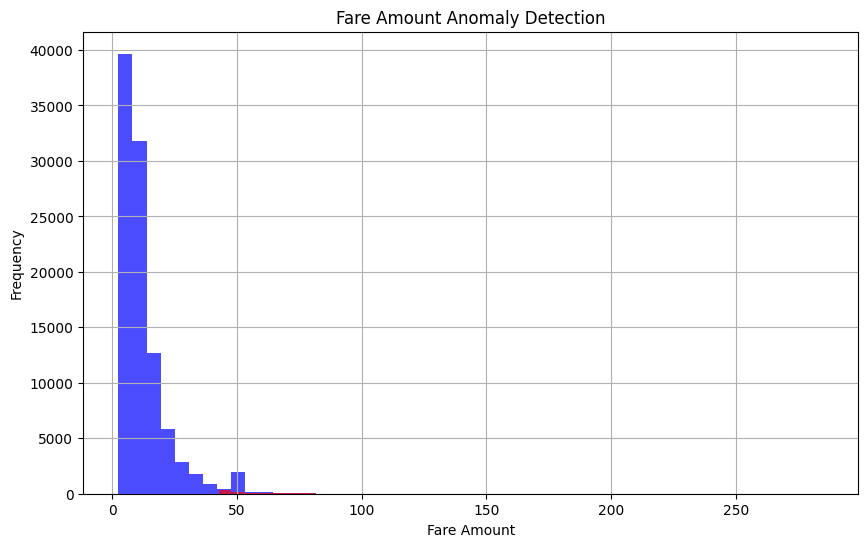

In [ ]:
from sklearn.ensemble import IsolationForest
import numpy as np

fare_amounts = combined_df.select("fare_amount").toPandas()

isolation_forest = IsolationForest(contamination=0.01)
fare_amounts["anomaly"] = isolation_forest.fit_predict(fare_amounts)

anomalies = fare_amounts[fare_amounts["anomaly"] == -1]

plt.figure(figsize=(10, 6))
plt.hist(fare_amounts["fare_amount"], bins=50, color='blue', alpha=0.7)
plt.hist(anomalies["fare_amount"], bins=50, color='red', alpha=0.7)
plt.xlabel("Fare Amount")
plt.ylabel("Frequency")
plt.title("Fare Amount Anomaly Detection")
plt.grid(True)
plt.show()


90.How can trip distance anomalies be detected using isolation forests?

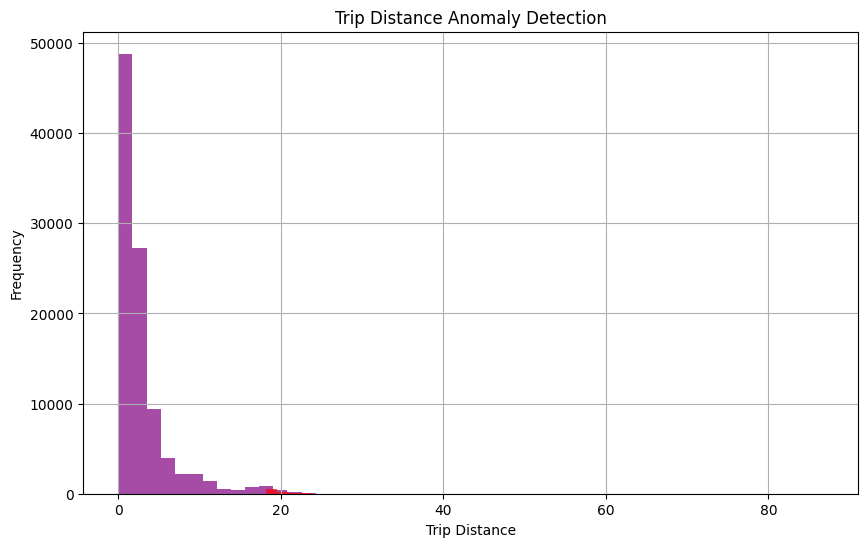

In [ ]:
trip_distances = combined_df.select("trip_distance").toPandas()

isolation_forest = IsolationForest(contamination=0.01)
trip_distances["anomaly"] = isolation_forest.fit_predict(trip_distances)

anomalies = trip_distances[trip_distances["anomaly"] == -1]

plt.figure(figsize=(10, 6))
plt.hist(trip_distances["trip_distance"], bins=50, color='purple', alpha=0.7)
plt.hist(anomalies["trip_distance"], bins=50, color='red', alpha=0.7)
plt.xlabel("Trip Distance")
plt.ylabel("Frequency")
plt.title("Trip Distance Anomaly Detection")
plt.grid(True)
plt.show()


91.How can fare amount anomalies be detected using Z-score analysis?

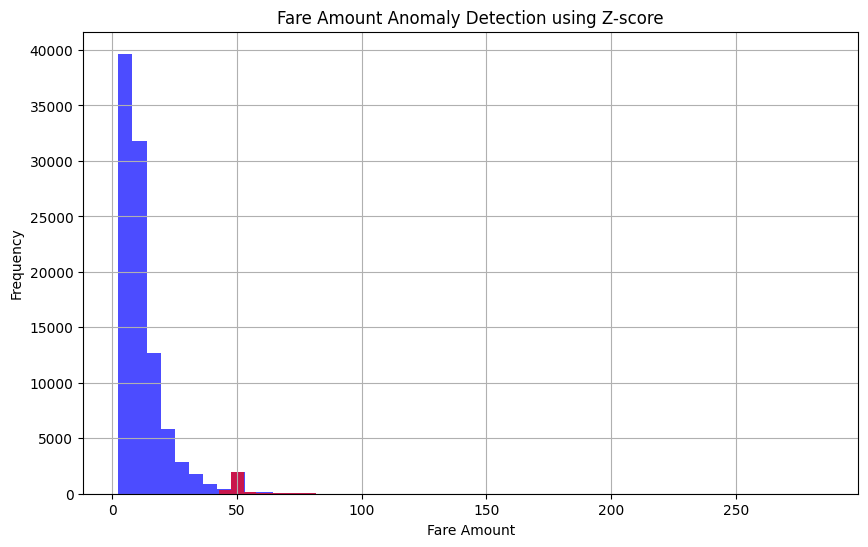

In [ ]:
from scipy.stats import zscore

fare_amounts = combined_df.select("fare_amount").toPandas()
fare_amounts["zscore"] = zscore(fare_amounts["fare_amount"])

anomalies = fare_amounts[fare_amounts["zscore"].abs() > 3]

plt.figure(figsize=(10, 6))
plt.hist(fare_amounts["fare_amount"], bins=50, color='blue', alpha=0.7)
plt.hist(anomalies["fare_amount"], bins=50, color='red', alpha=0.7)
plt.xlabel("Fare Amount")
plt.ylabel("Frequency")
plt.title("Fare Amount Anomaly Detection using Z-score")
plt.grid(True)
plt.show()

92.How can trip distance anomalies be detected using Z-score analysis?

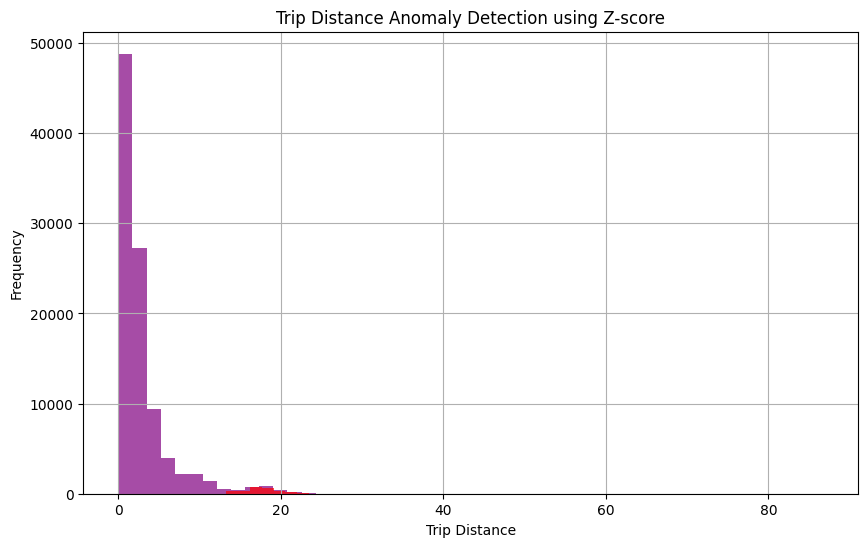

In [ ]:
trip_distances = combined_df.select("trip_distance").toPandas()
trip_distances["zscore"] = zscore(trip_distances["trip_distance"])

anomalies = trip_distances[trip_distances["zscore"].abs() > 3]

plt.figure(figsize=(10, 6))
plt.hist(trip_distances["trip_distance"], bins=50, color='purple', alpha=0.7)
plt.hist(anomalies["trip_distance"], bins=50, color='red', alpha=0.7)
plt.xlabel("Trip Distance")
plt.ylabel("Frequency")
plt.title("Trip Distance Anomaly Detection using Z-score")
plt.grid(True)
plt.show()

In [ ]:
import pyspark.sql.functions as F
from sklearn.preprocessing import MinMaxScaler
import numpy as np

# Select relevant features and preprocess them
df = combined_df.select("pickup_datetime", "trip_distance", "passenger_count",
                        "pickup_longitude", "pickup_latitude",
                        "dropoff_longitude", "dropoff_latitude", "fare_amount")

# Convert pickup_datetime to timestamp and extract hour and day
df = df.withColumn("pickup_datetime", F.to_timestamp("pickup_datetime")) \
       .withColumn("hour", F.hour("pickup_datetime")) \
       .withColumn("day", F.dayofweek("pickup_datetime"))

# Drop the original datetime column before conversion to Pandas
df = df.drop("pickup_datetime")

# Convert the Spark DataFrame to a Pandas DataFrame
df_pd = df.toPandas()

# Normalize the features
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df_pd.drop(columns=["fare_amount"]))

# Combine scaled features with the target column
df_scaled = np.hstack((df_scaled, df_pd["fare_amount"].values.reshape(-1, 1)))


In [ ]:
from sklearn.model_selection import train_test_split

# Define input features and target variable
X = df_scaled[:, :-1]
y = df_scaled[:, -1]

# Reshape X to fit the TCNN input shape requirements (samples, time steps, features)
X = X.reshape((X.shape[0], 1, X.shape[1]))

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Flatten, Dropout, Input

# Define the Temporal CNN model
model = Sequential()

# Input layer (add padding='same' if needed to maintain the input size)
model.add(Input(shape=(X_train.shape[1], X_train.shape[2])))
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', padding='same'))
model.add(Dropout(0.2))
model.add(Conv1D(filters=32, kernel_size=2, activation='relu', padding='same'))
model.add(Dropout(0.2))

# Flatten and add Dense layers
model.add(Flatten())
model.add(Dense(50, activation='relu'))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mse')


In [ ]:
# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=64, validation_data=(X_test, y_test), verbose=2)


Epoch 1/50
1230/1230 - 4s - 3ms/step - loss: 50.2385 - val_loss: 14.8606
Epoch 2/50
1230/1230 - 2s - 2ms/step - loss: 18.5292 - val_loss: 14.3227
Epoch 3/50
1230/1230 - 4s - 3ms/step - loss: 18.0288 - val_loss: 14.2807
Epoch 4/50
1230/1230 - 4s - 3ms/step - loss: 17.7193 - val_loss: 14.9763
Epoch 5/50
1230/1230 - 2s - 2ms/step - loss: 17.0331 - val_loss: 14.6377
Epoch 6/50
1230/1230 - 2s - 2ms/step - loss: 17.0885 - val_loss: 14.0174
Epoch 7/50
1230/1230 - 3s - 2ms/step - loss: 17.0280 - val_loss: 14.2620
Epoch 8/50
1230/1230 - 5s - 4ms/step - loss: 16.8414 - val_loss: 14.1573
Epoch 9/50
1230/1230 - 3s - 2ms/step - loss: 16.6987 - val_loss: 14.1553
Epoch 10/50
1230/1230 - 3s - 2ms/step - loss: 16.7414 - val_loss: 14.3571
Epoch 11/50
1230/1230 - 3s - 2ms/step - loss: 16.8617 - val_loss: 14.0245
Epoch 12/50
1230/1230 - 5s - 4ms/step - loss: 16.8228 - val_loss: 14.1138
Epoch 13/50
1230/1230 - 3s - 2ms/step - loss: 16.3055 - val_loss: 13.9127
Epoch 14/50
1230/1230 - 3s - 2ms/step - loss: 1

615/615 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


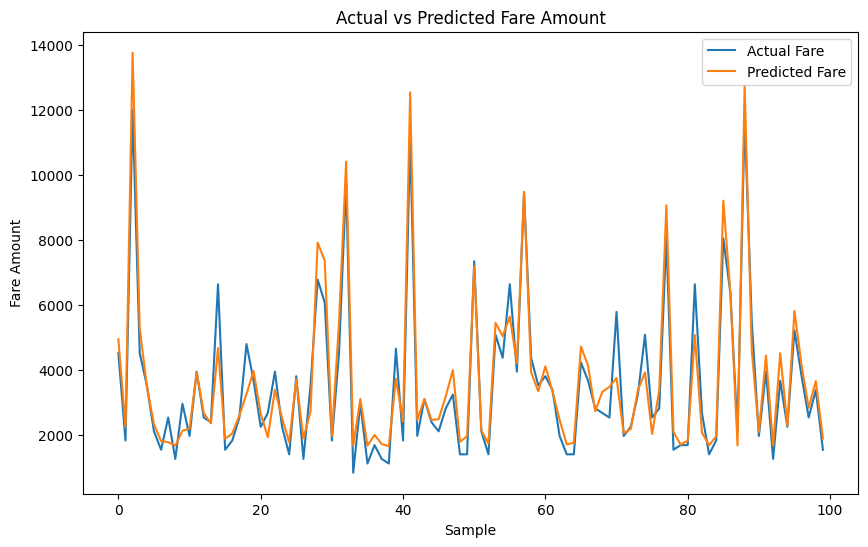

In [ ]:
# Assuming df_pd is the original Pandas DataFrame with all features
fare_scaler = MinMaxScaler()
fare_scaler.fit(df_pd[["fare_amount"]])

# Predict fare amounts on the test set
y_pred = model.predict(X_test)

# Optionally, inverse transform the predictions and ground truth to the original scale
y_pred_inverse = fare_scaler.inverse_transform(y_pred.reshape(-1, 1))
y_test_inverse = fare_scaler.inverse_transform(y_test.reshape(-1, 1))

# Compare predictions with actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(y_test_inverse[:100], label="Actual Fare")
plt.plot(y_pred_inverse[:100], label="Predicted Fare")
plt.xlabel("Sample")
plt.ylabel("Fare Amount")
plt.title("Actual vs Predicted Fare Amount")
plt.legend()
plt.show()

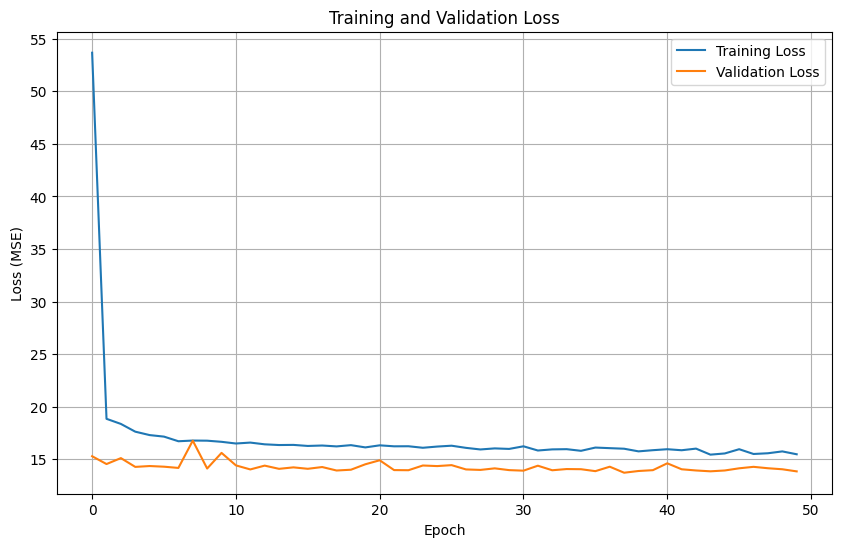

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation loss values
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss (MSE)')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()
